<img src="https://whatcar.vn/media/2018/09/car-lot-940x470.jpg"/>

# Прогнозирование стоимости автомобиля по характеристикам

* Работу выполнили Людмила Григорьева и Юлия Гиль
* Группа DSPR-28
* Дата сдачи 08.09.2021

# <a id="0"></a>TABLE OF CONTENTS

0. [TABLE OF CONTENTS](#0)
1. [IMPORT, FUNCTIONS, SETUP](#1)
2. [DATA AND PRELIMINARY ANALYSIS](#2)
3. [EDA AND BASIC DATA CLEANING](#3) 
    - [Унификация признаков test, train, train_new и объединение](#3.1)
    - [Очистка даных](#3.2)
    - [Дубликаты](#3.3)
    - [Обработка пропусков](#3.4)
    - [Детальный анализ признаков](#3.5)
    - [Генерация новых признаков](#3.6)
    - [Обработка выбросов](#3.7)
    - [Отбор признаков для моделирования](#3.8)
    - [Препроцессинг перед моделированием](#3.9)

4. [ML DATA PREPARATION](#4)
5. [M1: NAIVE MODEL](#5)
6. [M2: CatBoost](#6)
7. [LazyPredict](#7)
8. [M3: RandomForestRegressor](#8)
9. [M4: XGBRegressor](#9)
10. [M5: ExtraTreesRegressor](#10)
11. [M6: BaggingRegressor](#11)
12. [M7: HistGradientBoostingRegressor](#12)
13. [M8: StackingRegressor](#13)
14. [MODEL SELECTION](#14)
15. [SUBMISSION](#15)
16. [SUMMARY](#16)

<a id="1"></a>
# 1. IMPORT, FUNCTIONS, SETUP

In [2]:
#!pip3 install catboost

In [3]:
# pip install pandas-profiling

In [4]:
#!pip install lazypredict

In [5]:
# !pip install xgboost

In [6]:
import numpy as np
import pandas as pd
import sys
import re
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import time
import xgboost as xgb
import lazypredict

from lazypredict.Supervised import LazyRegressor
from pandas_profiling import ProfileReport
from scipy.stats import ttest_ind
from itertools import combinations
from tqdm.notebook import tqdm
from catboost import CatBoostRegressor

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor
from sklearn.ensemble import StackingRegressor

%matplotlib inline
warnings.simplefilter('ignore')
sns.set()

/Users/yuliyagil/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [7]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)

Python       : 3.8.10 (default, May 19 2021, 11:01:55) 
Numpy        : 1.19.1


In [8]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

In [9]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы
RANDOM_SEED = 42

## Functions

В данном блоке собраны пользовательские функции.

In [10]:
def mape(y_true, y_pred):
    """
    Функция возвращает метрику MAPE.
    На вход получает массив реальных и предсказанных значений y.
    """
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [11]:
def months_to_sent(months):
    """
    Функция, которая принимает на вход количество месяцев, а возвращает строку в формате "x  месяц(-а -ев)"
    """
    if months == 1:
        return f'{months} месяц'
    elif 2 <= months <= 4:
        return f'{months} месяца'
    return f'{months} месяцев'


def years_to_sent(years):
    """
    Функция, которая принимает на вход количество лет, а возвращает строку в формате "x  лет/год/года"
    """
    if 11 <= years <= 14 or 5 <= years % 10 <= 9 or years % 10 == 0:
        return f'{years} лет'
    elif years % 10 == 1:
        return f'{years} год'
    elif 2 <= years % 10 <= 4:
        return f'{years} годa'


def tenure(row):
    """
    Функция, которая приводит содержимое ячейки "Владение" в train к тому же виду, как в test.
    Вход: строка series (строка колонки).
    Выход: возвращает вместо словаря информацию в виде "x лет y месяцев"
    """
    row = re.findall('\d+', str(row))  # находим все целые числа в строке
    if row != []:
        years = 2020 - (int(row[0])+1)  # 2020, т.к. данные собраны в 2020 году
        months = 2 + (12 - int(row[1]))
        if years < 0:
            return months_to_sent(int(row[1]))
        elif years == 0 and months < 12:
            return months_to_sent(months)
        elif years >= 0 and months == 12:
            return years_to_sent(years + 1)
        elif years >= 0 and months > 12:
            return years_to_sent(years + 1)+' и '+months_to_sent(months - 12)
        elif years > 0 and months < 12:
            return years_to_sent(years)+' и '+months_to_sent(months)
        return None

In [12]:
def num_of_km(row):
    """
    Функция перевеодит формат данных "y yyy км" в количество км.
    Вход: строка series.
    Выход: количество км.
    """
    if pd.notnull(row):
        # разделяем строку на список из чисел и значения км
        list_km = row.split(' ')
        # print(list_km)
        if len(list_km) == 2:  # если содержится информация в км до 999
            if list_km[1] in ['км']:
                return int(list_km[0])
        return int(list_km[0]+list_km[1])  # км более 1000

In [13]:
def convert_engineDisplacement_to_float(row):
    """
    Функция, которая принимает строку, содержащую информацию про объеме двигателя, находит числовое значение (через точку, например 2.0),
    возвращает значение литров во float формате.
    """
    row = str(row)
    volume = re.findall('\d\.\d', row)
    if volume == []:
        return None
    return float(volume[0])

In [14]:
def intitial_eda_checks(df, missing_percent):
    '''
    Функция принимает на вход датафрейм, а также заданный порог % пустых значений, который хотим обработать. 
    На выход выводит на экран информацию о сумме пустых значений для всех колонок, а также проце
    '''
    if df.isnull().sum().sum() > 0:
        mask_total = df.isnull().sum().sort_values(ascending=False)
        total = mask_total[mask_total > 0]

        mask_percent = df.isnull().mean().sort_values(ascending=False)
        percent = mask_percent[mask_percent > 0]

        series = mask_percent[mask_percent > missing_percent]
        columns = series.index.to_list()

        missing_data = pd.DataFrame(pd.concat(
            [total, round(percent*100, 2)], axis=1, keys=['Количество', '%']))
        print('Сумма и процент значений NaN:\n \n')
        display(missing_data)
    else:
        print('NaN значения не найдены.')

In [15]:
def num_of_months(row):
    """
    Функция перевеодит формат данных "x лет y месяца(ев)" в количество месяцев.

    Вход: строка series.
    Выход: количество месяцев.
    """
    if pd.notnull(row) and row != 'no_data':
        list_ownership = row.split()  # разделяем строку на список из месяца и лет
        if len(list_ownership) == 2:  # если содержится информация только про годы
            if list_ownership[1] in ['год', 'года', 'лет']:
                return int(list_ownership[0])*12
            return int(list_ownership[0])  # переводим год в месяцы
        # случай, когда содержится инфо только про месяц
        # прибавляем к годам*12 количетсво месяцев
        return int(list_ownership[0])*12 + int(list_ownership[3])

In [16]:
def get_boxplot(column):
    """
    Функция для отрисовки коробочной диаграммы для нечисловых признаков.

    На вход получаем колоноку, для которой строим график.
    График отрисовываем относительно целевой переменной pricing, ограниченной по квантилю.
    """
    fig, ax = plt.subplots(figsize=(25, 5))
    plt.subplots_adjust(wspace=0.5)
    sns.boxplot(x=column, y='price',
                data=data[data['train'] == 1],
                ax=ax)
    plt.xticks(rotation=45)
    # поскольку в price много выбросов, огриничимся 75% квантилем
    ax.set_ylim(0, (data.price.quantile(0.75) + 8 *
                    (data.price.quantile(0.75) - data.price.quantile(0.25))))
    ax.set_title('Boxplot для ' + column)
    plt.show()

In [17]:
def analyze_cat_cols(col):
    """
    Функция для анализа категориального признака.

    На вход получаем колонку, для которой проводим анализ.

    В результате выводи графики:
        1. Распределение количества объявлений по признаку.
            Дополнительно, выводится график (прямая) возможного среднего количетсва объявлений по всем категориям признака, чтобы сравнить, насколько
            отклоняется от среднего та или иная категория признака.
        2. График боксплот для признака/целевой переменной (цены).
    """
    fig, axes = plt.subplots(figsize=(25, 5))
    # Посчитаем среднее значение количества объявлений по всем категориям признака
    mean = data[col].value_counts().values.mean()
    x = data[col].unique()
    # Построим графики по признаку и для среднего
    sns.histplot(data=data, x=data[col],
                 stat='count', bins=data[col].nunique())
    axes.plot(x, [mean for i in x], '--', color='r')
    plt.xticks(rotation=45)
    plt.title('Распределение количества объясвлений по '+col)
    plt.show()

    # Строим боксплот
    get_boxplot(col)

In [18]:
def km_per_year(row):
    """
    Функция делает пересчет км пробега автомобиля в год. 
    Для расчета количества лет использование берется год производства автомобиля.

    Вход: строка датафрейма.
    Выход: информация о км/год.
    """
    if row['mileage'] != 0:
        # обрабатываем случаи, когда мошина произведена в год сбора данных, чтоб не делить на 0
        if row['parsing_date'].year - row['productionDate'] == 0:
            return row['mileage']
        else:
            return row['mileage']/(row['parsing_date'].year - row['productionDate'])
    return 0  # возвращаем 0, если машина без пробега (новая)

In [19]:
def prod_date_range(row, year_lim):
    """
    Функция для создания столбца с информацией, старше ли авто, чем year_lim.
    Вход: строка, установленный лимит.
    Выход: 
        1 - если авто старше
        0 - если нет.
    """
    if (row['parsing_date'].year-row['productionDate']) >= year_lim:
        return 1
    return 0

In [20]:
def iqr_analysis(series, mode=False):
    """
    Функция выводит инфорамцию о границах выборосов для признака.
    Если mode = True, возвращается верхняя и нижняя границы выбросов. Иначе, просто выводится информация на экран.
    """
    IQR = series.quantile(0.75) - series.quantile(0.25)
    perc25 = series.quantile(0.25)
    perc75 = series.quantile(0.75)

    f = perc25 - 1.5*IQR
    l = perc75 + 1.5*IQR

    if mode:
        return f, l

    print(
        "\n25-й перцентиль: {},".format(perc25),
        "\n75-й перцентиль: {},".format(perc75),
        "\nIQR: {}, ".format(IQR),
        "\nГраницы выбросов: [{f}, {l}].".format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR),
        "\n\nМинимальное значение признака: {}.".format(series.min()),
        "\nМаксимальное значение признака: {} .\n".format(series.max()))

    if series.min() < f:
        print("Найдены выбросы по нижней границе признака! Количество: {}, {}%".format(series.where(
            series < f).count(), round(series.where(series < f).count()/series.count()*100, 2)))
    if series.max() > l:
        print("Найдены выбросы по верхней границе признака! Количество: {}, {}%".format(series.where(
            series > l).count(), round(series.where(series > l).count()/series.count()*100, 2)))

In [21]:
def get_stat_dif(column):
    """ 
    Поиск статистически значимых различий для колонки с помощью теста Стьюдента.
    """
    cols = data.loc[:, column].value_counts().index[:]
    combinations_all = list(combinations(cols, 2))

    tmp = data[data['train'] == 1]

    for comb in combinations_all:
        if ttest_ind(tmp.loc[data[data['train'] == 1].loc[:, column] == comb[0], 'price'],
                     tmp.loc[data[data['train'] == 1].loc[:, column] == comb[1], 'price']).pvalue <= 0.05/len(combinations_all):  # учли поправку Бонферони
            # print('Найдены статистически значимые различия для колонки и комбинаций', column, comb)
            pass
        else:
            print(
                'Не найдены статистически значимые различия для колонки и комбинации', column, comb)
            return column
            break

## Setup

In [22]:
VERSION = 17
# подключил к ноутбуку внешний датасет
DIR_TRAIN = '../input/parsing-all-moscow-auto-ru-09-09-2020/'
DIR_TRAIN_NEW = '../input/autorucars/'
DIR_TEST = '../input/sf-dst-car-price-prediction/'
VAL_SIZE = 0.20   # 20%

<a id="2"></a>
# 2. DATA AND PRELIMINARY ANALYSIS

## Data Storage

In [23]:
!ls '../input'

ls: ../input: No such file or directory


In [24]:
# Подключение с Kaggle
# train = pd.read_csv(DIR_TRAIN+'all_auto_ru_09_09_2020.csv') # датасет для обучения модели
#test = pd.read_csv(DIR_TEST+'test.csv')
#sample_submission = pd.read_csv(DIR_TEST+'sample_submission.csv')

In [25]:
# Подключение при работе в Jupyter/Github
train = pd.read_csv('all_auto_ru_09_09_2020.csv')
test = pd.read_csv('test.csv')
sample_submission = pd.read_csv('sample_submission.csv')

In [26]:
train.head()

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model
0,Седан,AUDI,040001,бензин,1990.00,2.8 MT (174 л.с.) 4WD,4.00,1991,SEDAN MECHANICAL 2.8,MECHANICAL,...,LEFT,nan,3.00,ORIGINAL,True,NaN,200000.00,2019-10-03T08:09:11Z,nan,100
1,Седан,AUDI,EE1D19,бензин,1982.00,1.8 MT (90 л.с.),4.00,1986,SEDAN MECHANICAL 1.8,MECHANICAL,...,LEFT,nan,3.00,ORIGINAL,True,NaN,60000.00,2020-09-06T06:49:40Z,nan,100
2,Универсал 5 дв.,AUDI,0000CC,бензин,1988.00,2.3 MT (136 л.с.) 4WD,5.00,1989,WAGON_5_DOORS MECHANICAL 2.3,MECHANICAL,...,LEFT,nan,3.00,ORIGINAL,True,NaN,99000.00,2020-09-02T14:04:21Z,nan,100
3,Седан,AUDI,CACECB,бензин,1988.00,1.8 MT (90 л.с.),4.00,1989,SEDAN MECHANICAL 1.8,MECHANICAL,...,LEFT,nan,3.00,ORIGINAL,True,NaN,65000.00,2020-08-23T17:40:09Z,nan,100
4,Седан,AUDI,040001,бензин,1990.00,2.0 MT (101 л.с.),4.00,1991,SEDAN MECHANICAL 2.0,MECHANICAL,...,LEFT,nan,3.00,DUPLICATE,True,NaN,100000.00,2020-09-08T09:22:07Z,nan,100


In [27]:
test.head()

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,...,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня
0,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,синий,NaN,"Все автомобили, представленные в продаже, прох...",1.2 LTR,105 N12,"{""engine-proof"":true,""tinted-glass"":true,""airb...",бензин,...,LIFTBACK ROBOT 1.2,роботизированная,EUROPEAN,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
1,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,чёрный,NaN,ЛОТ: 01217195\nАвтопрага Север\nДанный автомоб...,1.6 LTR,110 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,...,LIFTBACK MECHANICAL 1.6,механическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
2,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/superb/11...,серый,"{""id"":""20026336"",""name"":""Ambition"",""available_...","Все автомобили, представленные в продаже, прох...",1.8 LTR,152 N12,"{""cruise-control"":true,""tinted-glass"":true,""es...",бензин,...,LIFTBACK ROBOT 1.8,роботизированная,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
3,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,коричневый,"{""id"":""20803582"",""name"":""Ambition"",""available_...",КОМПЛЕКТ ЗИМНЕЙ (ЛЕТНЕЙ) РЕЗИНЫ ПО СЕЗОНУ В ПО...,1.6 LTR,110 N12,"{""cruise-control"":true,""roller-blind-for-rear-...",бензин,...,LIFTBACK AUTOMATIC 1.6,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
4,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,белый,NaN,ЛОТ: 01220889\nАвтопрага Север\n\nВы можете по...,1.8 LTR,152 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,...,LIFTBACK AUTOMATIC 1.8,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен


In [28]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89378 entries, 0 to 89377
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              89377 non-null  object 
 1   brand                 89378 non-null  object 
 2   color                 89378 non-null  object 
 3   fuelType              89378 non-null  object 
 4   modelDate             89377 non-null  float64
 5   name                  89377 non-null  object 
 6   numberOfDoors         89377 non-null  float64
 7   productionDate        89378 non-null  int64  
 8   vehicleConfiguration  89377 non-null  object 
 9   vehicleTransmission   89377 non-null  object 
 10  engineDisplacement    89377 non-null  object 
 11  enginePower           89377 non-null  float64
 12  description           86124 non-null  object 
 13  mileage               89378 non-null  int64  
 14  Комплектация          89378 non-null  object 
 15  Привод             

In [29]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  object
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15  name                  34686 non-null

## Additional Data Parsing 

### Подготовка к парсингу
Посмотрим на список колонок, которые есть в test, но нет в подключенном train.

In [30]:
# Список колонок, которых нет в train
dif_list = list(set(test.columns).difference(train.columns))
print("Список колонок, которых нет в train, но есть в test:", dif_list)

# Посмотрим на данные в этих колонках
test[dif_list].sample(3)

Список колонок, которых нет в train, но есть в test: ['complectation_dict', 'model_info', 'equipment_dict', 'car_url', 'model_name', 'vendor', 'super_gen', 'priceCurrency', 'image', 'sell_id', 'parsing_unixtime']


,complectation_dict,model_info,equipment_dict,car_url,model_name,vendor,super_gen,priceCurrency,image,sell_id,parsing_unixtime
15729,NaN,"{""code"":""E_KLASSE"",""name"":""E-Класс"",""ru_name"":...","{""cruise-control"":true,""asr"":true,""airbag-driv...",https://auto.ru/cars/used/sale/mercedes/e_klas...,E_KLASSE,EUROPEAN,"{""id"":""20094320"",""name"":""400"",""nameplate"":""400...",RUB,https://avatars.mds.yandex.net/get-autoru-vos/...,1101210198,1603241239
13963,NaN,"{""code"":""MAXIMA"",""name"":""Maxima"",""ru_name"":""Ма...","{""electro-window-back"":true,""mirrors-heat"":tru...",https://auto.ru/cars/used/sale/nissan/maxima/1...,MAXIMA,JAPANESE,"{""id"":""4760332"",""displacement"":1995,""engine_ty...",RUB,https://avatars.mds.yandex.net/get-autoru-vos/...,1100900546,1603280426
18434,NaN,"{""code"":""C_KLASSE"",""name"":""C-Класс"",""ru_name"":...",NaN,https://auto.ru/cars/used/sale/mercedes/c_klas...,C_KLASSE,EUROPEAN,"{""id"":""20496319"",""name"":""230"",""nameplate"":""230...",RUB,https://autoru.naydex.net/mcQh17801/f1b5751dCi...,1100942536,1603251644


In [31]:
# Посмотрим на колическтво уникальных значений
for item in dif_list:
    print(item, test[item].nunique())

complectation_dict 2364
model_info 954
equipment_dict 23705
car_url 34686
model_name 544
vendor 2
super_gen 5890
priceCurrency 1
image 34557
sell_id 34686
parsing_unixtime 34686


Выводы:
1. Из информации `car_url` видим, что данные собирались с сайта auto.ru, будем парсить данные оттуда
2. Следующие поля из test можно не парсить и удалить далее при анализе, т.к. они уникальны для каждой записи: `car_url` и `priceCurrency`, т.к. всего одно значение (RUB). Car_url оставим, чтоб можно было посмотреть информацию о машине.
3. Ограничимся для начала двумя вендорами: EUROPEAN, JAPANESE, далее можно расширить
4. Цену автомобиля собираем в RUB
5. Собираем информацию по полям: `bodyType`, `brand`, `car_url`, `color`, `complectation_dict`, `description`, `engineDisplacement`, `enginePower`, `equipment_dict`,`fuelType`, `image`, `mileage`, `modelDate`, `model_info`, `model_name`,`name`, `numberOfDoors`, `parsing_unixtime`, `priceCurrency`,`productionDate`, `sell_id`, `super_gen`, `vehicleConfiguration`,`vehicleTransmission`, `vendor`, `Владельцы`, `Владение`, `ПТС`,`Привод`, `Руль`, `Состояние`, `Таможня`, `sample`, `price`

### Результаты парсинга с auto.ru

Краткая самари:
1. Код парсинга новых данных доступе в отдельном ноутбуке на Git - [[SF-DST Car Price Prediction] Parsing Data DSPR-28.ipynb](https://github.com/juliiik/SF_DSPR_28_Gil/blob/main/module_6/%5BSF-DST%20Car%20Price%20Prediction%5D%20Parsing%20Data%20DSPR-28.ipynb).
2. 27.08.2021 командой получен список со ссылками на 137559 объявлений по выбранным маркам автомобилей по всем регионам, 29.08.2021 этот список был обновлен, в результате чего было получено дополнительно еще 133 объявления. 
3. По результатам парсинга нами были получены данные для обучающего датасета в размере `137685` записей
4. Путь к файлу:
    - Kaggle: ../input/autorucars/all_car_27_08_2021_data_12_brands.csv
    - Github: https://github.com/juliiik/SF_DSPR_28_Gil/blob/main/module_6/all_car_27_08_2021_data_12_brands.csv

In [32]:
# Добавим датафрейм с новыми данными Jupyter
train_new = pd.read_csv('all_car_27_08_2021_data_12_brands.csv', sep=",")

In [33]:
# Добавим датафрейм с новыми данными Kaggle
#train_new = pd.read_csv(DIR_TRAIN_NEW+'all_car_27_08_2021_data_12_brands.csv', sep=",")

In [34]:
train_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137685 entries, 0 to 137684
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            137685 non-null  int64  
 1   car_url               137685 non-null  object 
 2   bodyType              137685 non-null  object 
 3   brand                 137685 non-null  object 
 4   color                 137685 non-null  object 
 5   complectation_dict    137685 non-null  object 
 6   description           137685 non-null  object 
 7   engineDisplacement    137685 non-null  object 
 8   enginePower           137685 non-null  object 
 9   equipment_dict        137685 non-null  object 
 10  fuelType              137685 non-null  object 
 11  image                 137616 non-null  object 
 12  mileage               105817 non-null  object 
 13  modelDate             137685 non-null  int64  
 14  model_name            105817 non-null  object 
 15  

In [35]:
train_new.head()

,Unnamed: 0,car_url,bodyType,brand,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,...,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,region
0,0,https://auto.ru/cars/used/sale/skoda/fabia/110...,хэтчбек 5 дв.,SKODA,серебристый,"['heated-wash-system', 'airbag-passenger', 'lo...",Один хозяин Выпуск По ПТС 2012 года покупка с ...,1.4 LTR,86 N12,"{'condition': True, 'bluetooth': True, 'aux': ...",...,HATCHBACK_5_DOORS MECHANICAL 1.4,механическая,1 владелец,8 лет и 9 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Екатеринбурге
1,1,https://auto.ru/cars/used/sale/skoda/octavia/1...,лифтбек,SKODA,чёрный,[],Авто в хорошем состоянии В этом году производи...,1.4 LTR,75 N12,"{'condition': True, 'dark-interior': True, 'fa...",...,LIFTBACK MECHANICAL 1.4,механическая,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Нижнегорском
2,2,https://auto.ru/cars/used/sale/skoda/kodiaq/11...,внедорожник 5 дв.,SKODA,бежевый,"['cruise-control', 'multi-wheel', 'heated-wash...",Комплект зимних шин Nokian Hakka 8 в подарок С...,2.0 LTR,150 N12,"{'automatic-lighting-control': True, 'seats-5'...",...,ALLROAD_5_DOORS ROBOT 2.0,роботизированная,1 владелец,1 год и 2 месяца,Оригинал,полный,Левый,Не требует ремонта,Растаможен,в Санкт-Петербурге
3,3,https://auto.ru/cars/new/group/skoda/kodiaq/20...,внедорожник 5 дв.,SKODA,белый,"['cruise-control', 'multi-wheel', 'heated-wash...",В стоимость автомобиля включено дополнительное...,2.0 LTR,180 N12,"{'cruise-control': True, 'asr': True, 'esp': T...",...,ALLROAD_5_DOORS ROBOT 2.0,роботизированная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,https://auto.ru/cars/used/sale/skoda/fabia/110...,хэтчбек 5 дв.,SKODA,бежевый,"['heated-wash-system', 'airbag-passenger', 'lo...",Один собственник Сделана полная предпродажная...,1.6 LTR,105 N12,"{'engine-proof': True, 'esp': True, 'airbag-dr...",...,HATCHBACK_5_DOORS MECHANICAL 1.6,механическая,1 владелец,6 лет и 9 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Екатеринбурге


In [36]:
# Сразу удалим колонку с дубликатом урла
train_new.drop('Unnamed: 0', axis=1, inplace=True)

# <a id="3"></a> 3. EDA AND BASIC DATA CLEANING

Проведем анализ данных, сделаем базовый препроцессинг данных.

### <a id="3.1"></a>3.1 Унификация признаков  в test, train, train_new  и объединение

#### Переименуем колонки с кириллицы на латиницу

In [37]:
# Переименуем test колонки
test.rename(columns={"Привод": "drivetrain",
                     "Руль": "driveSide",
                     "Состояние": "condition",
                     "Владельцы": "ownersCount",
                     "ПТС": "tcp",
                     "Таможня": "customs",
                     "Владение": "ownershipTime",
                     "model_name": "model"}, inplace=True)

# Переименуем train колонки
train.rename(columns={"Привод": "drivetrain",
                      "Руль": "driveSide",
                      "Состояние": "condition",
                      "Владельцы": "ownersCount",
                      "ПТС": "tcp",
                      "Таможня": "customs",
                      "Владение": "ownershipTime"}, inplace=True)

# Переименуем train_new колонки
train_new.rename(columns={"Привод": "drivetrain",
                          "Руль": "driveSide",
                          "Состояние": "condition",
                          "Владельцы": "ownersCount",
                          "ПТС": "tcp",
                          "Таможня": "customs",
                          "Владение": "ownershipTime",
                          "model_name": "model"}, inplace=True)

#### Предварительный анализ test данных

Посмотрим на данные в test, которые нужно предсказывать, на особенности данных.

In [38]:
ProfileReport(test, title="Pandas Profiling Report for Test Dataset")

Summarize dataset:   0%|          | 0/45 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы: во время последующего сбора данных и анализа обратить внимание на:
1. Есть пропуски в test данных - нужно попробовать заполнить
2. Представлено всего 12 брендов автомобилей
3. Признаки, которые выглядят бесполезными для моделирования - `car_url` (уникальный для каждой записи), `priceCurrencly` (одинаковый у всех)
4. Необходимо разобраться с признаками `complectation_dict`, `description`, `equipment_dict`, `model_info`, `super_gen` - посмотреть, можно ли извлечь доп. признаки
5. `Condition` - у всех "хорошее состояние", обратить внимание, если в train будут записи и другим состоянием, может влиять на выбросы по цене.
6. `Customs` - у всех "растоможетн", обратить внимание, если в train будут записи и другим состоянием, может влиять на выбросы по цене.

#### Сравним типы данных в test и train

Найдем расхождения в типах данных для train и test, устраним их до анализа данных.

In [39]:
# Создадим список с колонками, которые присутствуют и в train, и в test
cols_intersection = list(set(test.columns).intersection(train.columns))

In [40]:
# Проверим, в каких колонках типы данных различаются у train и test
cols_type_dif = []  # создаем список с колонками, в которых типы данных отличаются
print("Найдены расхождения в типах данных для:")

for col in cols_intersection:
    if type(test[col][0]) != type(train[col][0]):
        print(
            f"\t- колонки {col}: для train - {type(train[col][0])}, для test - {type(test[col][0])}")
        cols_type_dif.append(col)

Найдены расхождения в типах данных для:
	- колонки numberOfDoors: для train - <class 'numpy.float64'>, для test - <class 'numpy.int64'>
	- колонки modelDate: для train - <class 'numpy.float64'>, для test - <class 'numpy.int64'>
	- колонки condition: для train - <class 'numpy.float64'>, для test - <class 'str'>
	- колонки enginePower: для train - <class 'numpy.float64'>, для test - <class 'str'>
	- колонки customs: для train - <class 'numpy.bool_'>, для test - <class 'str'>
	- колонки ownersCount: для train - <class 'numpy.float64'>, для test - <class 'str'>


In [41]:
# Создадим список с колонками, которые присутствуют и в train, и в test
cols_intersection_2 = list(set(test.columns).intersection(train_new.columns))

In [42]:
# Проверим, в каких колонках типы данных различаются у train и test
cols_type_dif = []  # создаем список с колонками, в которых типы данных отличаются
print("Найдены расхождения в типах данных для:")

for col in cols_intersection_2:
    if type(test[col][0]) != type(train_new[col][0]):
        print(
            f"\t- колонки {col}: для train_new - {type(train_new[col][0])}, для test - {type(test[col][0])}")
        cols_type_dif.append(col)

Найдены расхождения в типах данных для:
	- колонки complectation_dict: для train_new - <class 'str'>, для test - <class 'float'>
	- колонки ownershipTime: для train_new - <class 'str'>, для test - <class 'float'>
	- колонки mileage: для train_new - <class 'str'>, для test - <class 'numpy.int64'>


**`ownersCount`**

Количество владельцев автомобиля (1 - один, 2 - два, 3 - 3 и более).

In [43]:
print("Уникальные значения для train", train.ownersCount.unique())
print("Уникальные значения для train_new", train_new.ownersCount.unique())
print("Уникальные значения для test", test.ownersCount.unique())

Уникальные значения для train [ 3.  1.  2. nan]
Уникальные значения для train_new ['1 владелец' '3 или более' nan '2 владельца']
Уникальные значения для test ['3 или более' '1\xa0владелец' '2\xa0владельца']


Преобразуем значения test, train_new в числовые (float).

In [44]:
# Создаем словать с кодировкой значений в числовые
ownersCount_dict = {"3 или более": 3.,
                    "1\xa0владелец": 1., "2\xa0владельца": 2.}
test['ownersCount'].replace(
    to_replace=ownersCount_dict, inplace=True)  # заменяем значения в соответствии со словарем

In [45]:
ownersCount_dict = {
    "1 владелец": 1., "2 владельца": 2., "3 или более": 3.}
train_new['ownersCount'].replace(
    to_replace=ownersCount_dict, inplace=True)  # заменяем значения в соответствии со словарем

In [46]:
# Проверяем результаты преобразования
print("Уникальные значения для test", test.ownersCount.unique())
print("Уникальные значения для train_new", train_new.ownersCount.unique())

Уникальные значения для test [3. 1. 2.]
Уникальные значения для train_new [ 1.  3. nan  2.]


**`enginePower`**

Мощность л.с.

In [47]:
print("Пример значения для train", train.enginePower.sample(1).values)
print("Пример значения для train_new", train_new.enginePower.sample(1).values)
print("Пример значения для test", test.enginePower.sample(1).values)

Пример значения для train [395.]
Пример значения для train_new ['143 N12']
Пример значения для test ['165 N12']


Преобразуем значения test, train_new в числовые (float).

In [48]:
# Преобразовываем значения столбца, избавляемся от постфика N12
test['enginePower'] = test['enginePower'].apply(
    lambda x: float(x.split(" ")[0]))
train_new['enginePower'] = train_new['enginePower'].apply(
    lambda x: float(x.split(" ")[0]))

In [49]:
# Посмотрим на результат преобразования
print("Пример значения для test", test.enginePower.sample(1).values)
print("Пример значения для train_new", train_new.enginePower.sample(1).values)

Пример значения для test [286.]
Пример значения для train_new [367.]


**`numberOfDoors`**

Количество дверей.

In [50]:
print("Уникальные значения для train", train.numberOfDoors.unique())
print("Уникальные значения для train_new", train_new.numberOfDoors.unique())
print("Уникальные значения для test", test.numberOfDoors.unique())

Уникальные значения для train [ 4.  5.  3.  2. nan  0.]
Уникальные значения для train_new [5 4 3 2]
Уникальные значения для test [5 4 2 3 0]


Значения аналогичны, целые числа, приведем в train к int.

In [51]:
# Конвертируем в int
train['numberOfDoors'] = train['numberOfDoors'].astype('Int64')

**`customs`**

Информация, растоможен ли автомобиль: 0 - не растоможен, 1 - растоможен.

In [52]:
print("Уникальные значения для train", train.customs.unique())
print("Уникальные значения для train_new", train_new.customs.unique())
print("Уникальные значения для test", test.customs.unique())

Уникальные значения для train [ True]
Уникальные значения для train_new ['Растаможен' nan]
Уникальные значения для test ['Растаможен']


Поскольку далее для моделирования нам понадобится числовая переменная, то сразу переведем в числовую 0 - не растоможен, 1 - растоможен, как для train, так и для test.

In [53]:
# Делаем преобразование значений в int (0 или 1)
train['customs'] = train['customs'].apply(lambda x: 1 if x == True else 0)
test['customs'] = test['customs'].apply(
    lambda x: 1 if x == "Растаможен" else 0)
train_new['customs'] = train_new['customs'].apply(
    lambda x: 1 if x == "Растаможен" else 0)

**`condition`**

Состояние автомобиля: 0 - не требует ремонта , 1 - требует ремонта.

In [54]:
print("Уникальные значения для train", train.condition.unique())
print("Уникальные значения для train_new", train_new.condition.unique())
print("Уникальные значения для test", test.condition.unique())

Уникальные значения для train [nan]
Уникальные значения для train_new ['Не требует ремонта' nan]
Уникальные значения для test ['Не требует ремонта']


Поскольку далее для моделирования нам понадобится числовая переменная, то сразу переведем в числовую 0 - требует ремонта , 1 - не требует ремонта, как для train, так и для test.

In [55]:
# Делаем преобразование значений в int (0 или 1)
train['condition'] = train['condition'].apply(lambda x: 0 if pd.isna(x) else 1)
test['condition'] = test['condition'].apply(
    lambda x: 0 if x == "Не требует ремонта" else 1)
train_new['condition'] = train_new['condition'].apply(
    lambda x: 0 if x == "Не требует ремонта" else 1)

**`modelDate`**

Год выпуска модели автомобиля.

In [56]:
print("Уникальные значения для train", train.modelDate.unique())
print("Уникальные значения для train_new", train_new.modelDate.unique())
print("Уникальные значения для test", test.modelDate.unique())

Уникальные значения для train [1990. 1982. 1988. 1976. 1983. 1979. 1986. 1991. 1978. 1987. 1992. 1938.
 2010. 2014. 2000. 2016. 2004. 2012. 2008. 1996. 2003. 2015. 2011. 2007.
 1999. 1994. 2009. 2018. 2001. 1997. 2006. 2019. 2013. 2017. 2002. 2005.
 1980. 1984. 1998. 1966. 1975. 1937. 1936. 1949. 2020. 1995. 1981. 1972.
 1977. 1989. 1968. 1985. 1958. 1971. 1956. 1955. 1970. 1963. 1973. 1964.
 1957. 1993. 1960. 1927. 1908. 1932.   nan 1965. 1935. 1967. 1948. 1969.
 1934. 1974. 1950. 1961. 1904. 1959. 1951.]
Уникальные значения для train_new [2010 2000 2016 2015 2013 2017 2008 2020 2012 1996 2009 2014 2011 2007
 2018 2004 1999 2019 1998 2006 2005 2003 1995 2001 1990 1994 1991 2002
 2021 1987 1997 1981 1953 1992 1979 1988]
Уникальные значения для test [2013 2017 2008 2009 2016 2012 2015 2010 2006 2000 2007 1994 2004 1999
 2005 1976 2001 1969 1996 1998 1989 1934 2014 2011 2018 1986 1997 1990
 2019 2002 1991 1987 1980 1982 1938 1988 2003 1983 1978 1979 1984 1992
 1995 1993 1985 1974 1966 19

Годы - целые числа. Преобразуем train данные в int.

In [57]:
train['modelDate'] = train['modelDate'].astype('Int64')

**`ownershipTime`**

Вемя владения автомобилем. 

Несмотря на то, что тип данных совпадает, формат хранения информации в train и test отличается.

In [58]:
# Применяем функцию по очистке данных и приведению их к такому же виду, как в test выборке.
train['ownershipTime'] = train['ownershipTime'].apply(tenure)

In [59]:
train['ownershipTime'] = train['ownershipTime'].fillna('no_data')

**`mileage`**

Пробег. Для данных в train_new указаны км и есть пробелы, нужно привести к числовому формату.

In [60]:
print("Пример значения для train",
      train[train['mileage'].isnull() == False]['mileage'].sample(1).values)
print("Пример значения для train_new",
      train_new[train_new['mileage'].isnull() == False]['mileage'].sample(1).values)
print("Пример значения для test",
      test[test['mileage'].isnull() == False]['mileage'].sample(1).values)

Пример значения для train [10600]
Пример значения для train_new ['195 059 км']
Пример значения для test [140000]


In [61]:
train_new['mileage'] = train_new['mileage'].apply(num_of_km)

**`engineDisplacement`**

Объем двигателя в литрах, нужно привести к общему формату во всех датасетах.

In [62]:
print("Пример значения для train", train[train['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)
print("Пример значения для train_new", train_new[train_new['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)
print("Пример значения для test", test[test['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)

Пример значения для train ['1.6']
Пример значения для train_new ['1.3 LTR']
Пример значения для test ['2.0 LTR']


_`train['engineDisplacement']`_

Необходимо вытащить мощность из текущего поля, но извлечь из `engineDisplacement` не получится, зато вся информация есть в поле name, где после строкового названия перечислен объем в формате числа с точкой (.). 

In [63]:
# Сконвертируем информацию о мощности двигателя из поля name
train['engineDisplacement'] = train['name'].apply(
    convert_engineDisplacement_to_float)

In [64]:
# Сразу проверим пропуски
len(train[train['engineDisplacement'].isna()])

110

In [65]:
# Пропуски для электро машин, понятно причина пропуска, обработаем позже
train[train['engineDisplacement'].isna()].fuelType.unique()

array(['электро', 'универсал'], dtype=object)

_`train_new['engineDisplacement']`, `test['engineDisplacement']`_

Избавимся от LTR в наименовании объема двигателя и конвертируем во float.

In [66]:
# Сконвертируем информацию о мощности двигателя
train_new['engineDisplacement'] = train_new['engineDisplacement'].apply(
    convert_engineDisplacement_to_float)
# Для значений 'LTR' заменим на 0, т.к. это электрокары
test[test['engineDisplacement'] == ' LTR']['engineDisplacement'].replace(
    " LTR", "0.0 LTR", inplace=True)
# Сконвертируем информацию во float
test['engineDisplacement'] = test['engineDisplacement'].apply(
    convert_engineDisplacement_to_float)

#### Совмещаем test, train, train_new для обработки и анализа

До совмещения test и train посмотрим, какие признаки можем извлечь из test/train, помимо колонок, которые в явном виде пересекаются между датафреймами.

In [67]:
# Список колонок, которых нет в train, но есть в test
dif_list_test = list(set(test.columns).difference(train.columns))
print("Список колонок, которых нет в train, но есть в test:", dif_list_test)

# Посмотрим на данные в этих колонках
print("\nTEST DF:")
test[dif_list_test].sample(3)

Список колонок, которых нет в train, но есть в test: ['complectation_dict', 'model_info', 'equipment_dict', 'car_url', 'vendor', 'super_gen', 'priceCurrency', 'image', 'sell_id', 'parsing_unixtime']

TEST DF:


,complectation_dict,model_info,equipment_dict,car_url,vendor,super_gen,priceCurrency,image,sell_id,parsing_unixtime
6238,NaN,"{""code"":""XC60"",""name"":""XC60"",""ru_name"":""XC60"",...","{""cruise-control"":true,""asr"":true,""esp"":true,""...",https://auto.ru/cars/used/sale/volvo/xc60/1101...,EUROPEAN,"{""id"":""20161983"",""displacement"":2497,""engine_t...",RUB,https://avatars.mds.yandex.net/get-autoru-vos/...,1101179452,1603235258
19200,NaN,"{""code"":""LAND_CRUISER_PRADO"",""name"":""Land Crui...","{""cruise-control"":true,""engine-proof"":true,""as...",https://auto.ru/cars/used/sale/toyota/land_cru...,JAPANESE,"{""id"":""20071924"",""displacement"":2982,""engine_t...",RUB,https://autoru.naydex.net/LxPU17803/f5b8d77S/u...,1101272586,1603286982
8145,"{""id"":""21075695"",""name"":""xDrive35i Luxury"",""av...","{""code"":""X6"",""name"":""X6"",""ru_name"":""Х6"",""morph...","{""cruise-control"":true,""asr"":true,""tinted-glas...",https://auto.ru/cars/used/sale/bmw/x6/11005993...,EUROPEAN,"{""id"":""20343572"",""name"":""35i"",""nameplate"":""35i...",RUB,https://avatars.mds.yandex.net/get-autoru-vos/...,1100599352,1603110011


In [68]:
# Список колонок, которых нет в test, но есть в train
dif_list_train = list(set(train.columns).difference(test.columns))
print("Список колонок, которых нет в test, но есть в train:", dif_list_train)

# Посмотрим на данные в этих колонках
print("\nTRAIN DF:")
train[dif_list_train].sample(3)

Список колонок, которых нет в test, но есть в train: ['price', 'hidden', 'start_date', 'Комплектация']

TRAIN DF:


,price,hidden,start_date,Комплектация
18285,100000.00,nan,2020-03-02T16:41:00Z,"{'id': '2457167', 'name': 'Базовая', 'availabl..."
422,680000.00,nan,2020-08-19T18:47:23Z,{'id': '0'}
44973,1168000.00,nan,2019-04-24T18:57:20Z,{'id': '0'}


In [69]:
# Список колонок, которых нет в train_new, но есть в test
dif_list_test_new = list(set(test.columns).difference(train_new.columns))
print("Список колонок, которых нет в train_new, но есть в test:", dif_list_test_new)

# Посмотрим на данные в этих колонках
print("\nTEST DF:")
test[dif_list_test_new].sample(3)

Список колонок, которых нет в train_new, но есть в test: ['model_info', 'vendor']

TEST DF:


,model_info,vendor
30089,"{""code"":""A6"",""name"":""A6"",""ru_name"":""А6"",""morph...",EUROPEAN
17062,"{""code"":""G_KLASSE_AMG"",""name"":""G-Класс AMG"",""r...",EUROPEAN
18285,"{""code"":""E_KLASSE"",""name"":""E-Класс"",""ru_name"":...",EUROPEAN


In [70]:
# Список колонок, которых нет в test, но есть в train
dif_list_train_new = list(set(train_new.columns).difference(test.columns))
print("Список колонок, которых нет в test, но есть в train_new:", dif_list_train_new)

# Посмотрим на данные в этих колонках
print("\nTRAIN DF:")
train_new[dif_list_train_new].sample(3)

Список колонок, которых нет в test, но есть в train_new: ['price', 'date_added', 'region', 'views']

TRAIN DF:


,price,date_added,region,views
88247,739000.00,29 августа,в Москве,224.00
93029,2308500.00,NaN,NaN,nan
38746,1540000.00,20 августа,в Ханине,402.00


Идеи для обогощений датасетов, чтобы получить общие данные для работы:
- [x] Train, Train_new: добавить колонку `vendor`, можно создать словарик соответсвия `brand`-`vendor`
- [x] Train, Train_new: model_name важная информация, нужно получить колонку. В train такая колонка есть - называется model. Унифицировать имена, привести к `model` (переименовать в test). Переименование добавлено выше в код, где переименовывались колонки.
- [x] All: поскольку все данные парсились в разное время, то добавим колонку `parsing_date` для всех датафреймов.

Также дополнительно в TEST найдено:
- В признаке `super_gen` можно дополнительно доставть 1) acceleration (скорость разгона) 2) clearance_min 3) fuel_rate (расход топлива)
- В признаке `equipment_dict` лежит полезная информация про комплектацию автомобиля. Посмотреть, есть ли что-то похожее в Train.

**Добавляем `vendor` в train**

In [71]:
# Создаем словарь из вендоров по брендам
vendor_dict = test.groupby(['vendor'])['brand'].apply(
    lambda grp: list(grp.value_counts().index)).to_dict()
vendor_dict

{'EUROPEAN': ['BMW', 'VOLKSWAGEN', 'MERCEDES', 'AUDI', 'SKODA', 'VOLVO'],
 'JAPANESE': ['NISSAN', 'TOYOTA', 'MITSUBISHI', 'HONDA', 'INFINITI', 'LEXUS']}

In [72]:
# Список брендов, которых нет в test, но есть в train
dif_list_brands = list(
    set(train.brand.unique()).difference(test.brand.unique()))
print("Список колонок, которых нет в test, но есть в train:", dif_list_brands)

Список колонок, которых нет в test, но есть в train: ['MAZDA', 'SUBARU', 'LAND_ROVER', 'RENAULT', 'GEELY', 'CHEVROLET', 'CHERY', 'SUZUKI', 'SSANG_YONG', 'JEEP', 'JAGUAR', 'KIA', 'PEUGEOT', 'HYUNDAI', 'CHRYSLER', 'DODGE', 'CADILLAC', 'MINI', 'OPEL', 'FORD', 'PORSCHE', 'CITROEN', 'GREAT_WALL', 'DAEWOO']


In [73]:
# Добавим в словарь vendor_dict недостающие бренды по существующим ключам
eur_append = ['PORSCHE', 'LAND_ROVER', 'JAGUAR',
              'MINI', 'RENAULT', 'OPEL', 'PEUGEOT', 'CITROEN']
jap_append = ['SUBARU', 'MAZDA', 'SUZUKI']

for brand in eur_append:
    vendor_dict['EUROPEAN'].append(brand)
for brand in jap_append:
    vendor_dict['JAPANESE'].append(brand)

In [74]:
# Добавляем новые ключи
vendor_dict.update({'AMERICAN': ['CHEVROLET', 'CHRYSLER', 'CADILLAC', 'JEEP', 'FORD', 'DODGE'],
                    'ASIAN': ['HYUNDAI', 'DAEWOO', 'KIA', 'CHERY', 'SSANG_YONG', 'GEELY', 'GREAT_WALL']})

In [75]:
# Смотрим итоговый словарь
print(vendor_dict)

{'EUROPEAN': ['BMW', 'VOLKSWAGEN', 'MERCEDES', 'AUDI', 'SKODA', 'VOLVO', 'PORSCHE', 'LAND_ROVER', 'JAGUAR', 'MINI', 'RENAULT', 'OPEL', 'PEUGEOT', 'CITROEN'], 'JAPANESE': ['NISSAN', 'TOYOTA', 'MITSUBISHI', 'HONDA', 'INFINITI', 'LEXUS', 'SUBARU', 'MAZDA', 'SUZUKI'], 'AMERICAN': ['CHEVROLET', 'CHRYSLER', 'CADILLAC', 'JEEP', 'FORD', 'DODGE'], 'ASIAN': ['HYUNDAI', 'DAEWOO', 'KIA', 'CHERY', 'SSANG_YONG', 'GEELY', 'GREAT_WALL']}


In [76]:
# Создадим новый словарь для мапинга
new_map = {str(x): str(k) for k, v in vendor_dict.items() for x in v}

In [77]:
# Создаем признак vendor в train
train['vendor'] = train.brand.copy()
train['vendor'] = train['vendor'].map(new_map)

In [78]:
# Создаем признак vendor в train
train_new['vendor'] = train_new.brand.copy()
train_new['vendor'] = train_new['vendor'].map(new_map)

**Добавляем `parsing_date` во все датасеты**

- test: берем признак из parsing_unixtime
- train: берем признак из имени файла (09.09.2020)
- train_new: берем признак из parsing_unixtime

In [79]:
# Добавляем фиксированную дату в train
train['parsing_date'] = '2020-09-09'
train['parsing_date'] = pd.to_datetime(train['parsing_date'])

In [80]:
# Добавляем колонку из unixtime в test, train_new
train_new['parsing_date'] = pd.to_datetime(
    train_new.parsing_unixtime, unit='s')
train_new['parsing_date'] = pd.to_datetime(
    train_new['parsing_date']).dt.floor('d')

test['parsing_date'] = pd.to_datetime(test['parsing_unixtime'], unit='s')
test['parsing_date'] = pd.to_datetime(test['parsing_date']).dt.floor('d')

In [81]:
# Поскольку это служебный признак, то мы его сразу добавляем в список на удаление
# Создадим список и добавим колонки, которые планируем удалить по результатам предварительного анализа
cols_removal = ['parsing_date']

После завершения подготовительного этапа склеиваем все датафреймы.

In [82]:
# Для анализа склеиваем все датафреймы по общим колонкам, добавляем признак train
train['train'] = 1  # помечаем где у нас трейн
train_new['train'] = 1  # помечаем где у нас трейн
test['train'] = 0  # помечаем где у нас тест
# в тесте у нас нет значения цены, мы его должны предсказать, поэтому пока просто заполняем нулями
test['price'] = 0
train['sell_id'] = 0  # поле понадобавиться для сабмита, оставляем
train_new['sell_id'] = 0  # поле понадобавиться для сабмита, оставляем

data = pd.concat([train, test, train_new], axis=0,
                 join="inner", ignore_index=True)

In [83]:
# Посмотрим, что получилось
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 261749 entries, 0 to 261748
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   bodyType              261748 non-null  object        
 1   brand                 261749 non-null  object        
 2   color                 261749 non-null  object        
 3   fuelType              261749 non-null  object        
 4   modelDate             261748 non-null  object        
 5   name                  261748 non-null  object        
 6   numberOfDoors         261748 non-null  object        
 7   productionDate        261749 non-null  int64         
 8   vehicleConfiguration  261748 non-null  object        
 9   vehicleTransmission   261748 non-null  object        
 10  engineDisplacement    261584 non-null  float64       
 11  enginePower           261748 non-null  float64       
 12  description           258495 non-null  object        
 13 

Список признаков:
- *bodyType*             - тип кузова
- *brand*                - марка автомобиля
- *color*                - цвет автомобиля
- *fuelType*             - тип топлива
- *modelDate*            - дата разработки марки автомобиля
- *name*                 - имя, введенное пользователем
- *numberOfDoors*        - количество дверей
- *productionDate*       - дата производства автомобиля
- *vehicleConfiguration* - конфигурация транспортного средства
- *vehicleTransmission*  - тип коробки передач
- *engineDisplacement*   - объём двигателя
- *enginePower*          - мощность двигателя
- *description*          - описание автомобиля
- *mileage*              - пробег
- *drivetrain*           - тип привода
- *driveSide*            - сторона руля
- *condition*            - состояние автомобиля
- *ownersCount*          - количество владельцев
- *tcp*                  - паспорт ТС
- *customs*              - индикатор растаможен/не растаможен ТС
- *ownershipTime*        - время владения автомобилей
- *price*                - цена автомобиля, целевой параметр
- *model*                - название модели автомобиля
- *vendor*               - территориальная принадлежность поставщика
- *parsing_date*         - дата парсинга данных
- *train*                - индикатор принадлежности данных к тесту/трейну
- *sell_id*              - идентификатор продажи

In [84]:
# Преобразуем modelDate в int
data['modelDate'] = data['modelDate'].astype('Int64')

In [85]:
data.sample(3)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,ownersCount,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id
8351,Кабриолет,BMW,FAFBFB,бензин,2005,5.0 AMT (507 л.с.),2,2007,CABRIO ROBOT 5.0,ROBOT,...,3.00,DUPLICATE,1,no_data,2000000.00,M6,EUROPEAN,2020-09-09,1,0
210025,лифтбек,SKODA,чёрный,бензин,2000,Skoda Octavia I (A4) Рестайлинг,5,2006,LIFTBACK MECHANICAL 1.4,механическая,...,3.00,Оригинал,1,NaN,325000.00,Octavia,EUROPEAN,2021-08-30,1,0
38783,Седан Long,LEXUS,040001,бензин,2012,460 L 4.6 AT (370 л.с.) 4WD,4,2013,SEDAN AUTOMATIC 460,AUTOMATIC,...,3.00,ORIGINAL,1,no_data,2250000.00,LS,JAPANESE,2020-09-09,1,0


Проведем предварительный анализ данных.

In [86]:
# Запустим библиотеку для предварительного анализа данных
ProfileReport(
    data, title="Pandas Profiling Report for Merged Test and Train Datasets")

Summarize dataset:   0%|          | 0/40 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы:
1. Суммарно 261749 строки, 6.1% пропусков, 53.1 дубликатов. Данные достаточно "чистые", пригодны для работы.
2. В датасете 27 признаков. Типы переменных: числовых - 7, категориальных - 18, неопределенный - 1.
3. Идеи по очистке данных в колонках и вопросы для анализа данных:
    - `bodyType` - убрать верхний и нижний регистр, сократить кол-во категорий, убрать информацию о количестве дверей, тк есть отдельный признак `numberOfDoors`.
    - `color`	- коды перевести в цвета
    - `fuelType` - разобраться, что такое универсал
    - `vehicleTransmission` - рус и англ варианты унифицировать
    - `numberOfDoors` - разобраться с транспортом 0 дверей
    - `driveSide` - рус и англ варианты унифицировать
    - `tcp` - рус и англ варианты унифицировать
    - `description` - кандидат на удаление, но можно извлечь новые признаки
    - `ownershipTime` - кандидат на удаление, т.к. много пропусков
    - `price` - есть пропуски, т.к. целевая переменная не заполняем, а удаляем строки.
 
4. Признаки-кандидаты на удаление:
    - `vehicleConfiguration` - дублирует информацию из колонок `vehicleTransmission`, `engineDisplacement`, `bodyType` Удалить признак после обработки пропусков.
    - `name` - дублирует информацию из колонок `engineDisplacement`, `vehicleTransmission`, `enginePower`, `drivetrain`. Удалить признак после обработки пропусков
5. price - есть пропущенные значения, удалить строки из обучающей выборки.
6. Корреляционный анализ:
     - есть колинеарные признаки:
         - (`productionDate` - `modelDate`, `mileage` - `modelDate`/`productionDate`, `ownersCount` - `modelDate`/`productionDate`). Логично, что дата модели и дата производства связаны, также чем старше машина, тем больше пробег и тем большее количетсво владельцев авто)
         - `conditions, customs - некорретные коэффициенты, нужно анализировать.
7. Наибольшее количество пропусков в колонках `ownershipCount`, `ownersCount`. Можно попробовать предсказать количество, исходя из даты выпуска (т.к. признаки скоррелированы).

Создадим список, в который будем добавлять колонки-кандидаты на удаление из датасета.

In [87]:
# Создадим список и добавим колонки, которые планируем удалить по результатам предварительного анализа
cols_removal.append('vehicleConfiguration')
cols_removal.append('name')

###  <a id="3.2"> 3.2 Очистка данных

Проведем чистку и дополнительную подготовку данных, исходя из идей выводов выше (пункт 3).

- [x] `color`	- коды перевести в цвета
- [x] `vehicleTransmission` - рус и англ варианты унифицировать
- [x] `driveSide`	- рус и англ варианты унифицировать
- [x] `tcp` - рус и англ варианты унифицировать
- [x] `bodyType` - привести к нижнему регистру, т.к. часть данных указаны по разному.

**`vehicleTransmission`**

Информация про коробку передач.

In [88]:
data.vehicleTransmission.value_counts()

автоматическая      99774
AUTOMATIC           49218
вариатор            29907
MECHANICAL          25264
роботизированная    23816
механическая        18874
ROBOT                7871
VARIATOR             7024
Name: vehicleTransmission, dtype: int64

Посмотрим на значения на auto.ru. Все коробки делятся на автомат и механику. Автомат подразделяется на варианты.
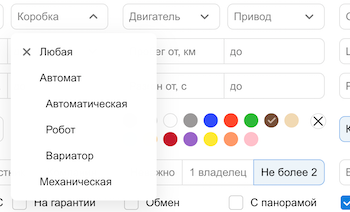

Создадим из данного признака новый признак:
- коробка передач (автомат, механика)

In [89]:
# Создаем колонку transmission со значениями "автомат" и "механическая"
data['transmission'] = data.vehicleTransmission.copy()

data['transmission'].replace(['AUTOMATIC', 'ROBOT', 'VARIATOR',
                              'роботизированная', 'автоматическая', 'вариатор'], "автомат", inplace=True)
data['transmission'].replace(
    ['MECHANICAL', 'механическая'], "механическая", inplace=True)

In [90]:
# В колонке vehicleTransmission почистим данные значениями 'робот', 'автоматическая', 'вариатор' или "механическая"
data['vehicleTransmission'].replace(
    ['AUTOMATIC', 'автоматическая'], "автоматическая", inplace=True)
data['vehicleTransmission'].replace(
    ['ROBOT', 'роботизированная', ], "робот", inplace=True)
data['vehicleTransmission'].replace(
    ['VARIATOR', 'вариатор'], "вариатор", inplace=True)
data['vehicleTransmission'].replace(
    ['MECHANICAL', 'механическая'], "механическая", inplace=True)

In [91]:
# Проверим, какие значения получились
print(data['transmission'].unique())
print(data['vehicleTransmission'].unique())

['механическая' 'автомат' nan]
['механическая' 'автоматическая' 'робот' 'вариатор' nan]


**`color`**

Цвет автомобиля.

In [92]:
# Посмотрим на представленные цвета
data.color.unique()

array(['040001', 'EE1D19', '0000CC', 'CACECB', '007F00', 'FAFBFB',
       '97948F', '22A0F8', '660099', '200204', 'C49648', 'DEA522',
       '4A2197', 'FFD600', 'FF8649', 'FFC0CB', 'синий', 'чёрный', 'серый',
       'коричневый', 'белый', 'пурпурный', 'бежевый', 'серебристый',
       'красный', 'зелёный', 'жёлтый', 'голубой', 'оранжевый',
       'фиолетовый', 'золотистый', 'розовый'], dtype=object)

In [93]:
# Создаем словать с кодировкой значений в цвета
color_dict = {'040001': 'чёрный', 'EE1D19': 'красный', '0000CC': 'синий', 'CACECB': 'серебристый', '007F00': 'зелёный',
              'FAFBFB': 'белый', '97948F': 'серый', '22A0F8': 'голубой', '660099': 'пурпурный', '200204': 'коричневый',
              'C49648': 'бежевый', 'DEA522': 'золотистый', '4A2197': 'фиолетовый', 'FFD600': 'жёлтый',
              'FF8649': 'оранжевый', 'FFC0CB': 'розовый'}

data['color'].replace(to_replace=color_dict, inplace=True)

In [94]:
# Проверяем результат
data.color.unique()

array(['чёрный', 'красный', 'синий', 'серебристый', 'зелёный', 'белый',
       'серый', 'голубой', 'пурпурный', 'коричневый', 'бежевый',
       'золотистый', 'фиолетовый', 'жёлтый', 'оранжевый', 'розовый'],
      dtype=object)

**`driveSide`**

Расположение руля

In [95]:
data.driveSide.unique()

array(['LEFT', 'RIGHT', 'Левый', 'Правый', nan], dtype=object)

In [96]:
# Заменим анлоязычные значения на русские
data['driveSide'] = data['driveSide'].map(
    {'RIGHT': 'Правый', 'LEFT': 'Левый', 'Правый': 'Правый', 'Левый': 'Левый'})

In [97]:
# Уберем верхний регистр
data['driveSide'] = data['driveSide'].str.lower()

In [98]:
# Проверяем результат
data.driveSide.unique()

array(['левый', 'правый', nan], dtype=object)

**`tcp`**

Оригинал ПТС

In [99]:
data.tcp.unique()

array(['ORIGINAL', 'DUPLICATE', nan, 'Оригинал', 'Дубликат'], dtype=object)

In [100]:
data[data.train == 0].tcp.head()

89378    Оригинал
89379    Оригинал
89380    Оригинал
89381    Оригинал
89382    Оригинал
Name: tcp, dtype: object

In [101]:
# Заменим анлоязычные значения на русские
data['tcp'] = data['tcp'].map(
    {'ORIGINAL': 'Оригинал', 'DUPLICATE': 'Дубликат', 'Оригинал': 'Оригинал', 'Дубликат': 'Дубликат'})

In [102]:
# Уберем верхний регистр
data['tcp'] = data['tcp'].str.lower()

In [103]:
# Проверяем результат
data.tcp.unique()

array(['оригинал', 'дубликат', nan], dtype=object)

**`bodyType`**

Тип кузова.

In [104]:
data.bodyType.value_counts()

внедорожник 5 дв.              92027
седан                          48531
Внедорожник 5 дв.              31885
Седан                          30593
хэтчбек 5 дв.                   9288
                               ...  
Универсал 5 дв. Plus               1
Пикап Двойная кабина Double        1
Хэтчбек 5 дв. Runx                 1
Седан Latio                        1
Универсал 5 дв. XC                 1
Name: bodyType, Length: 192, dtype: int64

In [105]:
# Приведем значения к нижнему регистру, уберем ряд дубликатов в значениях
data['bodyType'] = data['bodyType'].apply(lambda x: str(x).lower())

Огромное количество категорий, многие категории представлены единичными автомобилями => переструктурировать категории, уменьшить их количество, провести повторный анализ.

In [106]:
# Заменяем весь "зоопарк" типов кузова на основные, согласна поиску по типу кузова на auto.ru
data['bodyType'].replace(regex={r'внедорожник.*': 'внедорожник',
                                r'седан.*': 'седан',
                                r'хэтчбек.*': 'хэтчбек',
                                r'купе.*': 'купе',  r'тарга.*': 'тарга', r'микровэн.*': 'микровэн',
                                r'пикап.*': 'пикап', r'родстер.*': 'родстер',
                                r'универсал.*': 'универсал', r'лифтбек.*': 'лифтбек',
                                r'минивэн.*': 'минивэн', r'компактвэн.*': 'компактвэн',
                                r'лимузин.*': 'лимузин', r'фургон.*': 'фургон', r'кабриолет.*': 'кабриолет'
                                },
                         inplace=True)

In [107]:
print("Уникальные значения типа кузова после очистки:", data.bodyType.unique())

Уникальные значения типа кузова после очистки: ['седан' 'универсал' 'хэтчбек' 'кабриолет' 'купе' 'лифтбек' 'внедорожник'
 'компактвэн' 'родстер' 'минивэн' 'пикап' 'тарга' 'микровэн' 'фастбек'
 'nan' 'фургон' 'лимузин']


In [108]:
# Посмотрим на результи
pd.DataFrame(data['bodyType'].value_counts(normalize=True))

,bodyType
внедорожник,0.48
седан,0.31
хэтчбек,0.08
лифтбек,0.04
универсал,0.03
минивэн,0.02
купе,0.02
компактвэн,0.01
пикап,0.01
родстер,0.00


### <a id="3.3"></a> 3.3 Дубликаты

Определим количество дубликатов в данных в части train.

In [109]:
print("Количество дубликатов строк в train части датафрейма:",
      data[data.train == 1].duplicated().sum())

Количество дубликатов строк в train части датафрейма: 138995


In [110]:
# Удалим дубликаты из датасета
data.drop_duplicates(inplace=True)

In [111]:
print(f"Для анализа осталось {len(data)} записей.")

Для анализа осталось 122754 записей.


### <a id="3.4"></a> 3.4 Обработка пропусков

Посмотрим вцелом на наличие пустых значений и определим стратегию работы с ними.

In [112]:
# Запускаем функцию вывода всех пустых значений
print("Пропуски для TEST+TRAIN датафрейов.\n")
intitial_eda_checks(data, 0)

Пропуски для TEST+TRAIN датафрейов.

Сумма и процент значений NaN:
 



,Количество,%
ownershipTime,24523,19.98
ownersCount,11111,9.05
description,3232,2.63
tcp,906,0.74
price,742,0.60
drivetrain,558,0.45
mileage,557,0.45
model,557,0.45
driveSide,557,0.45
engineDisplacement,162,0.13


In [113]:
print("Пропуски для TEST датафрейма.\n")
intitial_eda_checks(data[data.train == 0], 0)

Пропуски для TEST датафрейма.

Сумма и процент значений NaN:
 



,Количество,%
ownershipTime,22691,65.42
engineDisplacement,55,0.16
tcp,1,0.00


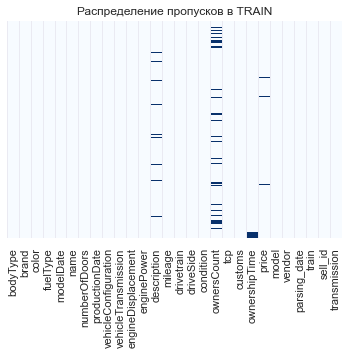

In [114]:
# Посмотрим, как распределены пропуски в части train
ax = plt.axes()
sns.heatmap(data[data.train == 1].isnull(),
            yticklabels=False, cbar=False, cmap='Blues')
ax.set_title('Распределение пропусков в TRAIN')
plt.show()

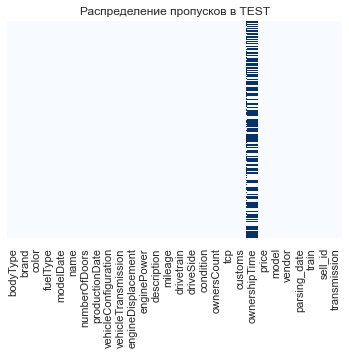

In [115]:
# Посмотрим, как распределены пропуски в части test
ax = plt.axes()
sns.heatmap(data[data.train == 0].isnull(),
            yticklabels=False, cbar=False, cmap='Blues')
ax.set_title('Распределение пропусков в TEST')
plt.show()

В таблице выведена информация по всем пустым значениям для всех столбцов основного рабочего датасета (`data`).

Выводы и стратегия обработки:
1. В 17 столбцах присутствуют пропуски.
2. Test:
    - [x] `tcp`: пропуск в одной записи, посмотреть на нее детально, попробовать восстановить или заполнить модой
    - [x] `ownershipTime`: много пропусков (около 65%), проанализировать с чем скоррелирован признак, попробовать заполнить. Если заполнить не получится, то возможно, удалить из признаков для моделирования.
3. Train + Test:
    - [x] `ownersCount` - можно построить мапинг с медианой/модой по группам в зависимости от года выпуска авто. 
    - [x] `price` - значения с пропусками удалить из данных 
    - [x] `tcp` - поисследовать пропуски и подумать над способами заполнения.
    - [x] есть ряд столбцов, где присутсвует ровно один пропуск или одинаковое количество. Проверить гипотезу, что пропуски находятся в одной и той же строке.
    - [x] `description` заполнить не удастся, колонка в таком виде, как есть, будет удаляться.

Займемся обработкой пропусков по описанной выше стратегии.

**`price`**

In [116]:
# Проверим, что price отсуствует именно в train данных и мы не затроним test
data[data.price.isnull() == True]['train'].value_counts()

1    742
Name: train, dtype: int64

In [117]:
# Удаляем строки с price = NAN
data.dropna(subset=['price'], inplace=True)

**Гипотеза, что NAN с одной строкой - это одна и та же запись**

In [118]:
# Посмотрим на запись
data[data.modelDate.isnull() == True]

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission
24624,nan,HONDA,серебристый,универсал,<NA>,NaN,<NA>,1989,NaN,NaN,...,оригинал,1,no_data,120000.00,CIVIC,JAPANESE,2020-09-09,1,0,NaN


In [119]:
# Посмотрим, что за строка, где modelDate = NaN
print("Индекс строки к удалению:",
      data[data.modelDate.isnull() == True].index[0])

Индекс строки к удалению: 24624


Действительно, в одной строке очень много пропусков, при этом машина 1989, недорогая. Удаляем.

In [120]:
# Удаляем строку
data.drop([24624], inplace=True)

Посмотрим таким же споосбом на 495 строк, где есть пропуски по `mileage`, `drivetran`, `model`, `driveSide`.

In [121]:
# Посмотрим на записи
print("Даты парсинга объясвлений:",
      data[data.mileage.isnull() == True]['parsing_date'].unique())
print("Длина датафрейма с пустыми 'mileage', drivetran, model, driveSide:", len(data[(data.mileage.isnull() == True) &
                                                                                     (data.drivetrain.isnull() == True) &
                                                                                     (data.model.isnull() == True) &
                                                                                     (data.driveSide.isnull() == True)]))

Даты парсинга объясвлений: ['2021-08-29T00:00:00.000000000' '2021-08-30T00:00:00.000000000'
 '2021-08-31T00:00:00.000000000']
Длина датафрейма с пустыми 'mileage', drivetran, model, driveSide: 495


Гипотеза подтвердилась, в принципе можно заполнить все пропуски достаточно точно, за исключение `mileage`, но пока исключим строки из анализа.

In [122]:
# Удалим строки с пропусками
data.drop(data[(data.mileage.isnull() == True) &
               (data.drivetrain.isnull() == True) &
               (data.model.isnull() == True) &
               (data.driveSide.isnull() == True)].index, inplace=True)

**`tcp`**

Проверим гипотезу, что:
- `tcp` пустой у новых машин
- `tcp` пустой там, где это дубликат.

In [123]:
# Посмотрим на пример таких данных
data[data.tcp.isnull() == True].sample(3)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission
40995,внедорожник,MAZDA,белый,бензин,2017,2.5 AT (194 л.с.) 4WD,5,2020,ALLROAD_5_DOORS AUTOMATIC 2.5,автоматическая,...,NaN,1,no_data,2600000.00,CX_5,JAPANESE,2020-09-09,1,0,автомат
85459,внедорожник,MERCEDES,чёрный,бензин,2018,450 3.0 AT (367 л.с.) 4WD,5,2019,ALLROAD_5_DOORS AUTOMATIC 450,автоматическая,...,NaN,1,no_data,6448000.00,GLE_KLASSE,EUROPEAN,2020-09-09,1,0,автомат
8074,седан,BMW,чёрный,дизель,2019,730d xDrive 3.0d AT (249 л.с.) 4WD,4,2020,SEDAN AUTOMATIC 730d,автоматическая,...,NaN,1,no_data,7910000.00,7ER,EUROPEAN,2020-09-09,1,0,автомат


In [124]:
# Сгруппируем данные по году выпуска и выведем медианный пробег и кол-во владельцев
data[data.tcp.isnull() == True].groupby('productionDate')[
    'mileage', 'ownersCount'].median()

,mileage,ownersCount
productionDate,,
1999,276000.00,3.00
2018,0.00,nan
2019,0.00,nan
2020,0.00,nan


Действительно, выглядит так, что NAN - для новых машин и одной машины с теста. 
Стратегия заполнения:
- для новых авто: оставляем "оригинал", но добавляем признак, "новое авто"
- для 10412 из test: попробуем "дубликат"

In [125]:
# Заполняем test значением дубликат
data.tcp.loc[data[(data.tcp.isnull() == True) & (
    data.train == 0)]['tcp'].index[0]] = 'дубликат'

In [126]:
# Смотрим, какой mileage у оставшихся записей. Удостоверимся, что это авто без пробега
data[data.tcp.isnull() == True].mileage.value_counts()

0.00    348
Name: mileage, dtype: int64

In [127]:
# Заполняем значением "новое авто"
data.tcp.fillna('оригинал', inplace=True)

In [128]:
# Проверяем, что получилось
data.tcp.value_counts()

оригинал    106494
дубликат     15022
Name: tcp, dtype: int64

**`description`**

Пропуски заполнить проблематично, перед постраением модели признак удалим, пока оставим. Идея для нового признака - наличие описания (да/нет).

In [129]:
# добавим колонку в список на удаление перед построением модели
cols_removal.append('description')

**`ownershipTime`**

Попробуем восстановить информацию о времени владении, исходя из информации в `productionDate`.

Создадим на базе признака колонку, в которой поместим информацию о количестве месяцев владения автомобилем.

In [130]:
# Создаем новый столбец с количеством месяцев владения
data['ownershipTimeMonths'] = data['ownershipTime'].apply(num_of_months)

In [131]:
# Пока заполняем пропуски no_data, далее решаем, что сделать с признаком
data['ownershipTime'] = data['ownershipTime'].fillna('no_data')

In [132]:
# Смотрим, что получилось
data[data.ownershipTime != 'no_data'][[
    'ownershipTime', 'ownershipTimeMonths']].sample(5)

,ownershipTime,ownershipTimeMonths
25002,9 лет и 7 месяцев,115.00
104363,4 месяца,4.00
45347,8 лет и 11 месяцев,107.00
102366,2 года и 3 месяца,27.00
69484,6 лет и 11 месяцев,83.00


У 65% записей данные о времени владении отсутсвует. Проверим гипотезу, что есть какая-то взаимосвязь между `ownershipTimeMonths` и `productionDate`. Поисследуем, чтобы посмотреть, можем ли заполнить пропуски.

In [133]:
# Извлечм орипнтировочную информацию о количестве месяцев после производства
data['prodTimeMonths'] = data.apply(lambda x: (
    x['parsing_date'].year - x['productionDate'])*12, axis=1)

In [134]:
# Посмотрим, как распределены статистики по признакам
data[(data.ownershipTimeMonths.isnull() == False) & (
    data.productionDate != 2020)][['prodTimeMonths', 'ownershipTimeMonths']].describe()

,prodTimeMonths,ownershipTimeMonths
count,41026.00,41026.00
mean,129.81,48.51
std,78.34,43.39
min,0.00,1.00
25%,84.00,16.00
50%,120.00,35.00
75%,168.00,72.00
max,1392.00,514.00


In [135]:
# Добавим признак, показывающий во сколько раз время после производства больше времени владения
data['prodTime_ownershipTime'] = data.apply(
    lambda x: x['prodTimeMonths']/x['ownershipTimeMonths'], axis=1)

In [136]:
# Посмотрим статистики
data.prodTime_ownershipTime.describe()

count   41178.00
mean        9.18
std        21.48
min         0.00
25%         1.23
50%         2.67
75%         7.20
max       384.00
Name: prodTime_ownershipTime, dtype: float64

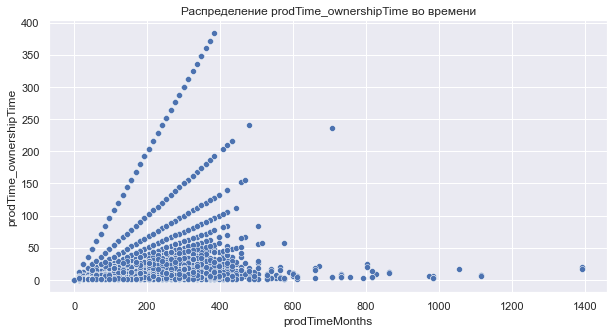

In [137]:
# Посмотрим на графики
fig, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(data=data, x='prodTimeMonths', y="prodTime_ownershipTime")
ax.set_title('Распределение prodTime_ownershipTime во времени')
plt.show()

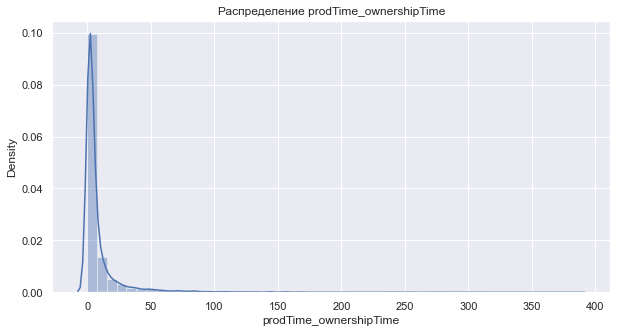

In [138]:
# Посмотрим на распределение признака
fig, ax = plt.subplots(figsize=(10, 5))
sns.distplot(data['prodTime_ownershipTime'])
ax.set_title('Распределение prodTime_ownershipTime')
plt.show()

Видно, что есть какая-то группировка признака по классам, но пока не понятно, на базе какого признака наблюдается линейная зависимость по коэффициентам соотношения времени владения и времени после производства.

Следующие шаги:
1. План-минимум: заполнить для новых авто NAN нулями, внести признак, что время владения не указано. Возможно, что-то из этого получится. Текущий признак удалить.
2. План-максимум: найти, каким образом заполнить недостающие значения.

In [139]:
# Заполним нулями признак для новых автомобилей
data['ownershipTimeMonths'].loc[(data['mileage'] == 0) & (
    data['ownershipTimeMonths'].isnull() == True)] = 0

In [140]:
# Удалим служебные признаки, которые создавали для вычислений
data.drop(['prodTime_ownershipTime', 'prodTimeMonths'], axis=1, inplace=True)

In [141]:
# Добавим исходную колонку в список на удаление перед построением модели, т.к. пропусков очень много
cols_removal.append('ownershipTime')
cols_removal.append('ownershipTimeMonths')

**`ownersCount`**

Количество владельцев.

In [142]:
# Все пропуски по значению находятся в train части
data[data.ownersCount.isnull() == True].train.value_counts()

1    10535
Name: train, dtype: int64

In [143]:
# Посмотрим по данным с незаполненным количетсвом владельцев медианные значения метрик.
data[data.ownersCount.isnull() == True].groupby('productionDate').median()

,modelDate,engineDisplacement,enginePower,mileage,condition,ownersCount,customs,price,train,sell_id,ownershipTimeMonths
productionDate,,,,,,,,,,,
2017,2015,5.00,424.00,0.00,0,nan,1,3829900.00,1,0,0.00
2018,2018,3.00,367.00,0.00,0,nan,1,6570070.00,1,0,0.00
2019,2017,2.50,249.00,0.00,0,nan,1,4054000.00,1,0,0.00
2020,2018,2.00,184.00,0.00,0,nan,1,2989500.00,1,0,0.00


Интересно: пробег везде по 0. Посомтрим уникальные значения пробега по отфильтрованным данным.

In [144]:
data[data.ownersCount.isnull() == True]['mileage'].describe()

count   10535.00
mean        0.00
std         0.00
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         0.00
Name: mileage, dtype: float64

Всё явно, владельцы не заполнены, потому что это новые авто. Заполняем пропуски 0.

In [145]:
# Заполняем пропуски 0
data['ownersCount'].fillna(0, inplace=True)

In [146]:
# Приведем значение признака из float в int
data['ownersCount'] = data['ownersCount'].astype('int64')

### <a id="3.5"></a> 3.5 Детальный анализ признаков

#### Группировка признаков на категориальные, бинарные и числовые

Посмотрим, какие признаки могут относиться к категориальным, бинарным, числовым.

In [147]:
# Посмотрим, сколько уникальных значений
print("Количество уникальных категорий в признаках.")
data.nunique(dropna=False)

Количество уникальных категорий в признаках.


bodyType                    16
brand                       36
color                       16
fuelType                     5
modelDate                   79
name                      5235
numberOfDoors                5
productionDate              81
vehicleConfiguration      2026
vehicleTransmission          4
engineDisplacement          69
enginePower                398
description             100628
mileage                  24685
drivetrain                   3
driveSide                    2
condition                    1
ownersCount                  4
tcp                          2
customs                      1
ownershipTime              355
price                     8304
model                     1230
vendor                       4
parsing_date                10
train                        2
sell_id                  34687
transmission                 2
ownershipTimeMonths        310
dtype: int64

In [148]:
# Выведем пример признаков на экран
print("Выведем пример значений признаков одной из записей датасета.")
data.loc[5]

Выведем пример значений признаков одной из записей датасета.


bodyType                                                            седан
brand                                                                AUDI
color                                                             зелёный
fuelType                                                           бензин
modelDate                                                            1990
name                                                    2.8 MT (174 л.с.)
numberOfDoors                                                           4
productionDate                                                       1993
vehicleConfiguration                                 SEDAN MECHANICAL 2.8
vehicleTransmission                                          механическая
engineDisplacement                                                   2.80
enginePower                                                        174.00
description             Хорошая комплектация: климат, эл. стекла, эл. ...
mileage                               

In [149]:
# Посмотрим, на колонки, которые планируем в последствие удалить, чтобы не включать их в анализ
print("Признаки для последующего удаления:", cols_removal)

Признаки для последующего удаления: ['parsing_date', 'vehicleConfiguration', 'name', 'description', 'ownershipTime', 'ownershipTimeMonths']


In [150]:
# Создадим списки с разными категориями признаков
# бинарные признаки
bin_cols = ['condition', 'customs', 'driveSide', 'transmission', 'tcp']

# категориальные переменные
cat_cols = ['bodyType', 'brand', 'color', 'fuelType', 'drivetrain',
            'model', 'vendor', 'vehicleTransmission', 'numberOfDoors', 'ownersCount']

# числовые переменные
num_cols = ['modelDate', 'productionDate',
            'enginePower', 'mileage', 'engineDisplacement']

# сервисные переменные
service_cols = ['train', 'sell_id', 'parsing_date']

# целевая переменная
target_col = ['price']

all_cols = bin_cols + cat_cols + num_cols + service_cols + target_col

print("Кол-во столбцов, для дальнейшей работы после предварительного анализа:", len(all_cols))

Кол-во столбцов, для дальнейшей работы после предварительного анализа: 24


#### Числовые переменные: распределение, корреляционный анализ, определение значимости

###### Распределние численных признаков.

Диаграмы распределения числовых признаков, взаимосвязь с целевой переменной


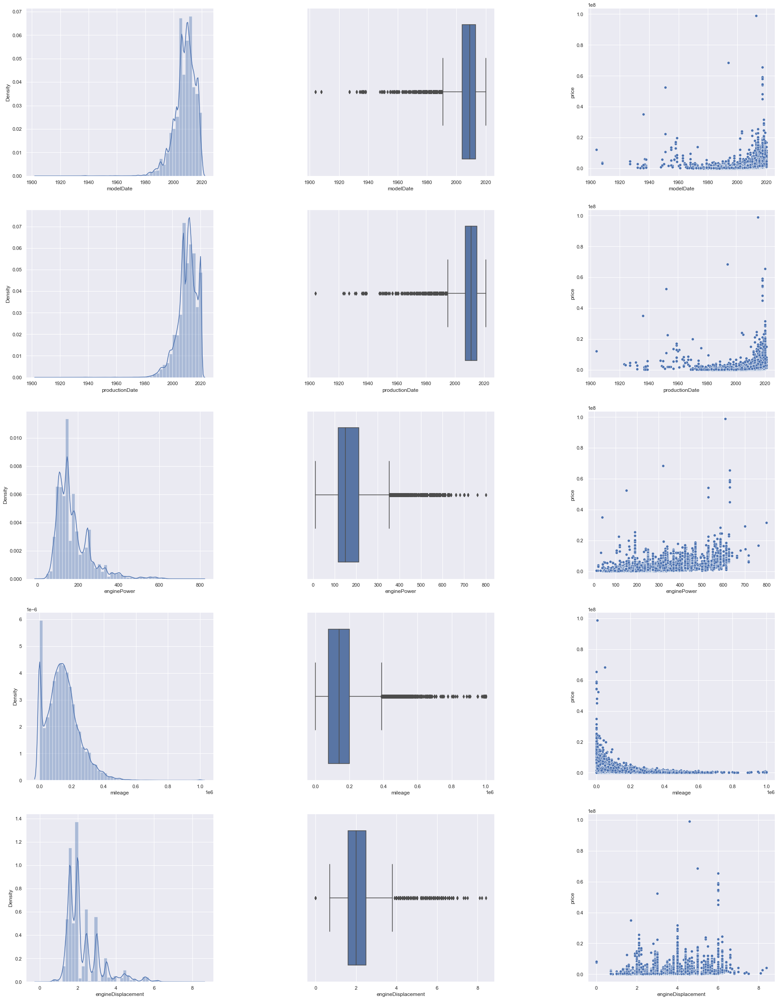

In [151]:
# Построим распределение основных числовых признаков

print("Диаграмы распределения числовых признаков, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(5, 3, figsize=(30, 40))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in num_cols:
    sns.distplot(data[col], ax=axes[i])
    i = i + 1
    sns.boxplot(data[col], ax=axes[i])
    i = i + 1
    sns.scatterplot(data=data[data['train'] == 1],
                    x=col, y="price", ax=axes[i])
    i = i + 1

In [152]:
print("Основные статистики для числовых признаков.")
display(data[num_cols].describe())

Основные статистики для числовых признаков.


,modelDate,productionDate,enginePower,mileage,engineDisplacement
count,121516.00,121516.00,121516.00,121516.00,121355.00
mean,2007.94,2010.20,176.25,145711.38,2.27
std,7.38,6.99,86.05,101701.73,0.92
min,1904.00,1904.00,11.00,0.00,0.00
25%,2004.00,2007.00,117.00,75000.00,1.60
50%,2009.00,2011.00,150.00,138000.00,2.00
75%,2013.00,2015.00,211.00,200000.00,2.50
max,2020.00,2021.00,800.00,1000000.00,8.40


Выводы:

1. После построения гистограмм стало очевидно, что распределения основных числовых переменных имеют тяжёлый левый или правый хвост, влияет на разбежку между средним и медианой: 
    - для того, чтобы сделать распределение данных переменных более нормальным, можно работать с логарифмированными величинами этих переменных
    - поработать с выбросами
    - подумать про группировку признаков по категориям.
2. Распределние `modelDate`, `productionDate` очень схожи:
    - проверить на признаки на мультиколлинеарность во время корреляционного анализа
    - видно, что в среднем `productionDate` чуть позже, чем `modelDate` во времени, т.е. производство приосходит чуть с запозданием, что логично. Можно добавить новый признак - насколько новая модель, т.е. через сколько лет после появления модели был выпущен автомобиль.
3. `mileage`: есть пик в 0 - признак нового авто.
4. `enginePower`: 11 лс - что это за авто? Поисследовать
5. `engineDisplacement`: основная масса авто - 2.0 л, есть разброс.
5. Взаимосвязь признаков с таргетом:
    - наблюдается прямая корреляция цены от года модели и года выпуска с исключениями для особо раритетных автомобилей (~до 1975 года).
    - наблюдается обратная корреляция цены от пробега авто
    - цена от мощности вдигателя и объема двигателя зависит, но не так явно, как от других переменных.

###### Корреляционный анализ.

Оценим корреляцию Пирсона для непрерывных переменных. Cильная корреляция между переменными вредна для линейных моделей из-за неустойчивости полученных оценок.

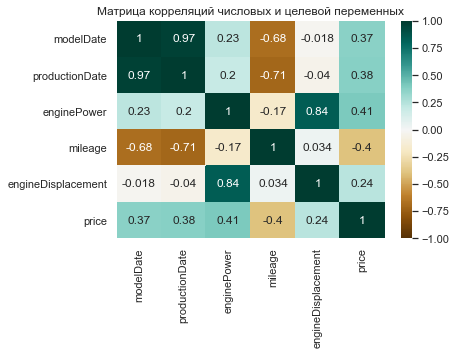

In [153]:
# Построим матрицу корреляций
heatmap = sns.heatmap(data[num_cols + target_col].corr(), vmin=-1,
                      vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций числовых и целевой переменных')
plt.show()

Вывод: 
1. Взаимосвязь пар числовых признаков по Пирсону достаточно сильная для `productionDate`, `modelDate`. При этом, у `productionDate` чуть большая корреляция с целевой переменной. Удалим признак `modelDate`.
2. Достаточно сильная корреляция между `productionDate` и `meleage` - чем меньше год выпуска, тем больше пробег
3. `engineDisplacement` и `enginePower` достаточно сильно скоррелированы (0.84). Для моделирования оставить один признак - `enginePower`, т.к. он сильнее влияет на `price`.
4. У всех числовых признаков достаточно высокая корреляция с целевой переменной, это хорошо.

In [154]:
# Добавляем modelDate в список колонок на удаление.
cols_removal.append('modelDate')
cols_removal.append('engineDisplacement')

###### Дополнительный анализ числовых признаков

Посмотрим более пристально на признаки, которые не исключили из анализа.

**mileage**

Дополнительно поисследуем признак.

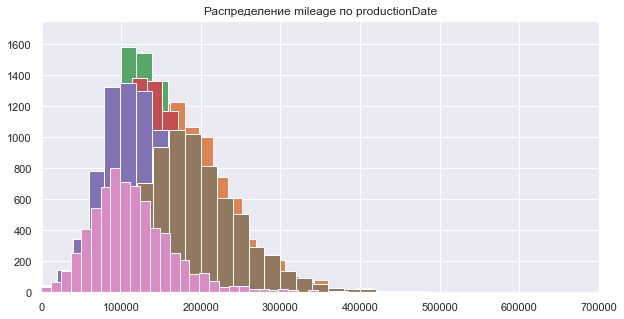

In [155]:
# Посмотрим на топ 5 годов выпуска авто
fig, ax = plt.subplots(figsize=(10, 5))

for x in (data['productionDate'].value_counts())[0:7].index:
    data['mileage'][data['productionDate'] == x].hist(bins=50)

ax.set_xlim(0, 700000)
ax.set_ylim(0, 1750)

plt.title("Распределение mileage по productionDate")
plt.show()

Получается, что mileage имеет достаточно нормальное распределение, не с таким уж сильным правым смещением, если смотреть на графики по годам производства, а не на все числа. Чемм старше автомобиль, тем больше пробег и мы наблюдаем смещение.

Чтобы скорректировать признак и сделать его более информативным создадим новый признак в разделе создания признаков: `km_per_year` - показывает, сколько км в год проезжал автомобиль. Вычисляется, как `mileage`/`productionDate`(years) или `mileage`/`ownershipTime`. Решить, какой метод использовать.

**enginePower**

Нужно поисследовать странное минимальное значение мощности.

In [156]:
print("Значение мощности двигателя (л.с.) на TEST")
display(data[data.train == 0]['enginePower'].describe())

print("\nЗначение мощности двигателя (л.с.) на TRAIN")
display(data[data.train == 1]['enginePower'].describe())

Значение мощности двигателя (л.с.) на TEST


count   34686.00
mean      188.19
std        89.09
min        30.00
25%       125.00
50%       169.00
75%       233.00
max       639.00
Name: enginePower, dtype: float64


Значение мощности двигателя (л.с.) на TRAIN


count   86830.00
mean      171.48
std        84.34
min        11.00
25%       115.00
50%       150.00
75%       200.00
max       800.00
Name: enginePower, dtype: float64

Видим, что в Test значение минимума - больше, а максимума - меньше. Посмотрим, что это за авто и сколько их.

In [157]:
print("Строки, в которых мощность двигателя меньше 30 л.с.")
data[data.enginePower < data[data.train == 0]['enginePower'].min()]

Строки, в которых мощность двигателя меньше 30 л.с.


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
22691,кабриолет,FORD,зелёный,бензин,1908,2.9 MT (20 л.с.),2,1923,CABRIO MECHANICAL 2.9,механическая,...,1,no_data,3800000.00,MODEL_T,AMERICAN,2020-09-09,1,0,механическая,nan
22692,кабриолет,FORD,чёрный,бензин,1908,2.9 MT (20 л.с.),2,1924,CABRIO MECHANICAL 2.9,механическая,...,1,no_data,3000000.00,MODEL_T,AMERICAN,2020-09-09,1,0,механическая,nan
59955,купе,RENAULT,белый,электро,2011,Electro AT (13 кВт),2,2012,COUPE AUTOMATIC Electro,автоматическая,...,1,1 год и 3 месяца,449000.00,TWIZY,EUROPEAN,2020-09-09,1,0,автомат,15.00
59956,купе,RENAULT,чёрный,электро,2011,Electro AT (9 кВт),2,2016,COUPE AUTOMATIC Electro,автоматическая,...,1,1 год и 4 месяца,549000.00,TWIZY,EUROPEAN,2020-09-09,1,0,автомат,16.00


In [158]:
print("Строки, в которых мощность двигателя более 639 л.с.")
data[data.enginePower > data[data.train == 0]['enginePower'].max()]

Строки, в которых мощность двигателя более 639 л.с.


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
18731,купе,DODGE,синий,бензин,2014,Hellcat 6.2 AT (717 л.с.),2,2016,COUPE AUTOMATIC Hellcat,автоматическая,...,1,1 год и 6 месяцев,6500000.00,CHALLENGER,AMERICAN,2020-09-09,1,0,автомат,18.00
18733,купе,DODGE,серый,бензин,2014,Hellcat 6.2 AT (717 л.с.),2,2016,COUPE AUTOMATIC Hellcat,автоматическая,...,1,no_data,5990000.00,CHALLENGER,AMERICAN,2020-09-09,1,0,автомат,nan
18832,пикап,DODGE,серый,бензин,2018,Crew Cab TRX 6.2 AT (702 л.с.) 4WD,4,2020,PICKUP_TWO AUTOMATIC Crew,автоматическая,...,1,no_data,14433255.00,RAM,AMERICAN,2020-09-09,1,0,автомат,0.00
23483,купе,FORD,красный,бензин,2009,Shelby GT500 5.8 MT (662 л.с.),2,2013,COUPE MECHANICAL Shelby,механическая,...,1,no_data,9980000.00,MUSTANG,AMERICAN,2020-09-09,1,0,механическая,nan
23485,купе,FORD,чёрный,бензин,2009,Shelby GT500 5.8 MT (662 л.с.),2,2013,COUPE MECHANICAL Shelby,механическая,...,1,no_data,9000000.00,MUSTANG,AMERICAN,2020-09-09,1,0,механическая,nan
32411,внедорожник,JEEP,белый,бензин,2013,Trackhawk 6.2 AT (717 л.с.) 4WD,5,2019,ALLROAD_5_DOORS AUTOMATIC Trackhawk,автоматическая,...,1,no_data,10300000.00,GRAND_CHEROKEE,AMERICAN,2020-09-09,1,0,автомат,0.00
57242,седан,PORSCHE,серый,электро,2019,Turbo S Electro AT (561 кВт) 4WD,4,2020,SEDAN AUTOMATIC Turbo,автоматическая,...,1,no_data,16601327.00,TAYCAN,EUROPEAN,2020-09-09,1,0,автомат,0.00
57246,седан,PORSCHE,белый,электро,2019,Turbo Electro AT (501 кВт) 4WD,4,2020,SEDAN AUTOMATIC Turbo,автоматическая,...,1,8 месяцев,13500000.00,TAYCAN,EUROPEAN,2020-09-09,1,0,автомат,8.00
83909,внедорожник,MERCEDES,чёрный,бензин,2018,Brabus 700 4.0 AT (700 л.с.) 4WD,5,2020,ALLROAD_5_DOORS AUTOMATIC Brabus,автоматическая,...,1,no_data,29300000.00,G_KLASSE_AMG,EUROPEAN,2020-09-09,1,0,автомат,0.00
83976,внедорожник,MERCEDES,чёрный,бензин,2018,Brabus 800 4.0 AT (800 л.с.) 4WD,5,2020,ALLROAD_5_DOORS AUTOMATIC Brabus,автоматическая,...,1,no_data,31600000.00,G_KLASSE_AMG,EUROPEAN,2020-09-09,1,0,автомат,0.00


Таких строк немного, удалим из из дальнейшего анализа. Более того, большинство записей не входят в список 12 брендов из test выборки.

In [159]:
# Таких строк немного, удалим из из дальнейшего анализа
data.drop(data[(data.enginePower > data[data.train == 0]
                ['enginePower'].max()) | (data.enginePower < data[data.train == 0]
                                          ['enginePower'].min())].index, inplace=True)

**productionDate/modelDate**

Посмотрим повнимательнее на признак и попробуем проанализировать поглубже.

In [160]:
print("Значение года производства авто на TEST")
display(data[data.train == 0]['productionDate'].describe())

print("\nЗначение года производства авто на TRAIN")
display(data[data.train == 1]['productionDate'].describe())

Значение года производства авто на TEST


count   34686.00
mean     2009.26
std         7.05
min      1904.00
25%      2006.00
50%      2011.00
75%      2014.00
max      2020.00
Name: productionDate, dtype: float64


Значение года производства авто на TRAIN


count   86816.00
mean     2010.57
std         6.92
min      1904.00
25%      2007.00
50%      2011.00
75%      2015.00
max      2021.00
Name: productionDate, dtype: float64

Минимальные значения, максимальные, медианные и среднии достаточно близки.

Посмотрим на раритетные автомобили (30 летние машины, согласно классификации FIVA (Fédération Internationale des Véhicules Anciens), см 
[Wiki Article](https://ru.wikipedia.org/wiki/%D0%9A%D0%BB%D0%B0%D1%81%D1%81%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D0%B9_%D0%B0%D0%B2%D1%82%D0%BE%D0%BC%D0%BE%D0%B1%D0%B8%D0%BB%D1%8C#%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D1%8F).

В части фиче инжениринга можно будет добавить признак rarity.

In [161]:
# Посмотрим, сколько таких записей
print(
    f"В датасете содержится {len(data[data.productionDate < (data['parsing_date'].max().year-30)]['productionDate'])} раритетных автомобилей.")

В датасете содержится 1451 раритетных автомобилей.


Детальнее посмотрим, как падает цена в зависимости от `productionDate`.

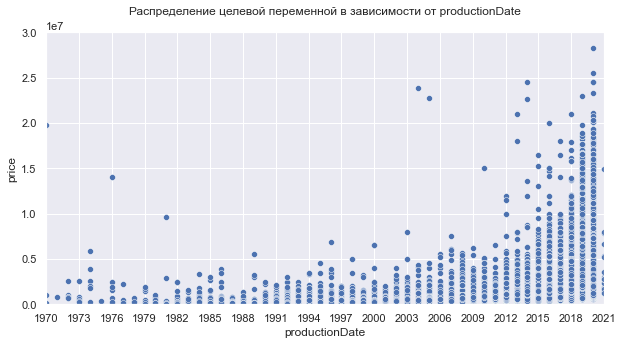

In [162]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.set_xlim(1970, 2021)
ax.set_ylim(0, 30000000)
ax.set_xticks(np.arange(1970, 2022, 3))

sns.scatterplot(data=data[data['train'] == 1], x='productionDate', y="price")

plt.title("Распределение целевой переменной в зависимости от productionDate\n")
plt.show()

Можно найти много информации, что цена автомобиля значительно падает после 3-5 лет эксплуатации. На графиках даная динамика тоже прослеживается. Идеи для новых признаков:
- `prodDate_3Y` - признак, что автомобилю уже 3 года
- `prodDate_5Y` - признак, что автомобилю уже 5 лет.

#### Категориальные и бинарные переменные: конвертация в числовые

##### Распределение признаков

Посмотрим на распределение признаков.

Распределение бинарных и категориальных признаков. Нажимите дважды для увелечения.


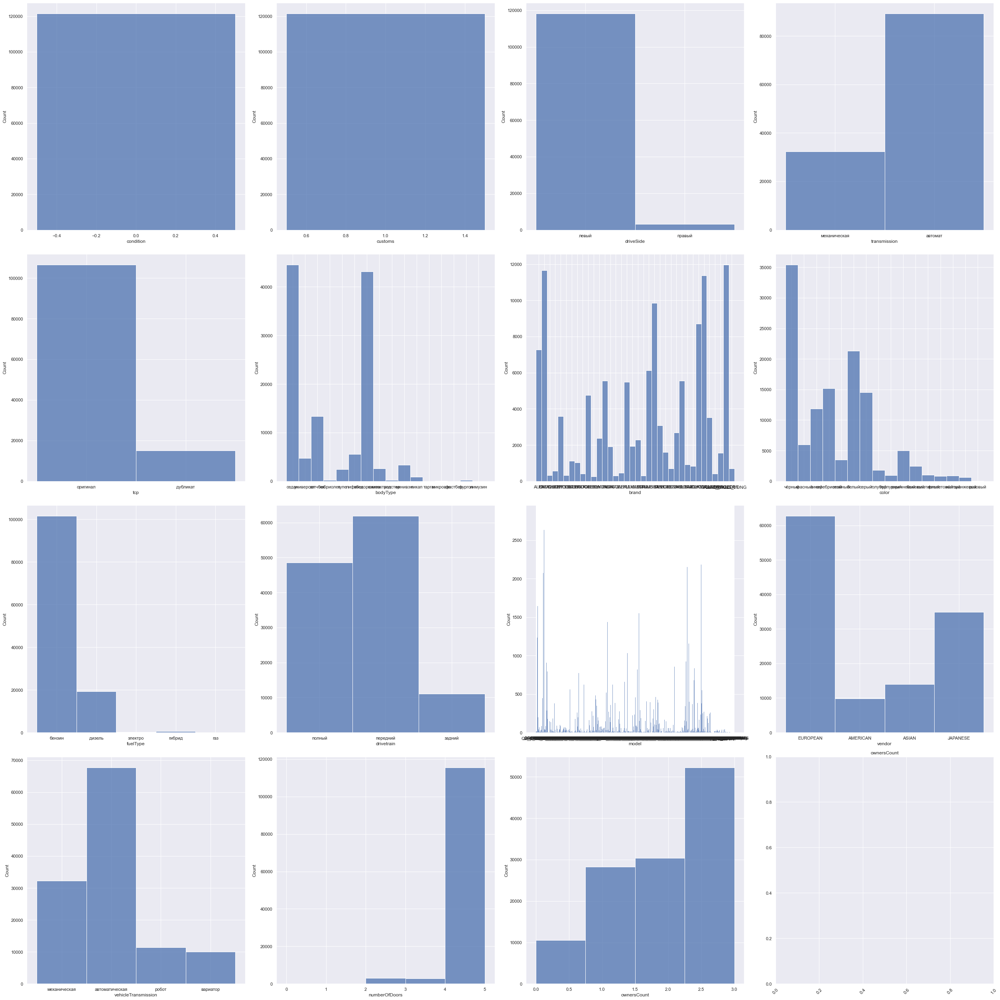

In [163]:
# Построим распределение основных бинарных и категориальных признаков
print("Распределение бинарных и категориальных признаков. Нажимите дважды для увелечения.")

fig, axes = plt.subplots(4, 4, figsize=(35, 35))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in (bin_cols + cat_cols):
    sns.histplot(data=data, x=data[col], ax=axes[i],
                 stat='count', bins=data[col].nunique())
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.title(col)
    i = i + 1

Boxplot нечисловых признаков и их зависимость от цены.


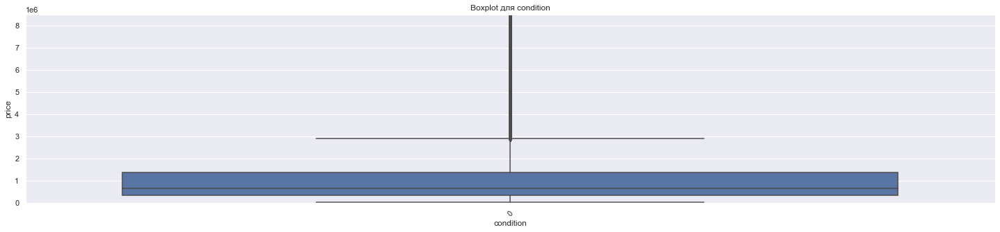

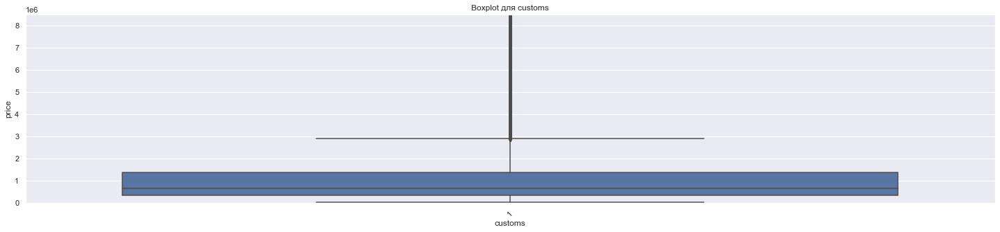

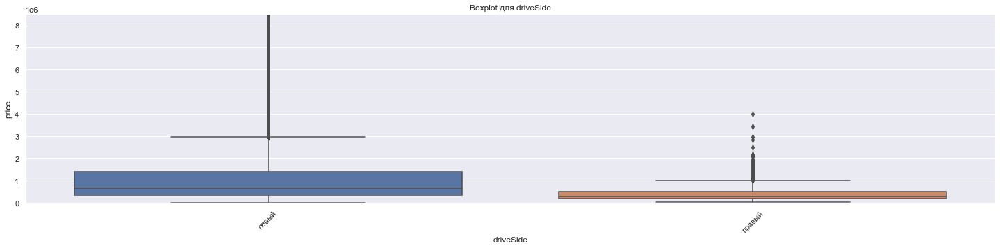

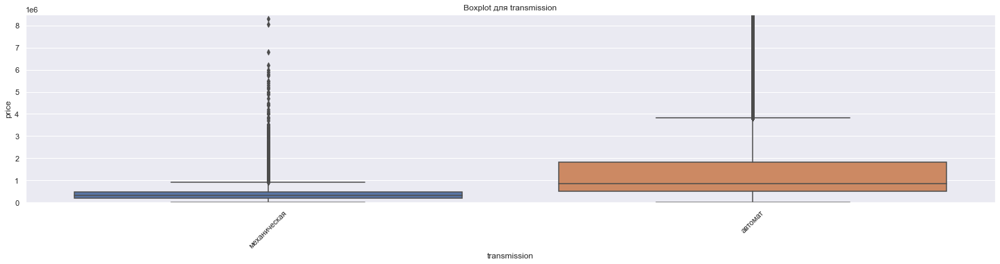

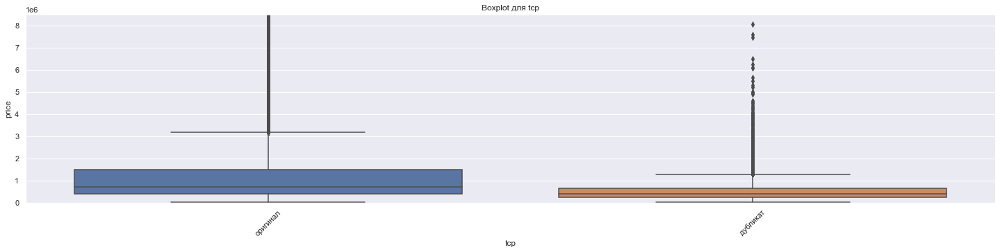

...

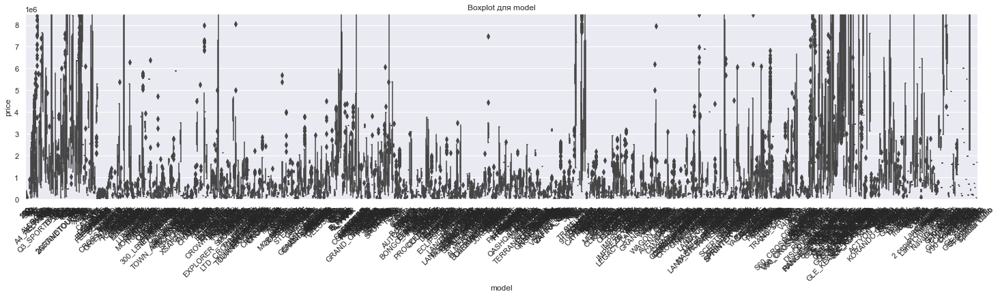

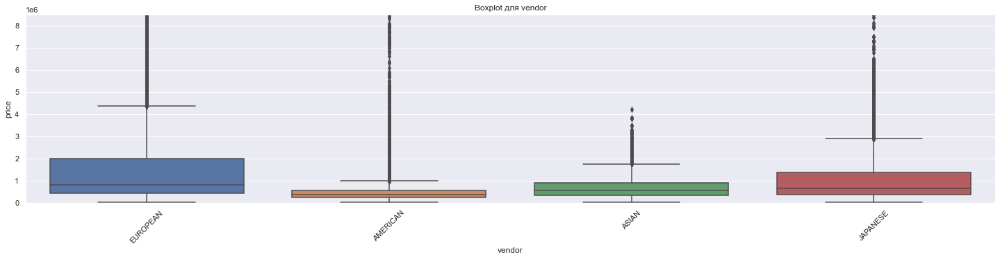

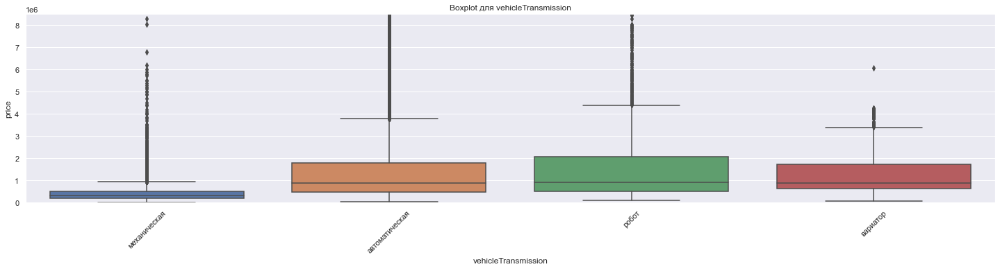

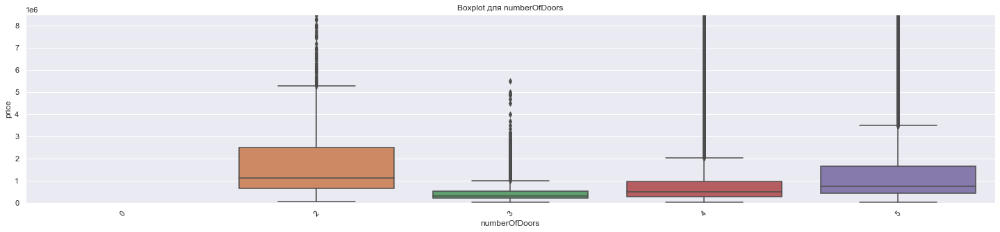

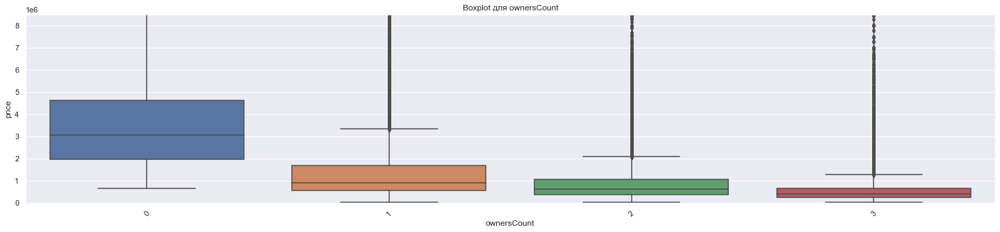

In [164]:
# Построим график boxplot
print("Boxplot нечисловых признаков и их зависимость от цены.")
for col in (bin_cols + cat_cols):
    get_boxplot(col)

Выводы по всем графикам:
1. Полностью сбалансированные признаки отсутсвуют.
2. Особо несбалансированные признаки: 
    - [x] `driveSide` - правосторонни машины в большинстве => поисследовать, есть ли левосторонние машины в тесте. Если нет, то удалить признак
    - `bodyType` - некоторые категории представлены небольшим количеством машин, но boxplot показывает значительные различия и распределение по ценам. Идея схлопнуть малочисленные категории в other кажется не очень хорошей, т.к. разброс медианных цен очень большой для этих категорий. Оставлим пока признак, как есть.
    - [x] `brand` - много категорий, заметно, что есть массовые, среднепопулярные и редкие бренды авто. Поисследовать дополнительно и подумать над созданием новых признаков (престижные авто/люкс, популярные и т.д.)
    - [x] `color` - есть популярные цвета (черный, белый, серый, серебристый, синий) и редкие. Посмотреть дополнительно и создать новый признак о популярности цвета
    - [x] `fuelType` - есть типы топлива, которые в явном меньшинстве. Поисследовть и подумать, стоит ли делать группировку непопулярных типов топлива
    - `tcp` - несбалансированный признак, но пока оставляем в модели
    - [x] `model` - очень много уникальных категорий, подумать, можно ли как-то доработать признак. Подумать про объединение brand + model
    - [x] `numberOfDoors` - малое количество машин в 0-3 - изучить детальнее

3. Сбалансированные признаки с заметно превалирующим классом:
    - `ownershipTimeIsNull` - большая часть записей без указания времени владения
    - `transmission` - автомат превалирует
    - `drivertrain` - передний привод встречается чаще всего
    - `vendor` - большее количество автомобилей европейского региона
    - `ownersCount` - привалирует 3 и более.
4. Неинформативные признаки: `conditions`, `customs` - после манипуляций с данными в признаках осталось только одно значение. Удаляем из анализа.
5. Зависимость с целевой переменной:
    - `ownershipTimeIsNull`: машины без указания времени владения в среднем дешевле, чем машины с указанием времени владения
    - `driveSide`: авто с правосторонним рулем в среднем дешевле машин с левосторонним рулем
    - `transmission`: авто с АТ коробкой намного дороже MT, как и сам диапазон цен
    - `bodyType`: признак, который значительно влияет на распределение цен
    - `brand`: большая разбежка цен от бренда. Выделяются престижные авто (porche, Cadillac, bmw, and Rover, Lexus и др), а есть дешевый сегмент (азиатские авто - Cherry, Daewoo, Great wall и др.). Также видны бренды, которые выпускают дорогие авто, но и есть модели для более дешевого сегмента.
    - `color`: цены зависят от цвета, но большие цены представлены у цветов, количество авто по которым больше. 
    - `fuelType`: очень дорогие машины электро и дизель, возможно выделить отдельный признак, что машина “электрокар”
    - `drivetrain`: полноприводные машины дороже всех, заднеприводные машины в среднем дешевле переднеприводных
    - `tcp:` авто с дубликатом ПТС дешевле чем те, что с оригиналом
    - `model` - данных много, но видно, что присутствую колебания цены в зависимости от модели
    - `vendor`: в среднем, европейские и японские машины дороже американских и азиатских
    - `vehicleTransmission`: в среднем разновидности автоматов особо не влияют на цену, проверить значимость признака тестом Стьюдента. Потенциально на исключение.
    - `numberOfDoors`: в среднем самые дорогие авто - 2-х дверные, затем 5-дверные.
    - `ownersCount`: чем больше владельцев, тем ниже средняя цена авто.

In [165]:
# Добавляем modelDate в список колонок на удаление.
cols_removal.append('condition')
cols_removal.append('customs')

###### Дополнительный анализ бинарных и категориальных признаков

Посмотрим более пристально на признаки, которые не исключили из анализа и по которым возникли вопросы/требуется дополнительное исследование после предварительного анализа.

**`driveSide`**

Правосторонние машины в большинстве => поисследовать, есть ли левосторонние машины в тесте. Если нет, то удалить признак.

In [166]:
# Проверяем распределение признака в test
test.driveSide.value_counts(normalize=True)

Левый    0.96
Правый   0.04
Name: driveSide, dtype: float64

4% данных в тесте левосторонние. Оставляем, как есть, т.е. обоготить данные пока не можем.

**`brand`**

Марка машины.

In [167]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].brand.unique()).difference(data[data.train == 1].brand.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].brand.unique()).difference(data[data.train == 0].brand.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
['MAZDA', 'SUBARU', 'LAND_ROVER', 'RENAULT', 'GEELY', 'CHEVROLET', 'CHERY', 'SUZUKI', 'SSANG_YONG', 'JEEP', 'JAGUAR', 'KIA', 'PEUGEOT', 'HYUNDAI', 'CHRYSLER', 'DODGE', 'CADILLAC', 'MINI', 'OPEL', 'FORD', 'PORSCHE', 'CITROEN', 'GREAT_WALL', 'DAEWOO']


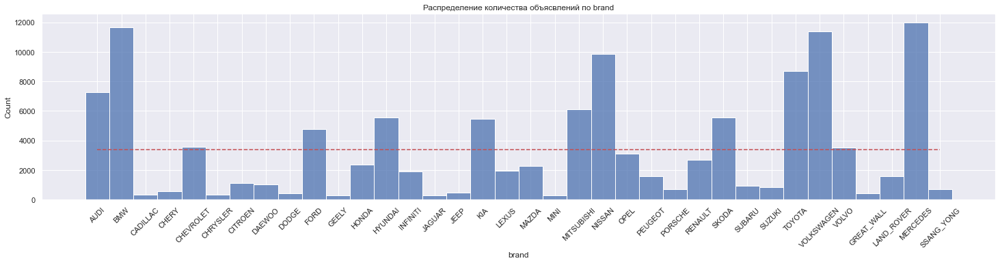

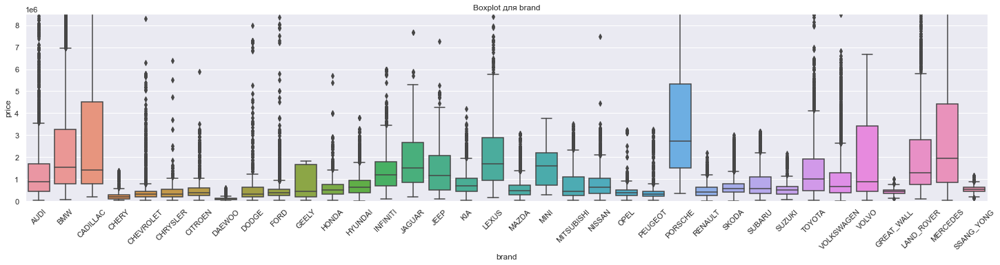

In [168]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('brand')

Можно создать новые признаки:
- флаг популярного авто: за ориентир взять значение `data['brand'].value_counts() > data['brand'].value_counts().values.mean()`
- обычно на цену сильно влияет класс автомобиля (`brand` + `bodyType`) попробовать добавить признак с помощью метода главных компонент.

Также в train присутсвует значительно большее количество брендов, чем в трейне. Учитывать при обработке выбросов.

**`model`**

Модель машины.

In [169]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].model.unique()).difference(data[data.train == 1].model.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].model.unique()).difference(data[data.train == 0].model.unique()))}')

Список категорий brand в test, которые не представлены в train: 
['Z', 'LANCER_RALLIART', 'ARTEON', 'PRESEA', '300ZX', 'WILL_CYPHA', 'TORNEO', 'ZEST', 'COROLLA_II', 'PORTE', 'X4_M', 'GOLF_R32', 'RSQ3', 'POLO_GTI', 'SPARKY', 'OTTI', 'LM', 'IST']

Список зачений brand в train, по которым не нужно делать предсказания в test: 
['KORANDO_SPORTS', 'SOLIO', 'Camry', 'FREDA', 'RAY', 'DAKOTA', 'IMPALA', 'TRAVELLER', 'RANGE_ROVER_VELAR', 'Tiguan', 'FOCUS_RS', 'CX_9', '107', 'CARNIVAL', 'Ipsum', 'ATOS', 'M8', 'C_CROSSER', 'SANTA_FE', 'REXTON', 'MOHAVES', 'BLS', 'STAVIC', 'TAHOE', 'MX_6', 'Auris', 'CHAIRMAN', 'Colt', 'FUSION', 'TYPE_2', 'LATITUDE', 'ORIENTAL_SON', 'Sprinter Carib', 'ZX', 'SC7', 'RENEGADE', 'VECTRA', 'LAVITA', 'RENO', 'EMGRAND', 'Eos', 'LIBETY_NA', 'ZAFIRA', 'FLEETWOOD', 'STELLA', 'CONCORDE', 'TRAJET', '4007', 'SERIES_III', 'Q3_SPORTBACK', 'EQUUS', 'BIANTE', 'REGIUSACE', 'SPARK', 'GETZ', 'RIO', '308', 'SIERRA', 'GLE Coupe AMG', 'TIGGO_2', 'KA', 'CLIO', 'AMULET', 'Pathfinder', 'FREE

Вывод: 
- признак пока оставляем неизменным, можно добавить новый признак популярности модели среди брендов
- в тесте есть модели, по которым нет данных в трейне - может влиять на ошибки предсказания.

**`color`**

Есть популярные цвета (черный, белый, серый, серебристый, синий) и редкие. Посмотреть дополнительно и создать новый признак о популярности цвета.

In [170]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].color.unique()).difference(data[data.train == 1].color.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].color.unique()).difference(data[data.train == 0].color.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
[]


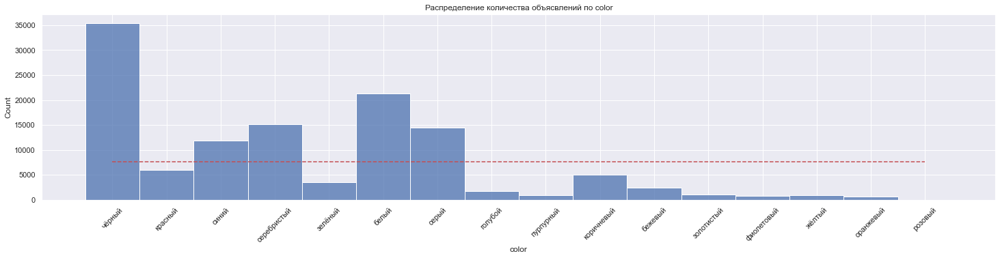

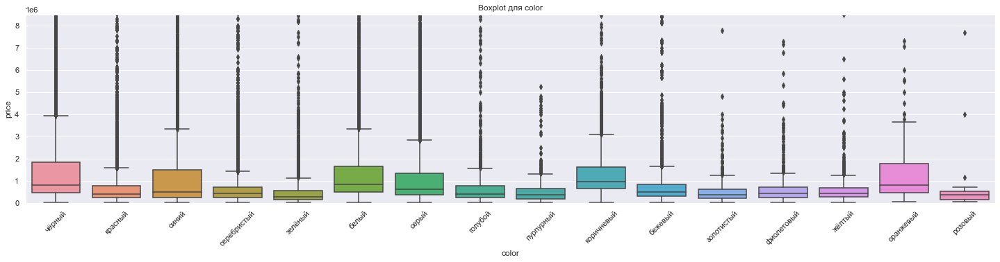

In [171]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('color')

Создадим признак популярного авто: за ориентир взять значение `data['color'].value_counts() > data['color'].value_counts().values.mean()`

Перечень категорий цветов идентичен в `train` и `test`.

**`fuelType`**

Есть типы топлива, которые в явном меньшинстве. Поисследовть и подумать, стоит ли делать группировку непопулярных типов топлива.

In [172]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].fuelType.unique()).difference(data[data.train == 1].fuelType.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].fuelType.unique()).difference(data[data.train == 0].fuelType.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
[]


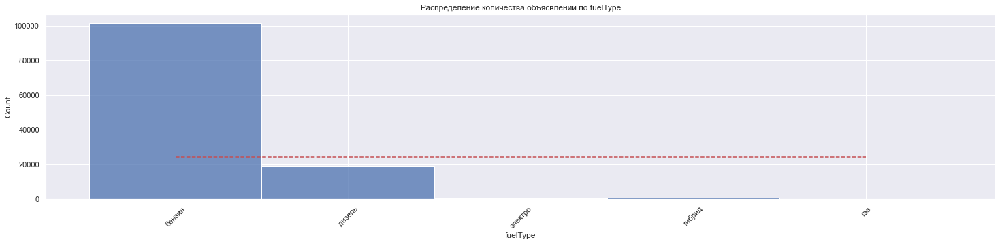

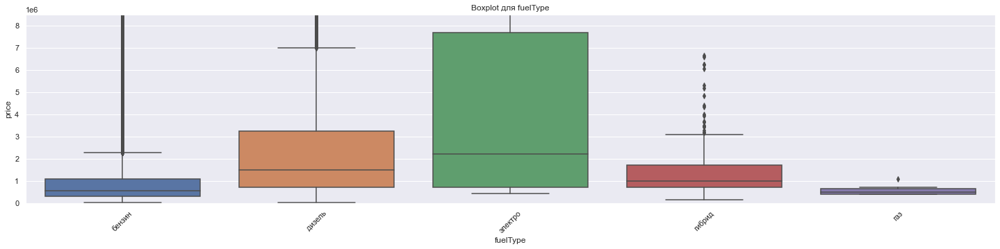

In [173]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('fuelType')

In [174]:
print(
    f'Список зачений по fuelType в трейне:= {list(data[data.train ==0].fuelType.unique())}')
print(
    f'Список зачений по fuelType в тесте:= {list(data[data.train ==0].fuelType.unique())}')

Список зачений по fuelType в трейне:= ['бензин', 'дизель', 'гибрид', 'электро', 'газ']
Список зачений по fuelType в тесте:= ['бензин', 'дизель', 'гибрид', 'электро', 'газ']


In [175]:
# Посмотрим, какие бренды представлены в "электро" типе топлива в трейне и тесте
data[data['fuelType'] == 'электро'].groupby(
    ['train', 'brand'])['bodyType'].count()

train  brand     
0      AUDI           1
       BMW            9
       MERCEDES       1
       MITSUBISHI     2
       NISSAN        40
       VOLKSWAGEN     2
1      AUDI          39
       BMW            7
       CHEVROLET      1
       FORD           1
       JAGUAR         5
       MERCEDES       3
       MITSUBISHI     2
       NISSAN        42
       PORSCHE        3
       VOLKSWAGEN     1
Name: bodyType, dtype: int64

Выводы:
- перечень категорий цветов идентичен в train и test.
- категории для данного признака оставим, как есть, т.к. сильно влияет на распределение цен
- [ ] идея для генерации нового признака - добавить флаг "электрокар"
- использовать информацию по распределению типа топлива-брен между трейн и тестом для обработки выбросов. Возможно, какие-то данные придется удалить

**`numberOfDoors`**

Во время предварительнго анализа появилась идея изучить значение 0 - выброс/ошибка или валидная запись.

In [176]:
# Посмотрим на записи с кол-вом дверей менее 2
data[data.numberOfDoors < 2]

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
88065,кабриолет,MERCEDES,белый,бензин,1904,5.3 MT (32 л.с.),0,1904,CABRIO MECHANICAL 5.3,механическая,...,1,6 лет,12000000.00,SIMPLEX,EUROPEAN,2020-09-09,1,0,механическая,72.00
106322,кабриолет,MERCEDES,белый,бензин,1904,5.3 MT (32 л.с.),0,1904,CABRIO MECHANICAL 5.3,механическая,...,1,6 лет и 8 месяцев,0.00,SIMPLEX,EUROPEAN,2020-10-21,0,1093802104,механическая,80.00


Все в порядке - это раритетные машины, более того 1 из test, 1 из train, оставляем.

**`description`**

Посмотрим на признак повнимательнее и подумаем, что мы можем из него извлечь.

In [177]:
# Описание в трейне
data[data.train == 1]['description'].iloc[1]

'Машина в оригинале не гнилая все вопросы по телефону. Птс оригинал, двигатель 1.8 90 л/с, карбюратор родной двигатель масло не ест. '

In [178]:
# Описание в тесте
data[data.train == 0]['description'].iloc[3]

'КОМПЛЕКТ ЗИМНЕЙ (ЛЕТНЕЙ) РЕЗИНЫ ПО СЕЗОНУ В ПОДАРОК!\n\nРАССРОЧКА НА АВТОМОБИЛИ С ПРОБЕГОМ\nСРОК: 12-18 МЕСЯЦЕВ\nПЕРВОНАЧАЛЬНЫЙ ВЗНОС: ОТ 0%\nСУММА РАССРОЧКИ: ОТ 90 т.р. до 4,9 млн.р.\n\nОт метро Рязанский проспект бесплатный проезд до автосалона GENZES\n\nГарантия на автомобили различных марок сроком на 1 ГОД при общем пробеге до 150 000 км\n-Двигатель (бензиновый или дизельный)\n-Механическая коробка передач\n-Автоматическая коробка передач\n-Роботизированная коробка передач\n-Вариатор\n-Раздаточная коробка\n-Редуктор заднего моста\n-Редуктор переднего моста\n-Радиатор системы охлаждения\n-Радиатор кондиционера\n\nДополнительные комиссии отсутствуют.\n\nКомфортные условия выбора: бесплатный Wi-Fi, уютное кафе с клиентской зоной, большая и удобная парковка\nВыберите подходящий автомобиль и совершите выгодную покупку в течение 1 дня!\n\nВсе автомобили, представленные в продаже, проходят диагностику по более 48 параметрам, с результатами диагностики Вы можете ознакомиться при осмотре а

Для анализа всего текста времени нет, но можно попробовать извлечь признаки количества слов в объявлении.

##### Преобразование бинарных переменных в числа
Чтобы алгоритмы машинного обучения могли работать с категориальными данными, их нужно преобразовать в числа. Применим LabelEncoder ко всему набору бинарных переменных.

In [179]:
# Для бинарных признаков мы будем использовать LabelEncoder
label_encoder = LabelEncoder()

for column in bin_cols:
    data[column] = label_encoder.fit_transform(data[column])

# Убедимся в преобразовании
data[bin_cols].sample(6)

,condition,customs,driveSide,transmission,tcp
30640,0,0,0,0,1
16495,0,0,0,1,1
77227,0,0,0,0,1
57674,0,0,0,1,1
65035,0,0,0,0,1
11707,0,0,0,0,1


#### Анализ целевой переменной `price`

In [180]:
# Посмотрим на основные статистики
print(data[data.train == 1]['price'].describe())

count      86816.00
mean     1251318.91
std      1917852.58
min        16000.00
25%       350000.00
50%       640000.00
75%      1370000.00
max     99000000.00
Name: price, dtype: float64


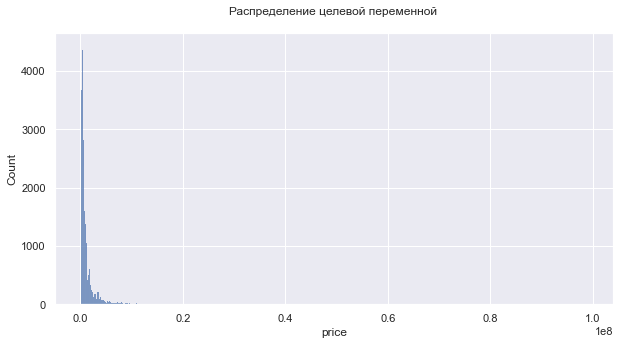

In [181]:
# Посмотрим на распределение целевой переменной
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[data.train == 1], x='price')
plt.title("Распределение целевой переменной \n")
plt.show()

Распределение цены с очень сильным правым хвостом, попробуем добавить доп. целевой признак, взяв логорифм от цены.

##### `price_log`

Логарифм от цены.

In [182]:
# Добавляем новый признка
data['price_log'] = data['price'].apply(lambda x: np.log(x))

# Добавим новый признак в список целевых
target_col.append('price_log')

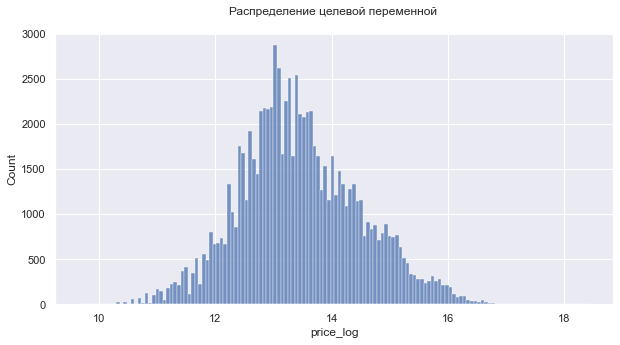

In [183]:
# Посмотрим, как изменилось распределение целевой переменной
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[data.train == 1], x='price_log')
plt.title("Распределение целевой переменной \n")
plt.show()

Вывод: распределение выглядит, как нормальное. Можно будет попробовать использовать для моделирования.

##### `price_usd`

Цена с учетом курса доллара.

Поскольку на для всех данных есть информация о дате подачи объявления, точный перевод цены в доллары затруднителен. Однако, есть информация о дате парсинга объявления и можем допустить, что на момент парсинга цена была удовлетворительной для продавца.

In [184]:
# Создаем столбец с курсом USD-RUB на дату парсинга
data['RUB_USD_rate'] = data['parsing_date'].copy().apply(lambda x: x.strftime(
    "%Y-%m-%d"))

data['RUB_USD_rate'] = data['RUB_USD_rate'].map(
    {'2020-09-09': 75.2048, '2020-10-20': 77.3423,
     '2020-10-19': 77.6500, '2020-10-21': 76.7229,
     '2020-10-24': 76.1235, '2020-10-25': 76.1235,
     '2020-10-26': 76.4950, '2021-08-29': 73.5503,
     '2021-08-30': 73.5048, '2021-08-31': 73.2274})

In [185]:
# Рассчитываем price_usd
data['price_usd'] = data.apply(lambda x: x.price/x.RUB_USD_rate, axis=1)

In [186]:
# Добавим новый признак в список целевых
target_col.append('price_usd')

In [187]:
# Добавим новый признак в список сервисных
service_cols.append('RUB_USD_rate')

### <a id="3.6"></a> 3.6 Генерация новых признаков

Идеи по генерации новых признаков по результатам EDA:
- [x] `km_per_year` - показывает, сколько км в год проезжал автомобиль. Вычисляется, как `mileage`/`productionDate`(years) или `mileage`/`ownershipTime`. Решить, какой метод использовать
- [x] `carNovelty` - показывает, через сколько лет после выхода модели был выпущен автомобиль, т.е. modelDate - productionDate. Гипотеза, что чем меньше это число, тем выше будет цена
- [x] `rarity - признак, показывающий, что автомобиль раритетный (ему более 30 лет)
- [x] `prodDate_3Y` - признак, что автомобилю уже 3 года
- [x] `prodDate_5Y` - признак, что автомобилю уже 5 лет
- [x] `newCar` - признак для обозначения новых авто, пробег равен 0
- [x] `descriptionIsNull` - признак, показывающий наличие или отсутствие объясления
- [x] `ownershipTimeIsNull` - показывает, заполнено ли время владения авто: 1 - не заполнено, 0 - заполнено
- [x] `colorPopular` - признак для обозначения, что авто популярного цвета: 1 - популярного, 0 - непопулярного
- [x] `brandPopular` - признак для обозначения, что авто популярной марки: 1 - популярного, 0 - непопулярного
- [x] `modelPopular` - признак для обозначения, что авто популярной модели в рамках бренда: 1 - популярного, 0 - непопулярного

In [188]:
# Для упрощения повторного анализа для новых признаков добавим списки
cat_cols_new = []
num_cols_new = []
bin_cols_new = []

**`km_per_year`**

Пробег авто км/год.

In [189]:
# Добавим дополнительный признак 'km_per_year', который равен пробегу, поделенному на возраст авто,
data['km_per_year'] = data.apply(km_per_year, axis=1)

Диаграмы распределения km_per_year признака, взаимосвязь с целевой переменной


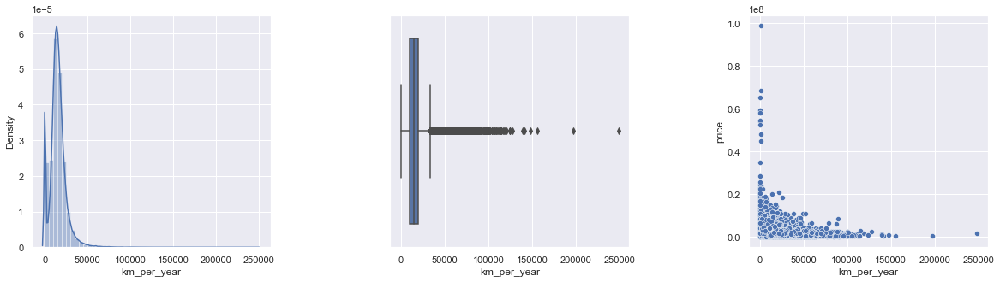

In [190]:
print("Диаграмы распределения km_per_year признака, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()

sns.distplot(data['km_per_year'], ax=axes[0])
sns.boxplot(data['km_per_year'], ax=axes[1])
sns.scatterplot(data=data[data['train'] == 1],
                x='km_per_year', y="price", ax=axes[2])
plt.show()

Вывод: думали, что распределение будет нормальным, если разделить пробег на возраст автомобиля, но все равно есть правых хвост. Нужно или убрать выбросы, или попробовать логорифмирование.

In [191]:
# добавляем новые признак
num_cols.append('km_per_year')

In [192]:
num_cols_new.append('km_per_year')

**`carNovelty`**

Новизна машины: через сколько лет после появления модели авто была произведена машина. 

In [193]:
# Добавим'dateModelProdDiff', равный разнице между годом выпуска авто и годом начала производства модели
data['carNovelty'] = data['productionDate'] - data['modelDate']

In [194]:
# Посмотрим, что получилось
data[['productionDate', 'modelDate', 'mileage',
      'km_per_year', 'carNovelty']].sample(5)

,productionDate,modelDate,mileage,km_per_year,carNovelty
123021,2008,2006,105000.00,8750.00,2
32297,1992,1984,250000.00,8928.57,8
50208,2020,2014,0.00,0.00,6
49214,2012,2010,95669.00,11958.62,2
108519,2011,2010,94645.00,10516.11,1


In [195]:
# Заменим отрицательные значение на 0
data['carNovelty'] = data['carNovelty'].apply(lambda x: 0 if x < 0 else x)

In [196]:
# добавляем новые признак
num_cols.append('carNovelty')

In [197]:
num_cols_new.append('carNovelty')

**`rarity`** 

Раритетные авто (более 30 лет). Строим на базе modelDate.

Значения:
* 5 - авто нераритетный
* 4 - Class F — с 1 января 1961 по 31 декабря 1970
* 3 - Class E (Post War) — с 1 января 1946 по 31 декабря 1960
* 2 - Class D (Post Vintage) — с 1 января 1931 по 31 декабря 1945
* 1 - Class C (Vintage) — с 1 января 1919 по 31 декабря 1930
* Class B (Veteran) — с 1 января 1905 по 31 декабря 1918 (таких авто в выборке нет)
* 0 - Class A (Ancestor) — выпуска до 31 декабря 1904 года.

In [198]:
# Зададим основные раритетные категории
rar_cat = pd.cut(data.modelDate, bins=[0, 1905, 1919, 1931, 1946, 1961, 1971, 2022],
                 labels=['Class A (Ancestor)', 'Class B (Veteran)', 'Class C (Vintage)', 'Class D (Post Vintage)',
                         'Class E (Post War)', 'class F', 'нераритетный'])
data.insert(20, 'rarity', rar_cat)

In [199]:
# Посмотрим на результат
print("Количество автомобилей по раритетности с указанием диапазонов годов моделей")
data.groupby('rarity')['modelDate'].agg(['min', 'max', 'count'])

Количество автомобилей по раритетности с указанием диапазонов годов моделей


,min,max,count
rarity,,,
Class A (Ancestor),1904,1904,2
Class B (Veteran),<NA>,<NA>,0
Class C (Vintage),1927,1927,3
Class D (Post Vintage),1932,1938,37
Class E (Post War),1948,1961,47
class F,1963,1971,40
нераритетный,1972,2020,121373


In [200]:
# Посмотрим на медианную цену по группам
print("Медианная цена по групам раритетности")
data.groupby('rarity')['price'].agg(['median'])

Медианная цена по групам раритетности


,median
rarity,
Class A (Ancestor),6000000.00
Class B (Veteran),nan
Class C (Vintage),4500000.00
Class D (Post Vintage),550000.00
Class E (Post War),2000000.00
class F,1000000.00
нераритетный,400000.00


In [201]:
# Добавим новый признак к категориальным
cat_cols.append('rarity')

In [202]:
cat_cols_new.append('rarity')

**`prodDate_3Y`, `prodDate_5Y`**

- `prodDate_3Y` - признак, что автомобилю уже 3 года
- `prodDate_5Y` - признак, что автомобилю уже 5 лет.

In [203]:
# Добавляем новые признаки
data['prodDate_3Y'] = data.apply(prod_date_range, year_lim=3, axis=1)
data['prodDate_5Y'] = data.apply(prod_date_range, year_lim=5, axis=1)

In [204]:
# Проверяем результат
data[['prodDate_3Y', 'prodDate_5Y',
      'productionDate', 'parsing_date']].sample(3)

,prodDate_3Y,prodDate_5Y,productionDate,parsing_date
112261,1,1,2009,2020-10-21
50449,1,1,2012,2020-09-09
38712,1,1,2008,2020-09-09


In [205]:
# Добавляем новые признаки
bin_cols.append('prodDate_3Y')
bin_cols.append('prodDate_5Y')
bin_cols_new.append('prodDate_3Y')
bin_cols_new.append('prodDate_5Y')

**`ownershipTimeIsNull`**

Создадим новый признак, который показывает, заполнено ли время владения авто:
- 1 - не заполнено
- 0 - заполнено.

In [206]:
# Создадим новый признак, что время владения не указано
data['ownershipTimeIsNull'] = np.where(
    data['ownershipTimeMonths'].isnull(), 1, 0)

In [207]:
# Добавляем новые признаки
bin_cols.append('ownershipTimeIsNull')
bin_cols_new.append('ownershipTimeIsNull')

**`descriptionIsNull`**

Создадим новый признак, который показывает, заполнено ли описание авто:
- 1 - не заполнено
- 0 - заполнено.

In [208]:
# Создадим новый признак, что время владения не указано
data['descriptionIsNull'] = np.where(data['description'].isnull(), 1, 0)

In [209]:
# Пример данных
data[['descriptionIsNull', 'description']].sample(1)

,descriptionIsNull,description
116738,0,Отличное состояние. Куплена в 2018г. Один влад...


In [210]:
# Добавляем новые признаки
bin_cols.append('descriptionIsNull')
bin_cols_new.append('descriptionIsNull')

**`newCar`**

Признак для обозначения новых авто. Основной критери - пробег, равный 0:
- 1 - новая машина
- 0 - машина с пробегом.

In [211]:
# Создадим новый признак
data['newCar'] = data.apply(lambda x: 1 if x['mileage'] == 0 else 0, axis=1)

In [212]:
# Распределение признака
data['newCar'].value_counts()

0    110972
1     10530
Name: newCar, dtype: int64

In [213]:
# Добавляем новые признаки
bin_cols.append('newCar')
bin_cols_new.append('newCar')

**`brandPopular`**
- [x] флаг популярного авто: за ориентир взять значение `data['brand'].value_counts() > data['brand'].value_counts().values.mean()` или добавить соотношение кол-ва машин бренда к общему кол-ву объявлений
- [ ] обычно на цену сильно влияет класс автомобиля (`brand` + `bodyType`) попробовать добавить признак с помощью метода главных компонент

In [214]:
# Создадим датафрейс со значениями количества аавтомобилей в выборке по маркам
brand_df = pd.DataFrame(data['brand'].value_counts())
# Среднее по всем значениям бренда
mean_brand = data['brand'].value_counts().values.mean()
# Добавляем признак во временный датафрейм
brand_df['brandPopular'] = brand_df.brand.apply(
    lambda x: 1 if x >= mean_brand else 0)
# Удалим ненужный столбец
brand_df.drop('brand', axis=1, inplace=True)
# Создаем словарь популярности брендов
dict_brand = brand_df.to_dict()['brandPopular']
# Создаем новый признак
data['brandPopular'] = data.brand.copy()
data['brandPopular'].replace(to_replace=dict_brand, inplace=True)
# Проверяем результат
data[['brand', 'brandPopular']].sample(10)

,brand,brandPopular
19708,FORD,1
13798,CHEVROLET,1
109171,TOYOTA,1
30219,HYUNDAI,1
58510,RENAULT,0
9832,BMW,1
68544,TOYOTA,1
84861,MERCEDES,1
49950,NISSAN,1
33545,KIA,1


In [215]:
# Добавляем новый признак
bin_cols.append('brandPopular')
bin_cols_new.append('brandPopular')

**`modelPopular`**

Добавить признак популярности модели. 

In [216]:
# Создаем пустой словарь всех моделей
model_dict = {}

for item in data.brand.unique():
    model_df = pd.DataFrame(data[data.brand == item]['model'].value_counts())
    # Среднее по всем значениям моделей бренда
    mean_model = data[data.brand == item]['model'].value_counts().values.mean()
    # Добавляем признак во временный датафрейм
    model_df['modelPopular'] = model_df.model.apply(
        lambda x: 1 if x >= mean_model else 0)
    # Удалим ненужный столбец
    model_df.drop('model', axis=1, inplace=True)
    # Создаем словарь популярности брендов
    dict_model_per_brand = model_df.to_dict()['modelPopular']
    model_dict.update(dict_model_per_brand)

# Создаем новый признак
data['modelPopular'] = data.model.copy()
data['modelPopular'].replace(to_replace=model_dict, inplace=True)
# Проверяем результат
data[['model', 'modelPopular']].sample(10)

,model,modelPopular
78082,XC70,1
60773,OCTAVIA,1
84970,AMG_GLC_COUPE,0
20904,FOCUS,1
21694,FOCUS,1
51148,X_TRAIL,1
30582,TUCSON,1
116992,GRANDIS,0
1611,A6,1
85512,GLE_KLASSE,1


In [217]:
# Добавляем новый признак
bin_cols.append('modelPopular')
bin_cols_new.append('modelPopular')

**`colorPopular`**

Создадим признак популярного цвета авто. Популярным считаем цвет, который встречается чаще, чем среднее по всем значениям распределения цвета в выборке:
- 1 - популярный цвет
- 0 - непопулярный цвет.

In [218]:
# Создадим отдельный датафрейм color_df со столбцами color, counts, colorPopularity
color_df = pd.DataFrame(data['color'].value_counts()).reset_index()

# Среднее по всем значениям цвета
mean = color_df.color.mean()

# Добавляем признак
color_df['colorPopular'] = color_df.color.apply(lambda x: round(x/mean, 2))

# Удаляем лишние колонки и переименовываем
color_df.drop('color', axis=1, inplace=True)
color_df.rename(columns={"index": "color"}, inplace=True)

# Посмотрим на результат
print("Относительная частота цвета по всей выборке.")
display(color_df)

# Мержим с датасетом
data = pd.merge(data, color_df, on="color", how="left")

# Выведем на экран итоговые пример
print("Пример данных в датафрейме.")
data[['color', 'colorPopular']].sample(5)

Относительная частота цвета по всей выборке.


,color,colorPopular
0,чёрный,4.66
1,белый,2.81
2,серебристый,2.00
3,серый,1.91
4,синий,1.56
5,красный,0.79
6,коричневый,0.66
7,зелёный,0.46
8,бежевый,0.33
9,голубой,0.24


Пример данных в датафрейме.


,color,colorPopular
41244,серебристый,2.00
60149,чёрный,4.66
17200,красный,0.79
82003,чёрный,4.66
97345,белый,2.81


In [219]:
# Вариант не числового а бинарного кодирования популярности авто
data['colorPopular'] = data['colorPopular'].apply(lambda x: 1 if x >= 1 else 0)

Вариант бинарного кодирования оказал лучшее влияние на метрику качества, чем числовые знаения долей цвета автомобиля. Оставляем признак в бинарном виде.

In [220]:
data[['color', 'colorPopular']].sample(5)

,color,colorPopular
55802,красный,0
14194,серый,1
8543,бежевый,0
67967,белый,1
34425,белый,1


In [221]:
# Добавляем новый признак
bin_cols.append('colorPopular')
bin_cols_new.append('colorPopular')

**`description_words_count`**

Признак количества слов в описании.

In [222]:
# Заполним пропуски
data['description'] = data['description'].fillna('[]')
# Создаем новый признак количества слов в описании
data['description_words_count'] = data['description'].apply(
    lambda x: len(x.split()))

In [223]:
# Добавляем новый признак
num_cols.append('description_words_count')
num_cols_new.append('description_words_count')

**Посмотрим на распределение новых признаков**

Диаграмы распределения новых числовых признаков, взаимосвязь с целевой переменной


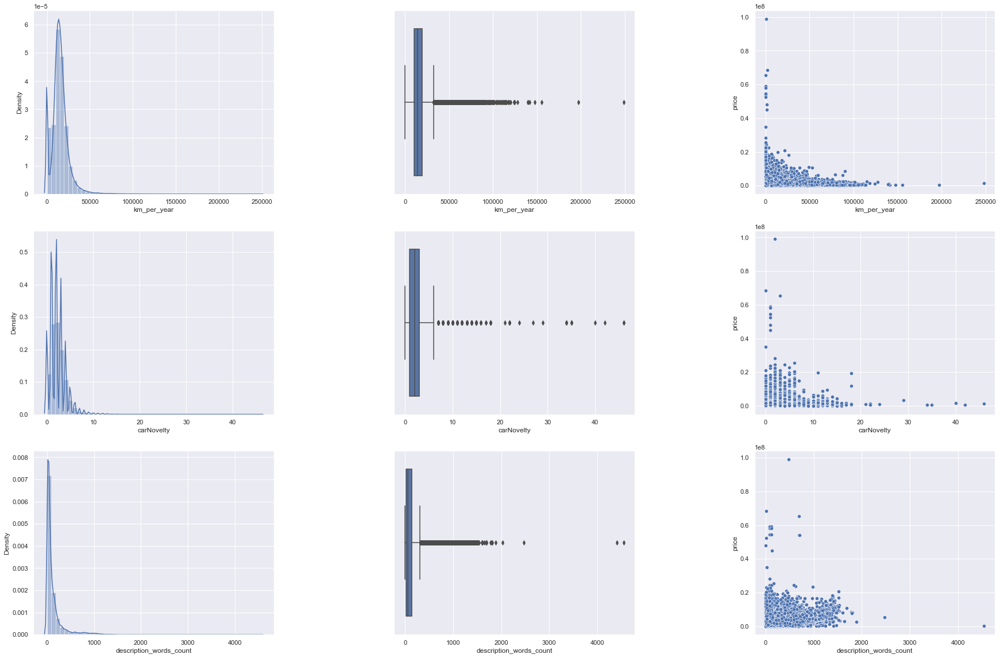

In [224]:
print("Диаграмы распределения новых числовых признаков, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(len(num_cols_new), 3, figsize=(30, 20))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in num_cols_new:
    sns.distplot(data[col], ax=axes[i])
    i = i + 1
    sns.boxplot(data[col], ax=axes[i])
    i = i + 1
    sns.scatterplot(data=data[data['train'] == 1],
                    x=col, y="price", ax=axes[i])
    i = i + 1

Графики для переменной  prodDate_3Y


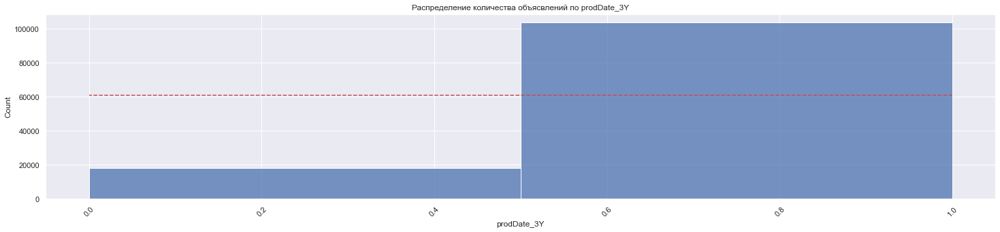

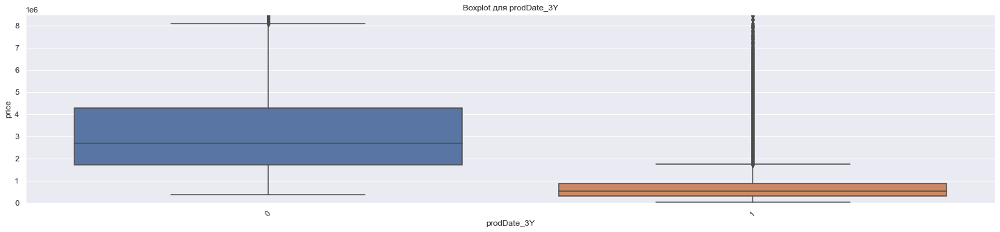



Графики для переменной  prodDate_5Y


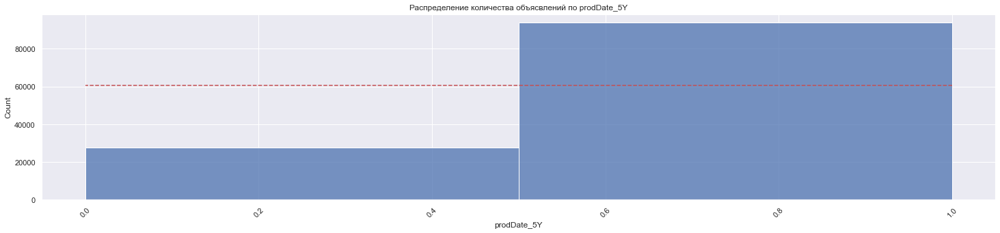

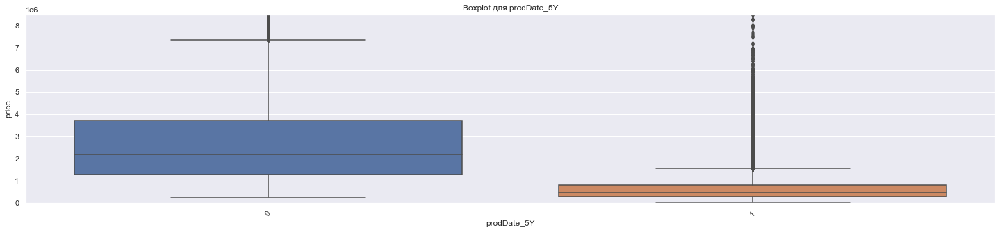



Графики для переменной  ownershipTimeIsNull


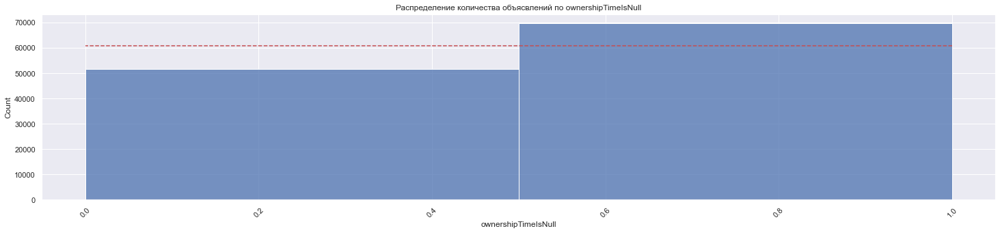

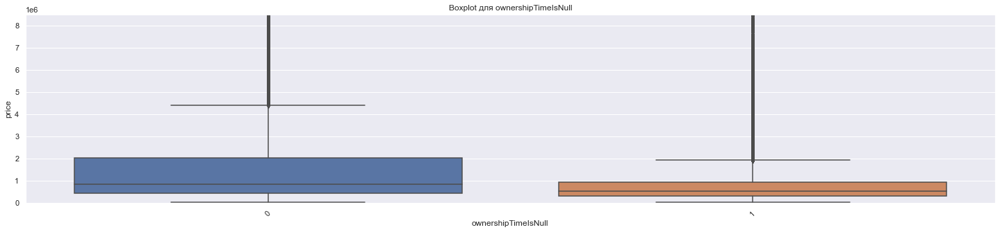



Графики для переменной  descriptionIsNull


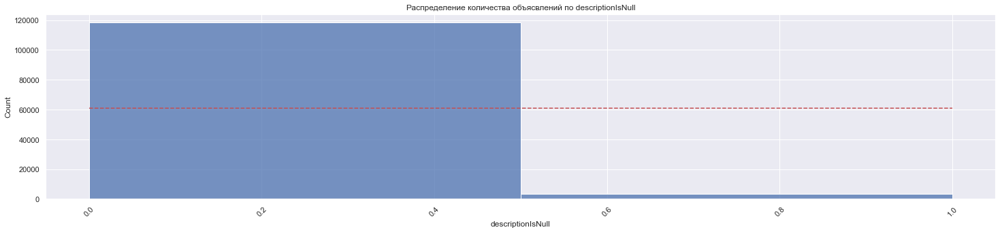

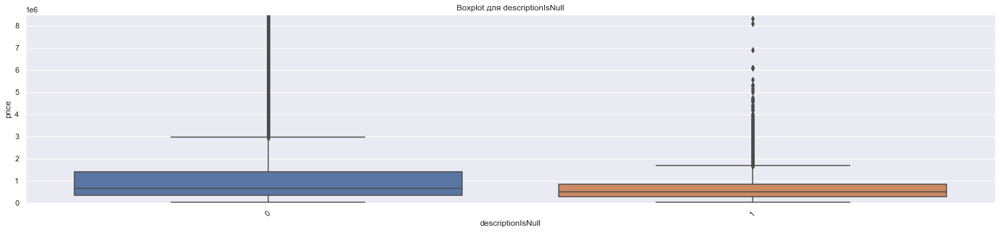



Графики для переменной  newCar


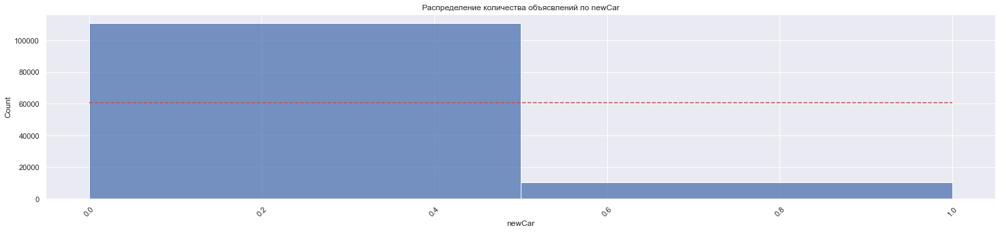

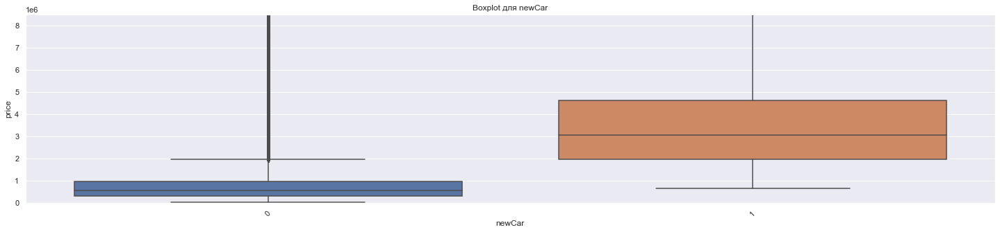



Графики для переменной  brandPopular


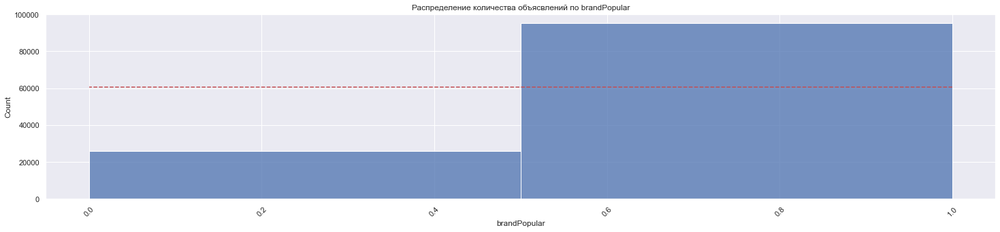

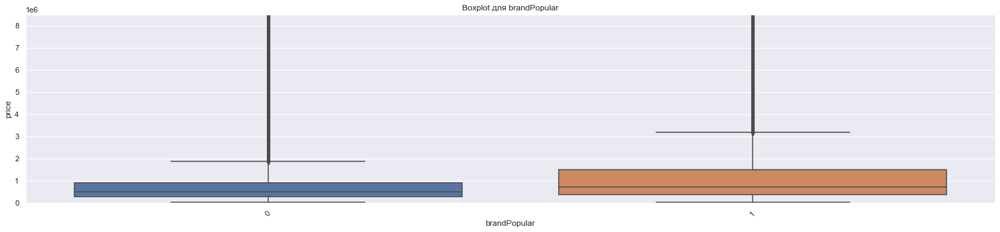



Графики для переменной  modelPopular


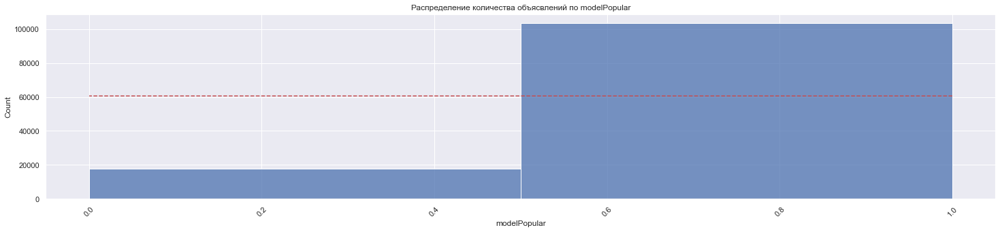

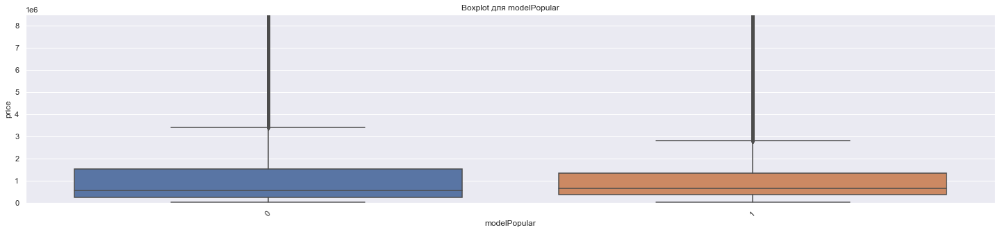



Графики для переменной  colorPopular


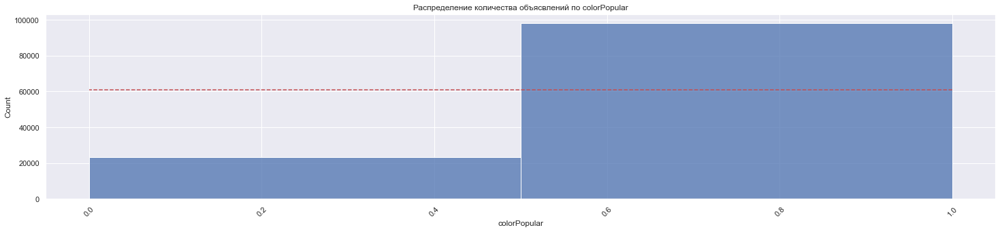

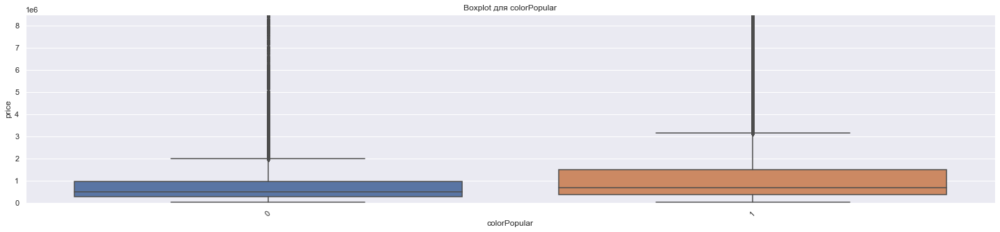



Графики для переменной  rarity


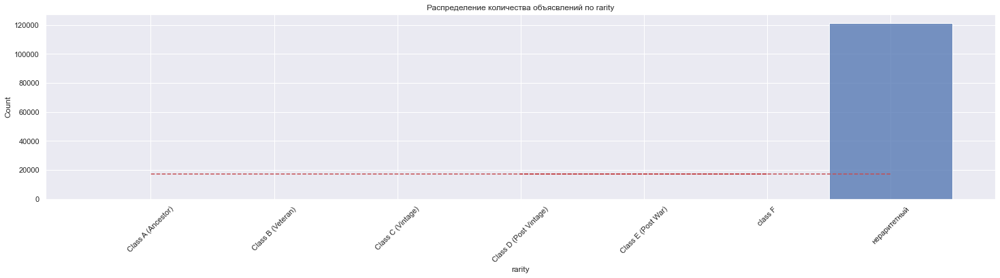

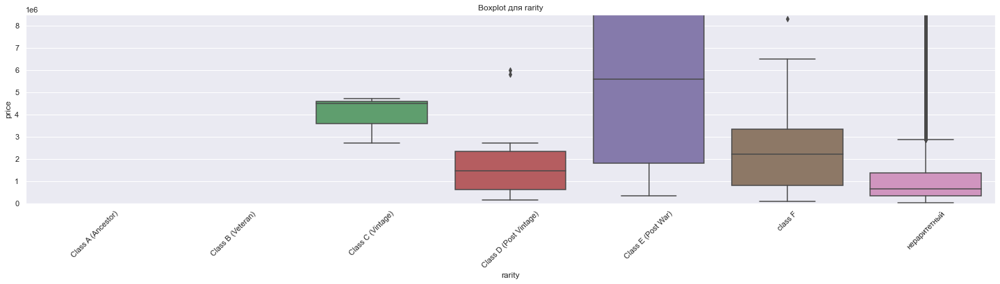

In [225]:
# Посмотрим внимательно на графики еще раз
for col in (bin_cols_new+cat_cols_new):
    print("Графики для переменной ", col)
    analyze_cat_cols(col)
    print("\n")

Выводы:
- у числовых признаков опять тяжелый правый хвост. Попробовать работу с выбросами и логарифмирование признаков.
- визуально добавленные признаки статистически значимы и оказывают влияние на формирование цены. Проверим это на этапе отбора признаков.

###  <a id="3.7"></a> 3.7 Обработка выбросов

Признаки проанализированы, новые фичи созданы.
Проведем поиск, анализ и обработку выбросов для числовых и категориальных признаков. Бинарные признаки не смотрим, т.к. мы их анализировали ранее и в них содержатся допустимые значения [0, 1].

In [226]:
# Проанализируем выбросы для категориальных и номинативных признаков
print("Отчет о наличии выбросов в датасете.\n")
for col in (num_cols + target_col):
    print("\nПризнак: ", col)
    iqr_analysis(data[col])
    print("-" * 100)

Отчет о наличии выбросов в датасете.


Признак:  modelDate

25-й перцентиль: 2004.0, 
75-й перцентиль: 2013.0, 
IQR: 9.0,  
Границы выбросов: [1990.5, 2026.5]. 

Минимальное значение признака: 1904. 
Максимальное значение признака: 2020 .

Найдены выбросы по нижней границе признака! Количество: 3068, 2.53%
----------------------------------------------------------------------------------------------------

Признак:  productionDate

25-й перцентиль: 2007.0, 
75-й перцентиль: 2015.0, 
IQR: 8.0,  
Границы выбросов: [1995.0, 2027.0]. 

Минимальное значение признака: 1904. 
Максимальное значение признака: 2021 .

Найдены выбросы по нижней границе признака! Количество: 3626, 2.98%
----------------------------------------------------------------------------------------------------

Признак:  enginePower

25-й перцентиль: 117.0, 
75-й перцентиль: 211.0, 
IQR: 94.0,  
Границы выбросов: [-24.0, 352.0]. 

Минимальное значение признака: 30.0. 
Максимальное значение признака: 639.0 .

Найдены выбро

Выводы:
1. Оставляем выбросы по признакам `modelDate`, `productionDate`, `carNovelty` - выбросы оставляем, т.к. в test выборке были значения с раратитными авто, которые нужно предсказывать.
2. По остальным выбросам проведем анализ и обработку.

Посмотрим детальнее на признаки, где были найдены выбросы. Основная идея: сравнить мин/макс границы по test датасету и удалить лишние данные, если их объем не очень большой.

**`enginePower`**

_Границы выбросов: [-24.0, 352.0]._

_Минимальное значение признака: 30.0. 
Максимальное значение признака: 639.0 ._

_Найдены выбросы по верхней границе признака! Количество: 5633, 4.64%_

In [227]:
# Посмотрим на максимальные значения признака в test
test.enginePower.max()

639.0

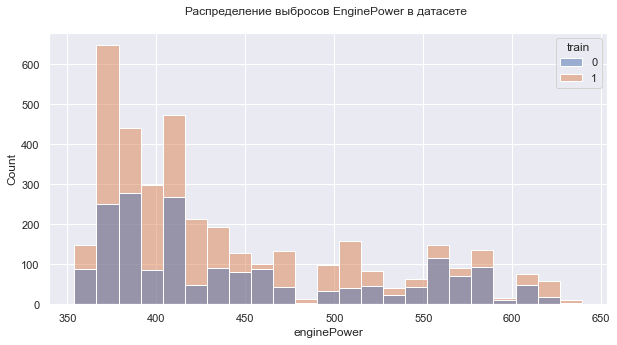

In [228]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.enginePower > 352)], x='enginePower', hue='train')
plt.title("Распределение выбросов EnginePower в датасете \n")
plt.show()

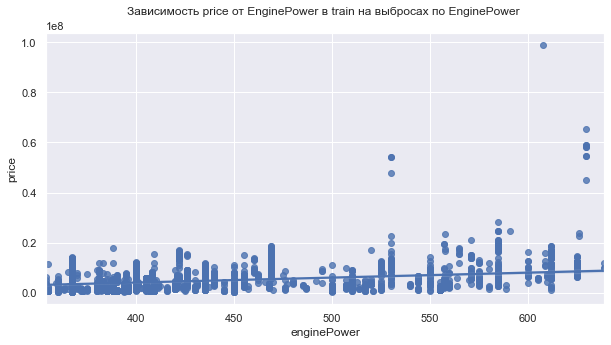

In [229]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.regplot(data=data[(data.enginePower > 352) & (
    data.train == 1)], x="enginePower", y="price")
plt.title("Зависимость price от EnginePower в train на выбросах по EnginePower \n")
plt.show()

Вывод: 
- Выбросы по признаку представлены как в train, так и в test части. Удалять строки нельзя, т.к. необходимо строить предсказания по большим значениям enginePower
- Цена варьтруется и увеличивается с увеличением мощности двигателя, заменять выбросы на другую величину не стоит
- Можно попробовать логарифмировать переменную.

Резюме: выбросы оставляем.

**`mileage`**

_Границы выбросов: [-112500.0, 387500.0]._

_Минимальное значение признака: 0.0. 
Максимальное значение признака: 1000000.0 ._

_Найдены выбросы по верхней границе признака! Количество: 2559, 2.11%_

In [230]:
# Посмотрим на максимальные значения признака в test
test.mileage.max()

1000000

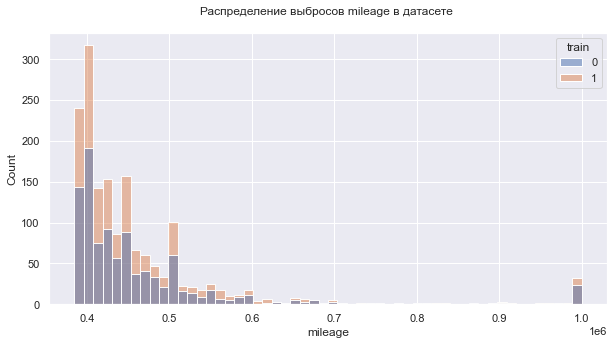

In [231]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.mileage > 385000)], x='mileage', hue='train')
plt.title("Распределение выбросов mileage в датасете \n")
plt.show()

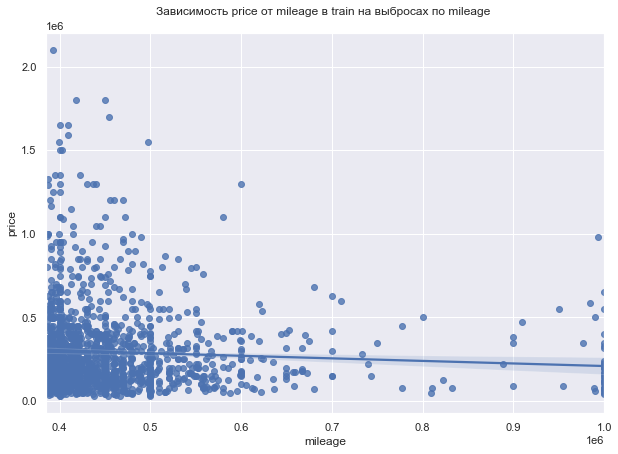

In [232]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 7))
sns.regplot(data=data[(data.mileage > 385000) & (
    data.train == 1)], x="mileage", y="price")
plt.title("Зависимость price от mileage в train на выбросах по mileage \n")
plt.show()

Вывод: 
- Выбросы по признаку представлены как в train, так и в test части. Удалять строки нельзя, т.к. необходимо строить предсказания по большим значениям mileage
- Цена варьтруется и снижается с увеличением пробега, но есть и увеличение цены на макимальных значениях пробега (раритетные авто?), заменять выбросы на другую величину не стоит
- Можно попробовать логарифмировать переменную.

Резюме: выбросы оставляем.

**`engineDisplacement`**

Признак позднее исключается из анализа.

_Границы выбросов: [0.2500000000000002, 3.8499999999999996]._

_Минимальное значение признака: 0.0. 
Максимальное значение признака: 8.4._

_Найдены выбросы по нижней границе признака! Количество: 2, 0.0%_

_Найдены выбросы по верхней границе признака! Количество: 8407, 6.93%_

In [233]:
# Посмотрим на максимальные значения признака в test
print("Максимальное значение engineDisplacement  в test:",
      test.engineDisplacement.max())
# Посмотрим на минимальное значения признака в test
print("Минимальное значение engineDisplacement  в test:",
      test.engineDisplacement.min())

Максимальное значение engineDisplacement  в test: 6.6
Минимальное значение engineDisplacement  в test: 0.7


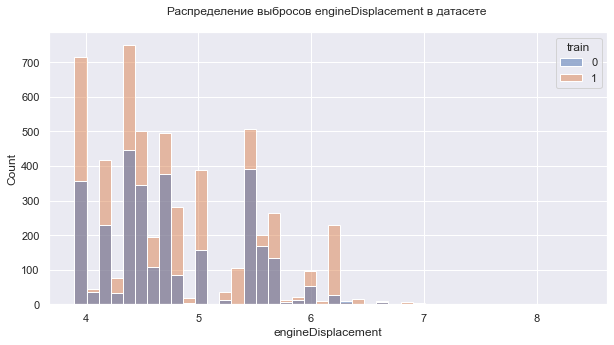

In [234]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.engineDisplacement > 3.85)],
             x='engineDisplacement', hue='train')
plt.title("Распределение выбросов engineDisplacement в датасете \n")
plt.show()

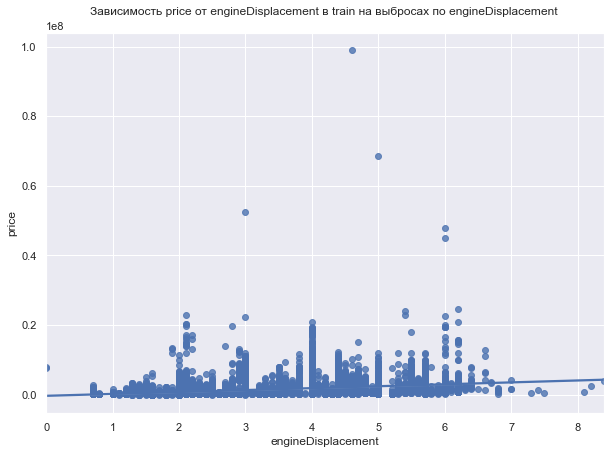

In [235]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 7))
sns.regplot(data=data[(data.mileage > 3.85) & (
    data.train == 1)], x="engineDisplacement", y="price")
plt.title("Зависимость price от engineDisplacement в train на выбросах по engineDisplacement \n")
plt.show()

In [236]:
# Посмотрим на записи, которые привышают максимальный порог test-а
data[(data.engineDisplacement > 6.6)].describe()

,modelDate,productionDate,engineDisplacement,enginePower,mileage,driveSide,condition,ownersCount,tcp,customs,...,carNovelty,prodDate_3Y,prodDate_5Y,ownershipTimeIsNull,descriptionIsNull,newCar,brandPopular,modelPopular,colorPopular,description_words_count
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,...,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,1988.94,1992.29,7.18,332.76,140117.59,0.00,0.00,2.35,0.82,0.00,...,3.35,1.00,1.00,0.41,0.00,0.00,0.71,0.06,0.76,71.35
std,17.21,17.43,0.56,95.39,130645.48,0.00,0.00,0.79,0.39,0.00,...,2.26,0.00,0.00,0.51,0.00,0.00,0.47,0.24,0.44,67.30
min,1956.00,1961.00,6.70,215.00,1000.00,0.00,0.00,1.00,0.00,0.00,...,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,7.00
25%,1972.00,1976.00,6.80,313.00,65000.00,0.00,0.00,2.00,1.00,0.00,...,2.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,24.00
50%,1999.00,1999.00,7.00,314.00,78000.00,0.00,0.00,3.00,1.00,0.00,...,4.00,1.00,1.00,0.00,0.00,0.00,1.00,0.00,1.00,40.00
75%,1999.00,2004.00,7.40,345.00,230000.00,0.00,0.00,3.00,1.00,0.00,...,5.00,1.00,1.00,1.00,0.00,0.00,1.00,0.00,1.00,67.00
max,2008.00,2013.00,8.40,600.00,403000.00,0.00,0.00,3.00,1.00,0.00,...,7.00,1.00,1.00,1.00,0.00,0.00,1.00,1.00,1.00,208.00


Вывод: 
- Выбросы по признаку представлены как в train, так и в test части. При этом пороговое (максимальное) значение в test ниже, чем граница выбросов.
- Цена варьтруется и увеличивается с увеличением объема двигателя
- Можно попробовать логарифмировать переменную.
- Также можно попробовать обработать выбросы заменой в строках > 6.6 литров на максимальное значение из теста. Записи удалять не хочется, т.к. представлены старые автомобили.

Резюме: заменяем значения в части выбросов. Upd: после моделирования данную обработку выбросов решили закомментировать, т.к. ухудшала позицию на лидерборде.

In [237]:
# Заменяем выбросы на максимальное значение признака в тесте
# data.engineDisplacement = data.engineDisplacement.apply(lambda x: test.engineDisplacement.max(
# ) if x > test.engineDisplacement.max() else x)

**`description_words_count`**

_Границы выбросов: [-153.5, 314.5]._

_Минимальное значение признака: 0._ 
_Максимальное значение признака: 4545._

_Найдены выбросы по верхней границе признака! Количество: 11097, 9.13%_

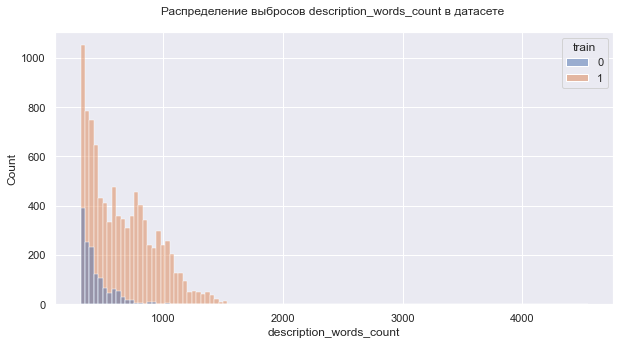

In [238]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.description_words_count > 315)],
             x='description_words_count', hue='train')
plt.title("Распределение выбросов description_words_count в датасете \n")
plt.show()

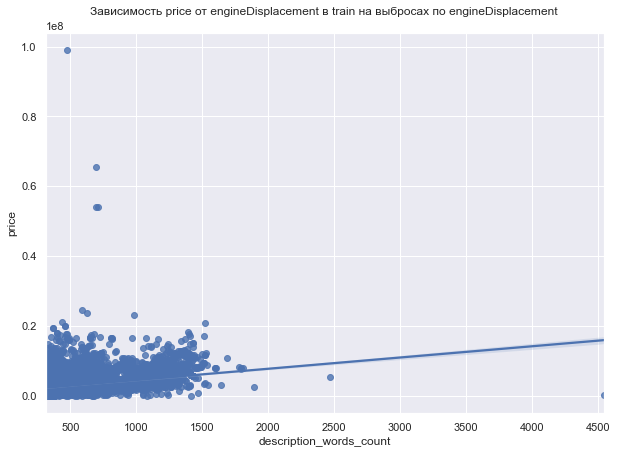

In [239]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 7))
sns.regplot(data=data[(data.description_words_count > 315) & (
    data.train == 1)], x="description_words_count", y="price")
plt.title("Зависимость price от engineDisplacement в train на выбросах по engineDisplacement \n")
plt.show()

Вывод: 
- Выбросы по признаку представлены как в train, так и в test части. 
- Выбросов после 2500 немного, но цена заметно увеличивается, поэтому пока оставим без изменений
- Можно попробовать логарифмировать переменную.

Резюме: выбросы пока оставляем.

**`price`**

_Границы выбросов: [-1417500.0, 2362500.0]._

_Минимальное значение признака: 0.0._ 
_Максимальное значение признака: 99000000.0._

_Найдены выбросы по верхней границе признака! Количество: 11649, 9.59%_

Проанализировать, но вообще, log значение выбросы не содержит, а мы его используем в моделях.

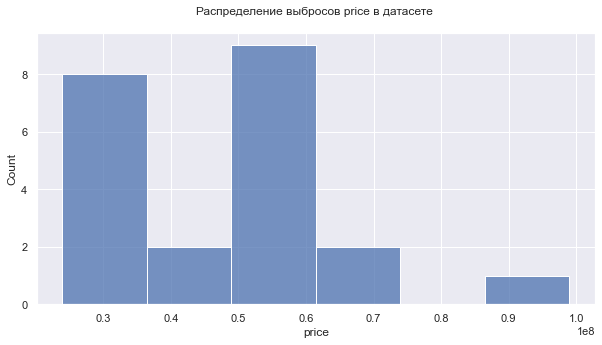

In [240]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.price > 23362500) & (data.train == 1)], x='price')
plt.title("Распределение выбросов price в датасете \n")
plt.show()

In [241]:
data[(data.price > 23362500) & (data.train == 1)].describe(include=object)

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,description,drivetrain,ownershipTime,model,vendor
count,22,22,22,22,22,22,22,22,22,22,22,22,22
unique,5,2,5,3,10,3,10,3,22,2,4,9,1
top,седан,MERCEDES,чёрный,бензин,650 6.0 AT (630 л.с.),4,SEDAN AUTOMATIC 650,автоматическая,Дни продаж «Мерседес-Бенц» в АВИЛОН!\n\nДилеро...,задний,no_data,S_CLASS_MAYBACH,EUROPEAN
freq,13,21,13,20,8,13,8,18,1,17,19,11,22


In [242]:
# Посмотрим, какие машины имеют особо высокие цены
data[(data.price > 23362500) & (data.train == 1)].groupby(
    ['brand', 'model'])['price'].agg(['count', 'max'])
# Добавим список моделей в список
models_list = data[(data.price > 23362500) & (data.train == 1)].model.values

In [243]:
# Вспомним, сколько авто таких моделей присутствует в тесте
data[(data.model.isin(models_list)) & (data.train == 0)].groupby(
    ['brand', 'model'])['model'].count()

brand     model          
MERCEDES  G_KLASSE_AMG        69
          SLR_KLASSE           1
          SLS_AMG              4
          S_CLASS_MAYBACH     53
          S_KLASSE           549
          V_KLASSE            74
          W136                 1
          W188                 1
Name: model, dtype: int64

Вывод: есть очень дорогие авто, которые представлены и в стестовой выборке.

Самый дорогой автомобиль - PORSCHE	918_SPYDER, бренд PORSCHE в тестовой выборке отсутствует, удалим этот выброс. UPD: данную обработку закомментировали, т.к. ухудшало MAPE и позицию на лидерборде.

In [244]:
# Удаляем строку
#data.drop([data[data.model == '918_SPYDER'].index[0]], inplace=True)

**Логарифмирование числовых признаков**

Поскольку многие числовые переменные имеют смещенное распределение влево/вправо попробуем логарифмировать часть признаков.

In [245]:
cols_to_log = ['enginePower', 'mileage',
               'engineDisplacement', 'description_words_count']
# Применим логарифмирование ко всем числовым признакам
for col in cols_to_log:
    data[col] = data[col].apply(lambda w: np.log(w+1))

Диаграмы распределения числовых признаков после логарифмирования.


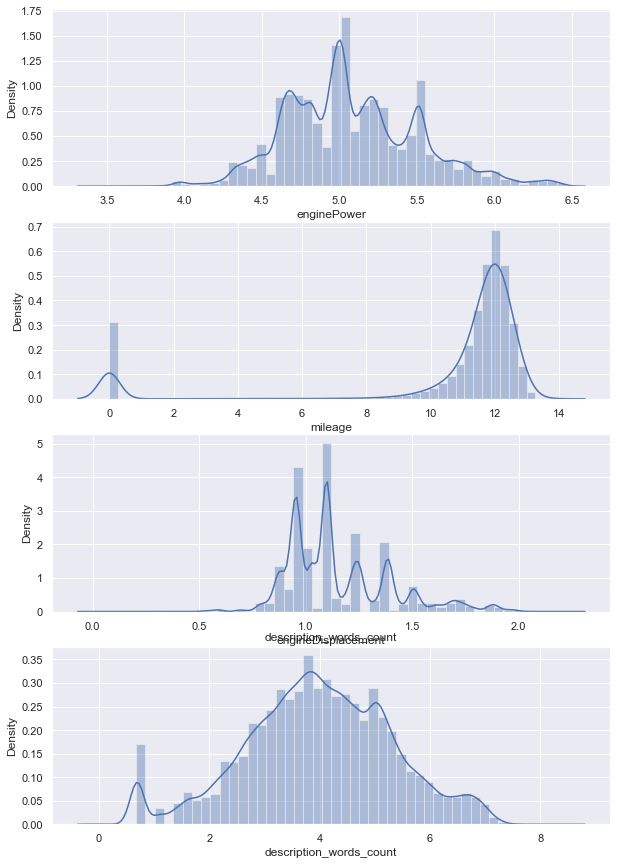

In [246]:
# Посмотрим, как изменилось распределение
print("Диаграмы распределения числовых признаков после логарифмирования.")
fig, axes = plt.subplots(len(cols_to_log), figsize=(10, 15))
axes = axes.flatten()
i = 0

for col in cols_to_log:
    sns.distplot(data[col], ax=axes[i])
    plt.title(col)
    i = i + 1

Вывод: логарифмирование позволило привести признаки к более нормальному распределению. Оставим в таком виде.

###  <a id="3.8"></a> 3.8 Отбор признаков для моделирования

#### Корреляционный анализ числовых признаков

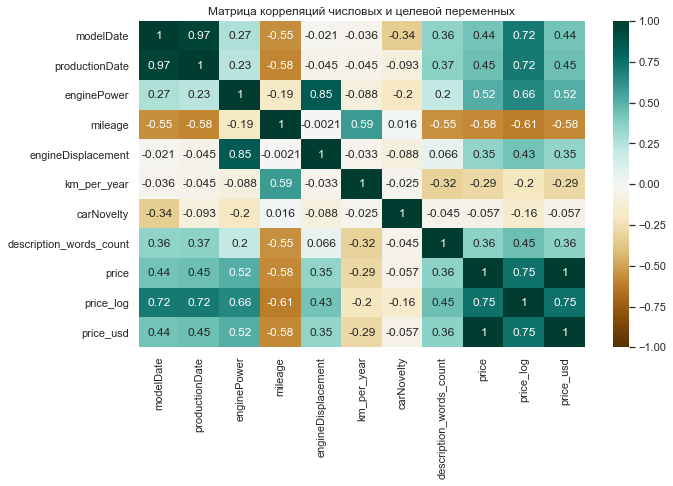

In [247]:
# Построим матрицу корреляций
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(data[data['train'] == 1][num_cols +
                                               target_col].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций числовых и целевой переменных')
plt.show()

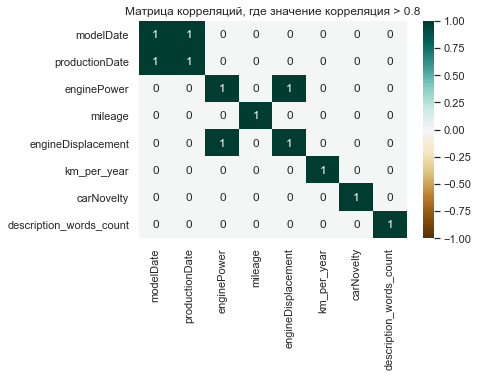

In [248]:
# Подсветим те значения, где коэффициент корреляции больше заданного порога
plt.figure(figsize=(6, 4))
heatmap = sns.heatmap(abs(data[data['train'] == 1][num_cols].corr(
)) > 0.8, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций, где значение корреляция > 0.8')
plt.show()

Сформируем список признаков, которые коллинеарны. Для этого выставим критерий наличия корреляции больше 0.8 или -0.8.

In [249]:
# Сформируем сет со скоррелированными признаками
correlated_features = set()

# Удаляем целевые и служебные переменные из матрицы коррелиций, тк корреляция с ней, - хорошо для модели
correlation_matrix = data[data['train'] == 1][num_cols].corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            colname = correlation_matrix.columns[j]
            correlated_features.add(colname)

print('Список скоррелированных признаков на удаление из обучения модели:',
      correlated_features)

Список скоррелированных признаков на удаление из обучения модели: {'enginePower', 'modelDate'}


Вывод: найдены сильно скоррелированные признаки, но мы это уже видели во время анализа ранее и добавили признаки в список на исключение.

#### Удаление признаков перед моделированием

In [250]:
# Удаляем признаки из датасета, которые решили удалить по ходу анализа
data.drop(cols_removal, axis=1, inplace=True)

In [251]:
# Смотрим, какие признаки остались
print("После обработки остались следующие признаки:", data.columns)

После обработки остались следующие признаки: Index(['bodyType', 'brand', 'color', 'fuelType', 'numberOfDoors',
       'productionDate', 'vehicleTransmission', 'enginePower', 'mileage',
       'drivetrain', 'driveSide', 'ownersCount', 'tcp', 'rarity', 'price',
       'model', 'vendor', 'train', 'sell_id', 'transmission', 'price_log',
       'RUB_USD_rate', 'price_usd', 'km_per_year', 'carNovelty', 'prodDate_3Y',
       'prodDate_5Y', 'ownershipTimeIsNull', 'descriptionIsNull', 'newCar',
       'brandPopular', 'modelPopular', 'colorPopular',
       'description_words_count'],
      dtype='object')


**Кодирование категориальных признаков**

Основная логика выбора способа кодирования:
- если у признака есть какая-то зависимость от порядкового номера категории или какая-то количественно выраженная разница между категориями, то используем label encodeing 
- если такого свойства нет и в списке большое количество значений, то пробуем one-hot-encoding.

UPD: после проведения экспериментов, было решено применить labels encoding ко всем категориальным признакам, т.к. даже после удаления статистически незначимых признаков, результаты были хуже. Требует больше времени на эксперименты.

In [252]:
# Выведем список всех категориальных признаков и количество уникальных значений после всех оброаботок
#data[list(set(data.columns) & set(cat_cols))].nunique()

In [253]:
# Попробуем закодировать следующие признаки через label encoding, т.к. они порядковые и немногочисленные
#labels_col = ['ownersCount', 'numberOfDoors']

In [254]:
# Попробуем закодировать следующие признаки через one hot encoding, т.к. они многочисленные и в них отсутсвует четкий порядок
# one_hot_cols = ['fuelType', 'color', 'model', 'drivetrain',
#               'vendor', 'brand', 'vehicleTransmission', 'bodyType', 'rarity']

#### Label Encoding

In [255]:
# Labels encoding for all
cols_to_encode = list(set(data.columns) & set(cat_cols))
for colum in cols_to_encode:
    data[colum] = data[colum].astype('category').cat.codes

In [256]:
# Labels encoding for chosen set
#cols_to_encode_lab = labels_col
# for colum in cols_to_encode_lab:
#    data[colum] = data[colum].astype('category').cat.codes

**One-Hot Encoding**

In [257]:
# Попробуем OneHotEncoder для кодирования категориальных признаков
#cols_to_encode = one_hot_cols
#
#ohe = OneHotEncoder(sparse=False)
#
# for col in cols_to_encode:
#    df_one = pd.DataFrame(ohe.fit_transform(data[[col]]))
#     df_one.columns = ohe.get_feature_names([f'hot_{col}'])
#    data = data.drop(col, axis=1)  # удаляем колонку, которую кодировали
#    data = pd.concat([data.reset_index(drop=True), df_one.reset_index(drop=True)], axis=1)

####  Поиск статистически значимых различий с помощью теста Стьюдента

Проверим, есть ли статистическая разница в распределении цен по категориальным и бинарным признакам, с помощью теста Стьюдента. Проверим нулевую гипотезу о том, что распределения цен по различным параметрам неразличимы.

In [258]:
# Создадим список с колонками, которые удалим из данных ввиду их статистической незначимости
cat_cols_remove = []

# Проходим по колонкам, которые исключали из корреляционного анализа
for column in (list(set(data.columns).difference(num_cols+service_cols+target_col))):
    #print("\n\nПроверяется колонка:", column)
    cat_cols_remove.append(get_stat_dif(column))

Не найдены статистически значимые различия для колонки и комбинации numberOfDoors (4, 0)
Не найдены статистически значимые различия для колонки и комбинации model (762, 793)
Не найдены статистически значимые различия для колонки и комбинации fuelType (0, 1)
Не найдены статистически значимые различия для колонки и комбинации color (15, 8)
Не найдены статистически значимые различия для колонки и комбинации brand (21, 27)
Не найдены статистически значимые различия для колонки и комбинации bodyType (10, 5)
Не найдены статистически значимые различия для колонки и комбинации rarity (6, 2)


Вывод: присутсвуют признаки, для которых, не все значения категорий влияют на целевую переменную, такие признаки можно было бы удалить, если бы использовали one hot encoding, пока оставляем.

In [259]:
# Блок ниже использовался для случая ипользования one hot encoding, пока закомментировали.
# print(cat_cols_remove)
#
# for item in cat_cols_remove:
#    if item == None:
#        cat_cols_remove.remove(item)
#
#cat_cols_remove = ['hot_model_BT_50', 'hot_model_BASSARA', 'hot_model_TIGGO_4', 'hot_model_607', 'hot_model_VELLFIRE', 'hot_model_Fit', 'hot_model_FAIRLADY_Z', 'hot_model_AVALON', 'hot_model_CIRRUS', 'hot_model_JUKE_NISMO', 'hot_model_SILVIA', 'hot_model_S5', 'hot_model_BB', 'hot_model_QX4', 'hot_model_COOLBEAR', 'hot_model_TIGRA', 'hot_model_ARISTO', 'hot_model_Pathfinder', 'hot_model_CLIO_RS', 'hot_model_Crown', 'hot_model_AXELA', 'hot_model_NITRO', 'hot_model_DURANGO', 'hot_model_SOLIO', 'hot_model_I10', 'hot_model_TAUNUS', 'hot_model_STINGER', 'hot_model_NADIA', 'hot_model_106', 'hot_model_CLARUS', 'hot_model_SIMPLEX', 'hot_model_4RUNNER', 'hot_model_Note', 'hot_model_DS3', 'hot_model_Navara (Frontier)', 'hot_model_CEED_GT', 'hot_model_CAPRICE', 'hot_model_Accord', 'hot_model_PROCEED_MARVIE', 'hot_model_300_LETTER_SERIES', 'hot_model_KALOS', 'hot_model_ROOMY', 'hot_model_GS', 'hot_model_PAJERO_MINI', 'hot_model_FORENZA', 'hot_model_CROWN_VICTORIA', 'hot_model_PRESEA', 'hot_model_FREDA', 'hot_model_EQUINOX', 'hot_model_A-Класс', 'hot_model_ATOS', 'hot_model_FIESTA_ST', 'hot_model_PATROL', 'hot_model_SC', 'hot_model_918_SPYDER', 'hot_model_INTEGRA', 'hot_model_V40_CC', 'hot_model_PAO', 'hot_model_HARRIER', 'hot_model_QX56', 'hot_model_VANETTE', 'hot_model_WINGLE_UP', 'hot_model_02', 'hot_model_C6', 'hot_model_Presage', 'hot_model_Auris', 'hot_model_MEGANE_RS', 'hot_model_DINGO', 'hot_model_INSPIRE', 'hot_model_QUEST', 'hot_model_I_MIEV', 'hot_model_SAMURAI', 'hot_model_B_KLASSE', 'hot_model_760', 'hot_model_S4', 'hot_model_CAPELLA', 'hot_model_STREAM', 'hot_model_Ipsum', 'hot_model_MARCH', 'hot_model_FORESTER', 'hot_model_MISTRAL', 'hot_model_Passo', 'hot_model_AGILA', 'hot_model_EMGRAND_7', 'hot_model_FTO', 'hot_model_Tiida', 'hot_model_BONUS_3', 'hot_model_X3_M', 'hot_model_121', 'hot_model_CEDRIC', 'hot_model_QUORIS', 'hot_model_CORSA_OPC', 'hot_model_GRANDEUR', 'hot_model_IMPREZA_WRX_STI', 'hot_model_PASSO', 'hot_model_SLK_KLASSE_AMG', 'hot_model_Pajero Sport', 'hot_model_140', 'hot_model_COROLLA_II', 'hot_model_SIGNUM', 'hot_model_BX', 'hot_model_Karoq', 'hot_model_V8', 'hot_model_DS5', 'hot_model_QASHQAI_PLUS_2', 'hot_model_Sentra', 'hot_model_DAMAS', 'hot_model_VERSO_S', 'hot_model_20', 'hot_model_300C', 'hot_model_Cefiro', 'hot_model_SLC_KLASSE', 'hot_model_CROWN_MAJESTA', 'hot_model_N_WGN', 'hot_bodyType_фастбек', 'hot_model_WINDOM', 'hot_model_TRACKER', 'hot_model_CALIFORNIA', 'hot_model_Carina E', 'hot_model_ATLAS', 'hot_model_STEPWAGON', 'hot_model_RODIUS', 'hot_model_AYGO', 'hot_model_EUNOS_100', 'hot_model_90', 'hot_model_NAVARA', 'hot_model_CORRADO', 'hot_model_FAMILIA', 'hot_model_FIT', 'hot_model_944', 'hot_model_ISTANA', 'hot_model_VITARA', 'hot_model_LAFESTA', 'hot_model_TARO', 'hot_model_LIBETY_NA', 'hot_model_HIACE', 'hot_model_Rasheen', 'hot_model_XG', 'hot_model_PREMIO', 'hot_model_W114', 'hot_model_FREESTYLE', 'hot_model_XSARA', 'hot_model_PERI', 'hot_model_SPARKY', 'hot_model_OTTI', 'hot_model_ALMERA_TINO', 'hot_model_I30_N', 'hot_model_ORION', 'hot_model_GLB', 'hot_model_180SX', 'hot_model_AIRTREK', 'hot_model_RAFAGA', 'hot_model_Q30', 'hot_model_FLORID', 'hot_model_X4_M', 'hot_model_COWRY', 'hot_model_SAMBAR', 'hot_model_LOGO', 'hot_model_920', 'hot_model_HOVER_M4', 'hot_model_Teana', 'hot_model_REGIUS', 'hot_model_DEER', 'hot_model_VERISA', 'hot_model_EXPLORER_SPORT_TRAC', 'hot_model_LITE_ACE', 'hot_model_Amarok', 'hot_model_HOVER_M2', 'hot_model_TACOMA', 'hot_model_Odyssey', 'hot_model_C-HR', 'hot_model_SCIROCCO', 'hot_model_MAGNUM', 'hot_model_EDIX', 'hot_model_TIGGO_7', 'hot_model_100_SERIES', 'hot_model_MOBILIO', 'hot_model_4007', 'hot_model_RX_7', 'hot_model_CORONA_EXIV', 'hot_model_MOCO', 'hot_model_ACTY', 'hot_model_RIDGELINE', 'hot_model_KLUGER', 'hot_model_SSR', 'hot_model_AIRWAVE', 'hot_model_LANCER_EVOLUTION', 'hot_model_RENO', 'hot_model_AQUA', 'hot_model_TYPE_3', 'hot_model_Civic', 'hot_model_Vitz', 'hot_model_ELEMENT', 'hot_model_VIPER', 'hot_model_March', 'hot_model_TTS', 'hot_model_HUSTLER', 'hot_model_NP300', 'hot_model_XEDOS_9', 'hot_model_ORIENTAL_SON', 'hot_model_BIANTE', 'hot_fuelType_газ', 'hot_model_CLUBMAN', 'hot_model_FREED', 'hot_model_RSQ3', 'hot_model_HATCH', 'hot_model_Galant', 'hot_model_SEDONA', 'hot_model_Touran', 'hot_model_301', 'hot_model_RS3', 'hot_model_NOAH', 'hot_model_I3', 'hot_model_DS4', 'hot_model_MARK_X', 'hot_model_Passat', 'hot_model_G-Класс', 'hot_model_PRAIRIE', 'hot_model_JUMPY', 'hot_model_Tiguan', 'hot_model_MX_6', 'hot_model_Bora', 'hot_model_POPULAR', 'hot_model_SIDEKICK', 'hot_model_K5_BLAZER', 'hot_model_GLORIA', 'hot_model_V40', 'hot_model_STARLET', 'hot_model_SIENTA', 'hot_model_LANTRA', 'hot_model_N_BOX', 'hot_model_Eclipse Cross', 'hot_model_PASEO', 'hot_model_CAYMAN_GT4', 'hot_model_X_TRAIL', 'hot_model_DS', 'hot_model_CAMRY', 'hot_model_XEDOS_6', 'hot_model_URVAN', 'hot_model_COMMANDER', 'hot_model_RETONA', 'hot_model_HILUX_SURF', 'hot_model_VOLT', 'hot_model_PREMACY', 'hot_model_Z3M', 'hot_model_ARTEON', 'hot_model_Patrol', 'hot_model_PRIMASTAR', 'hot_model_ARKANA', 'hot_model_PRESIDENT', 'hot_model_Golf', 'hot_model_AVANCIER', 'hot_model_C70', 'hot_model_NEMO', 'hot_model_280ZX', 'hot_model_WISH', 'hot_model_CARINA_ED', 'hot_model_CIVIC_TYPE_R', 'hot_model_MOBILIO_SPIKE', 'hot_model_1007', 'hot_model_PROBE', 'hot_model_6 серии', 'hot_model_ASTRO', 'hot_model_DOKKER', 'hot_model_ORIGIN', 'hot_model_Montero', 'hot_model_ALERO', 'hot_model_CHARIOT', 'hot_model_LHS', 'hot_model_CORSICA', 'hot_model_TERRANO_REGULUS', 'hot_model_TOWN_AND_COUNTRY', 'hot_model_ODYSSEY', 'hot_model_GRANDLAND_X', 'hot_model_CROSSTOUR', 'hot_model_H200', 'hot_model_DUET', 'hot_model_STAGEA', 'hot_model_MUSSO', 'hot_model_BREVIS', 'hot_model_TICO', 'hot_model_PRIUSPLUS', 'hot_model_GL-Класс', 'hot_model_LUMINA', 'hot_model_806', 'hot_model_MR_S', 'hot_model_KAROQ', 'hot_model_CAMI', 'hot_model_CITAN', 'hot_model_PRESAGE', 'hot_model_TINO', 'hot_model_VISION', 'hot_model_KORANDO_SPORTS', 'hot_model_SUCCEED', 'hot_model_CATERA', 'hot_model_Caddy', 'hot_model_FUGA', 'hot_model_S7', 'hot_model_GC6', 'hot_model_LANCER_RALLIART', 'hot_model_Lancer', 'hot_model_GAIA', 'hot_model_C-Класс', 'hot_model_TIGGO_2', 'hot_model_200SX', 'hot_model_Pilot', 'hot_model_CX_3', 'hot_model_CAROL', 'hot_model_S_TYPE', 'hot_model_S70', 'hot_model_PASSPORT', 'hot_model_YARIS_VERSO', 'hot_model_BEETLE', 'hot_model_TUCSON', 'hot_model_RC_F', 'hot_model_FABIA_RS', 'hot_model_LUPO', 'hot_model_AERIO', 'hot_model_S6', 'hot_model_EX', 'hot_model_OUTLANDER', 'hot_model_XJS', 'hot_model_XV', 'hot_model_C30', 'hot_model_R2', 'hot_model_Transporter', 'hot_model_L400', 'hot_model_SPACE_GEAR', 'hot_model_REGIUSACE', 'hot_model_DELICA_D2', 'hot_model_VIGOR', 'hot_model_MX_5', 'hot_model_VERNA', 'hot_model_605', 'hot_model_VOXY', 'hot_model_100NX', 'hot_model_SC7', 'hot_model_RC', 'hot_model_VERSO', 'hot_model_OLYMPIA', 'hot_model_IST', 'hot_model_COROLLA_VERSO', 'hot_model_Z3', 'hot_model_C_KLASSE', 'hot_model_GLC Coupe', 'hot_model_FR_V', 'hot_model_ALLEX', 'hot_model_PRELUDE', 'hot_model_LASER', 'hot_model_PRIDE', 'hot_model_928', 'hot_model_BRZ', 'hot_model_CARNIVAL', 'hot_model_Legend', 'hot_model_508', 'hot_model_CONCORDE', 'hot_model_Eos', 'hot_model_XFR', 'hot_model_MALIBU', 'hot_model_AUTOZAM_AZ3', 'hot_model_RACTIS', 'hot_model_Fabia', 'hot_model_FOCUS_NA', 'hot_model_KIX', 'hot_model_TIGGO_5', 'hot_model_QQ', 'hot_model_C3_AIRCROSS', 'hot_model_HS', 'hot_model_AVANTE', 'hot_model_Camry', 'hot_model_440', 'hot_model_CHARGER', 'hot_model_MR2', 'hot_model_CHAIRMAN', 'hot_model_K3', 'hot_model_RVR', 'hot_model_CAMRY_SOLARA', 'hot_model_SERIES_III', 'hot_model_ECHO', 'hot_model_M_KLASSE_AMG', 'hot_model_CITY', 'hot_model_A1', 'hot_model_SANTAMO', 'hot_model_5', 'hot_model_DAYZ', 'hot_model_WAGON_R_PLUS', 'hot_model_RANGER', 'hot_model_EMGRAND_GT', 'hot_model_LANCER_CARGO', 'hot_model_FAVORIT', 'hot_model_ELGRAND', 'hot_model_3008', 'hot_model_Primera', 'hot_model_C_CROSSER', 'hot_model_KIZASHI', 'hot_model_C2', 'hot_model_924', 'hot_model_CL_KLASSE', 'hot_model_Corolla Verso', 'hot_model_SOARER', 'hot_model_VIANO', 'hot_model_STAVIC', 'hot_model_CRETA', 'hot_model_DION', 'hot_model_Murano', 'hot_model_DAKOTA', 'hot_model_RCZ', 'hot_model_JAZZ', 'hot_model_TOURNEO_CUSTOM', 'hot_model_PATRIOT', 'hot_model_350Z', 'hot_model_GRAND_CHEROKEE', 'hot_model_R1', 'hot_model_CAVALIER', 'hot_model_326', 'hot_model_EXPEDITION', 'hot_model_VECTRA_OPC', 'hot_model_Q60', 'hot_model_GLA_CLASS_AMG', 'hot_model_Vezel', 'hot_model_GLK-Класс', 'hot_model_Superb', 'hot_model_LEGACY_LANCASTER', 'hot_model_Serena', 'hot_model_ESQUIRE', 'hot_model_SPADE', 'hot_model_Qashqai', 'hot_model_SLK_KLASSE', 'hot_model_Sprinter Trueno', 'hot_model_JOURNEY', 'hot_model_Terrano', 'hot_model_K900', 'hot_model_N_ONE', 'hot_model_Outlander', 'hot_model_IPSUM', 'hot_model_GRAND_HIACE', 'hot_model_PACIFICA', 'hot_model_G', 'hot_model_Hilux', 'hot_model_ARMADA', 'hot_model_IS', 'hot_model_QASHQAI', 'hot_model_CALIBRA', 'hot_color_оранжевый', 'hot_model_Vito', 'hot_model_STELLA', 'hot_model_SVX', 'hot_model_AVALANCHE', 'hot_model_S2000', 'hot_model_FJ_CRUISER', 'hot_model_SEVILLE', 'hot_model_MONZA', 'hot_model_LEGEND', 'hot_model_LEAF', 'hot_model_BLUEBIRD', 'hot_model_VEL_SATIS', 'hot_model_ODYSSEY_NA', 'hot_model_M3', 'hot_model_MINICAB', 'hot_model_L200', 'hot_model_STS', 'hot_model_FUNCARGO', 'hot_model_TAURUS', 'hot_model_XJ', 'hot_model_NEW_YORKER', 'hot_model_M-Класс', 'hot_model_ORTHIA', 'hot_model_WRX_STI', 'hot_model_DATSUN', 'hot_model_Q', 'hot_model_A2', 'hot_model_TUSCANI', 'hot_model_IGNIS', 'hot_model_300M', 'hot_model_LANTIS', 'hot_model_PILOT', 'hot_model_ATS', 'hot_model_MARK_X_ZIO', 'hot_model_BLADE', 'hot_model_DISCOVERY', 'hot_model_CR_X', 'hot_model_Juke', 'hot_model_VITA', 'hot_model_RAV4', 'hot_model_RS5', 'hot_model_300ZX', 'hot_model_DART', 'hot_model_VENZA', 'hot_model_JOICE', 'hot_model_ECONOLINE', 'hot_model_ESPACE', 'hot_model_LE_BARON', 'hot_model_Corolla', 'hot_model_CT', 'hot_model_FUSION_NA', 'hot_model_MAGNUS', 'hot_model_TWINGO', 'hot_model_Rapid', 'hot_model_ECOSPORT', 'hot_model_Jetta', 'hot_model_LATITUDE', 'hot_model_JX', 'hot_model_CROSSROAD', 'hot_model_TRAVIQ', 'hot_model_XF', 'hot_model_4008', 'hot_model_AVENSIS_VERSO', 'hot_model_CELSIOR', 'hot_model_Pajero', 'hot_model_Z', 'hot_color_серый', 'hot_model_WILL_CYPHA', 'hot_model_SQ5', 'hot_model_CROSS_EASTAR', 'hot_model_XJR', 'hot_model_CLK-Класс', 'hot_model_LIBERO', 'hot_model_IQ', 'hot_model_RAIDER', 'hot_model_ZX', 'hot_model_306', 'hot_model_Passat CC', 'hot_model_WINDSTORM', 'hot_model_SELTOS', 'hot_model_V60', 'hot_model_RS 5', 'hot_model_KAPTUR', 'hot_model_COUGAR', 'hot_model_XK', 'hot_model_SABER', 'hot_model_PROGRES', 'hot_model_VEROSSA', 'hot_model_OCTAVIA_RS', 'hot_model_PORTE', 'hot_model_S3', 'hot_model_Yeti', 'hot_model_A5', 'hot_model_TYPE_2', 'hot_model_CRUZE_HR', 'hot_model_SIENNA', 'hot_model_FLEETWOOD', 'hot_model_2GRANDTOURER', 'hot_model_CADDY', 'hot_model_CTS_V', 'hot_model_EVANDA', 'hot_model_DOMINGO', 'hot_model_MURANO', 'hot_model_WAGON_R', 'hot_model_XANTIA', 'hot_model_EVERY', 'hot_model_ASCOT', 'hot_model_968', 'hot_model_I', 'hot_model_PROTEGE', 'hot_model_PROBOX', 'hot_model_COROLLA_RUMION', 'hot_model_2ACTIVETOURER', 'hot_model_W110', 'hot_model_GOLF_R', 'hot_model_VENTURE', 'hot_model_ELYSION', 'hot_model_SAFARI', 'hot_model_2 серии Gran Tourer', 'hot_model_CLC_KLASSE', 'hot_model_QX30', 'hot_model_Bluebird', 'hot_model_CR_Z', 'hot_model_PEGASUS', 'hot_model_BRONCO', 'hot_model_ASPIRE', 'hot_model_CAYMAN', 'hot_model_OPTIMA', 'hot_model_AVENIR', 'hot_model_W189', 'hot_model_VELOSTER', 'hot_model_RAY', 'hot_model_B_SERIES', 'hot_model_TRAJET', 'hot_model_CLA', 'hot_model_203', 'hot_model_AVANTIME', 'hot_model_6_MPS', 'hot_model_EXCURSION', 'hot_model_RAUM', 'hot_model_MONTE_CARLO', 'hot_model_S_MX', 'hot_model_ADMIRAL', 'hot_model_PICNIC', 'hot_model_JUSTY', 'hot_model_CONTOUR', 'hot_model_DOMANI', 'hot_model_SPLASH', 'hot_model_VIVA', 'hot_model_DIAMANTE', 'hot_model_GLA', 'hot_model_KA', 'hot_model_LARGO', 'hot_model_GOLF_GTI', 'hot_model_SPRINTER_MARINO', 'hot_model_SLC_KLASSE_AMG', 'hot_model_LAUREL', 'hot_model_EFINI_MS_8', 'hot_model_CONCERTO', 'hot_model_405', 'hot_model_CLIPPER_RIO', 'hot_model_PLATZ', 'hot_model_ALTIMA', 'hot_model_CROSSFIRE', 'hot_model_Jeep J', 'hot_model_CR-V', 'hot_model_KORANDO', 'hot_model_EUROVAN', 'hot_model_RS4', 'hot_model_TERCEL', 'hot_model_GRANVIA', 'hot_color_синий', 'hot_model_ZEST', 'hot_model_205', 'hot_model_KOLEOS', 'hot_rarity_Class A (Ancestor)', 'hot_model_Q50', 'hot_model_LIFE', 'hot_model_E3', 'hot_model_ZEPHYR', 'hot_model_200', 'hot_model_HIGHLANDER', 'hot_model_Prius', 'hot_model_ISIS', 'hot_model_XCEED', 'hot_model_AD', 'hot_model_SPRINTER_TRUENO', 'hot_model_LUMINA_APV', 'hot_model_MEGA_CRUISER', 'hot_model_Pajero iO', 'hot_model_CIVIC_FERIO', 'hot_model_SAFRANE', 'hot_model_LM', 'hot_model_COROLLA_LEVIN', 'hot_model_MODUS', 'hot_model_DAYZ_ROOX', 'hot_model_C4_AIRCROSS', 'hot_model_GOLF_R32', 'hot_model_VAN', 'hot_model_GLC', 'hot_model_Avensis', 'hot_model_V70', 'hot_model_WILL', 'hot_model_VANGUARD', 'hot_model_GT', 'hot_model_ASTRA_OPC', 'hot_model_1 серии', 'hot_model_GENESIS', 'hot_model_SARATOGA', 'hot_model_SCEPTER_SEDAN', 'hot_model_Z4', 'hot_model_ENDEAVOR', 'hot_model_EXPERT', 'hot_model_TITAN', 'hot_model_FOCUS_ST', 'hot_model_340', 'hot_model_PACEMAN', 'hot_model_SPACE_RUNNER', 'hot_model_2008', 'hot_model_FESTIVA', 'hot_model_H_1_STAREX', 'hot_model_CYNOS', 'hot_model_Polo', 'hot_model_EOS', 'hot_model_Z1', 'hot_model_CHEROKEE', 'hot_model_Stepwgn', 'hot_model_MASTER_ACE_SURF', 'hot_model_MINICA', 'hot_model_NV200', 'hot_model_VERY', 'hot_model_CLIPPER', 'hot_model_CULTUS', 'hot_model_C8', 'hot_model_PULSAR', 'hot_model_CURREN', 'hot_model_MONDEO_ST', 'hot_model_GRANADA', 'hot_model_CTS', 'hot_model_TT_RS', 'hot_model_ZAFIRA_OPC', 'hot_model_GLK_KLASSE', 'hot_model_2 серии', 'hot_model_DELICA_D_5', 'hot_model_HOVERH6', 'hot_model_VENTO', 'hot_model_SRX', 'hot_model_S60_CROSS_COUNTRY', 'hot_model_GLC Coupe AMG', 'hot_model_POLO_GTI', 'hot_model_TIBURON', 'hot_model_120', 'hot_model_BEL_AIR', 'hot_model_TRAFIC', 'hot_model_TIGGO_3', 'hot_model_LIBERTY', 'hot_model_W186', 'hot_model_PREVIA', 'hot_model_LTD_CROWN_VICTORIA', 'hot_model_TT', 'hot_model_3MPS', 'hot_model_GRAND_STAREX', 'hot_model_C_HR', 'hot_model_208', 'hot_model_COROLLA_SPACIO', 'hot_model_Octavia', 'hot_model_CARAVAN_COACH', 'hot_model_PHAETON', 'hot_model_321', 'hot_model_GRACE', 'hot_model_REKORD', 'hot_model_XM', 'hot_model_240_SERIES', 'hot_model_KADETT', 'hot_model_R_KLASSE', 'hot_model_GENESIS_COUPE', 'hot_color_розовый', 'hot_model_EXPLORER', 'hot_model_SAILOR', 'hot_model_TYPE_1', 'hot_model_COUPE', 'hot_model_BONGO_FRIENDEE', 'hot_model_SHUTTLE', 'hot_model_WRX', 'hot_model_VITO', 'hot_model_DELICA', 'hot_model_AVENGER', 'hot_model_VEZEL', 'hot_model_ARRIZO7', 'hot_model_COMBO', 'hot_model_ESTIMA', 'hot_model_PRIUS_ALPHA', 'hot_model_BLS', 'hot_model_RX_8', 'hot_model_SUPRA', 'hot_model_MOHAVES', 'hot_model_CORTINA', 'hot_model_INSIGNIA_OPC', 'hot_model_FOX', 'hot_model_XKR', 'hot_model_SERA', 'hot_model_VIVARO', 'hot_model_MILLENIA', 'hot_model_UX', 'hot_model_Q70', 'hot_model_FOCUS_RS', 'hot_model_Viano', 'hot_model_EK_WAGON', 'hot_model_IMPALA', 'hot_model_LS', 'hot_model_EL_CAMINO', 'hot_model_CABRIO', 'hot_model_Colt', 'hot_model_SIGMA', 'hot_model_CMATIZ', 'hot_model_BLUEBIRD_SYLPHY', 'hot_model_SINTRA', 'hot_model_THUNDERBIRD', 'hot_model_V50', 'hot_model_HHR', 'hot_model_INSIGHT', 'hot_model_L300', 'hot_model_LAVITA', 'hot_model_JIMNY', 'hot_model_SUPER_SIX', 'hot_model_XE', 'hot_model_ELDORADO', 'hot_model_WINDSTAR', 'hot_model_OPA', 'hot_model_ISis', 'hot_model_PROCEED', 'hot_model_BONGO', 'hot_model_2', 'hot_model_EMERAUDE', 'hot_model_EDGE', 'hot_model_SPRINTER_CARIB', 'hot_model_A4_ALLROAD', 'hot_model_Fortuner', 'hot_model_RNESSA', 'hot_model_ALTEZZA', 'hot_model_Grandis', 'hot_model_X-Trail', 'hot_model_Sprinter Carib', 'hot_model_MIRAGE', 'hot_model_EQUUS', 'hot_model_ESTEEM', 'hot_model_Almera', 'hot_model_M1', 'hot_model_AEROSTAR', 'hot_model_GL-Класс AMG', 'hot_model_TORNEO', 'hot_model_VANEO', 'hot_model_IX55', 'hot_model_MONTEREY', 'hot_model_CL-Класс', 'hot_model_Insight', 'hot_model_PREGIO', 'hot_model_ALTO', 'hot_model_KEI', 'hot_model_DEFENDER', 'hot_model_GT86', 'hot_model_CX_9']
# Удаляем признаки из датасета, по которым не найдена статистическая значимость
#data.drop(cat_cols_remove, axis=1, inplace=True)

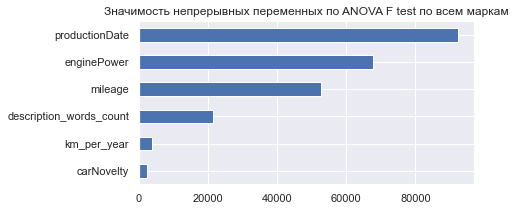

In [260]:
# Оценим значимость числовых признаков
fig, ax = plt.subplots(figsize=(6, 3))
anova_df = data[data['train'] == 1].dropna().copy()
imp_num = pd.Series(f_regression(anova_df[list(set(data.columns) & set(num_cols))], anova_df['price_log'])[
                    0], index=list(set(data.columns) & set(num_cols)))
imp_num.sort_values(inplace=True)
imp_num.plot(
    kind='barh', title='Значимость непрерывных переменных по ANOVA F test по всем маркам')
plt.show()

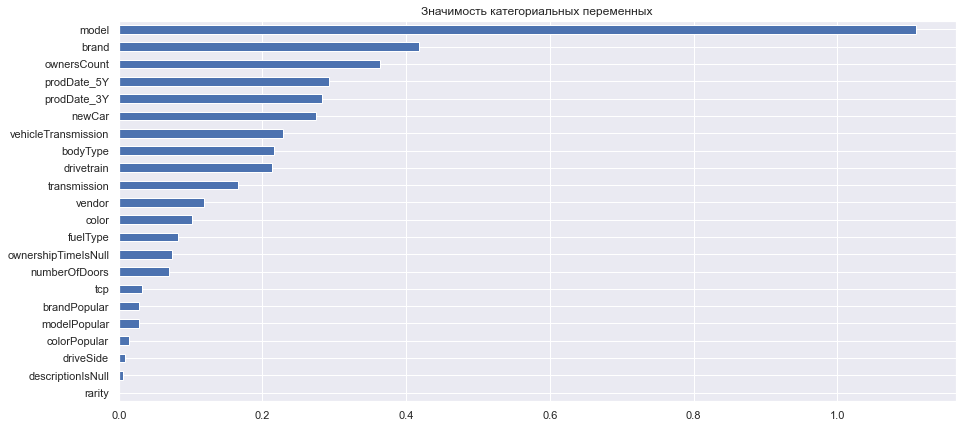

In [261]:
# Оценим значимость бинарных и категориальных признаков
fig, ax = plt.subplots(figsize=(15, 7))

anova_df = data[data['train'] == 1].dropna().copy()

# Labels encoding
cols_to_encode = list(set(anova_df.columns) & set(cat_cols))
for colum in cols_to_encode:
    anova_df[colum] = anova_df[colum].astype('category').cat.codes

imp_cat = pd.Series(mutual_info_regression(
    anova_df[list(set(data.columns) & set(bin_cols+cat_cols))], anova_df['price'], discrete_features=True), index=list(set(data.columns) & set(bin_cols+cat_cols)))
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind='barh', title='Значимость категориальных переменных')
plt.show()

Выводы:
1. Из числовых признаков очень сильное влияние имеет `prodcutionDate`, `mileage`, `enginePower`
2. Из категориальных и бинарных самое сильное влияние оказывает `model`, `brand`, `ownersCount`. Минимальное влияние у признаков - `rarity`, `descriptionsNull`. 

## <a id="4"></a> 4. ML DATA PREPARATION

**Стандартизация числовых признаков**

In [262]:
# Стандартизация числовых переменных
#cols_to_scale = list(set(data.columns) & set(num_cols))
#data[cols_to_scale] = StandardScaler().fit_transform(data[cols_to_scale].values)

Закомментировано, т.к. стандартизация числовых признаков не показало влияния на целевую метрику.

####   Выделим тестовую и тренировочную части

In [263]:
X = data.query('train == 1').drop(
    ['train', 'price', 'price_log', 'price_usd', 'RUB_USD_rate'], axis=1)
X_sub = data.query('train == 0').drop(
    ['train', 'price', 'price_log', 'price_usd', 'RUB_USD_rate'], axis=1)

In [264]:
# В качестве y указываем обычную цену
y = data[data.train == 1]['price']

In [265]:
# В качестве y указываем цену в USD
#y = data[data.train == 1]['price_usd']

Комментрий: цена, переведенная в USD не показала значительного прироста метрики, поэтому брали обычную цену.

#### Train Split

In [266]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=VAL_SIZE, shuffle=True, random_state=RANDOM_SEED)

# <a id="5"></a> 5. MODEL 1. NAIVE MODEL
Эта модель будет предсказывать среднюю цену по модели двигателя (`mileage`). 
C ней будем сравнивать другие модели.

In [267]:
tmp_train = X_train.copy()
tmp_train['price'] = y_train

In [268]:
# Находим median по экземплярам mileage в трейне и размечаем тест
predict = X_test['mileage'].map(
    tmp_train.groupby('mileage')['price'].median())

# оцениваем точность
print(
    f"Точность наивной модели по метрике MAPE: {(mape(y_test, predict.values))*100:0.2f}%")

Точность наивной модели по метрике MAPE: 72.97%


# <a id="6"></a> 6. MODEL 2 : CatBoost

In [269]:
model = CatBoostRegressor(iterations=5000,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True,
                          )
model.fit(X_train, y_train,
          # cat_features=cat_features_ids,
          eval_set=(X_test, y_test),
          verbose_eval=0,
          use_best_model=True,
          # plot=True
          )

model.save_model('catboost_single_model_baseline.model')

In [270]:
# оцениваем точность
predict = model.predict(X_test)
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict))*100:0.2f}%")

Точность модели по метрике MAPE: 15.42%


#### Log Traget

In [271]:
np.log(y_train)

46979   14.37
70754   13.12
62123   14.15
46405   13.73
22749   10.60
         ... 
6265    14.32
54886   13.65
76820   15.87
860     12.43
15795   12.04
Name: price, Length: 69452, dtype: float64

In [272]:
model = CatBoostRegressor(iterations=5000,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True,
                          )
model.fit(X_train, np.log(y_train),
          # cat_features=cat_features_ids,
          eval_set=(X_test, np.log(y_test)),
          verbose_eval=0,
          use_best_model=True,
          # plot=True
          )

model.save_model('catboost_single_model_2_baseline.model')

In [273]:
predict_test = np.exp(model.predict(X_test))
predict_submission = np.exp(model.predict(X_sub))

In [274]:
print(
    f"Точность модели по метрике MAPE: {(mape(y_test, predict_test))*100:0.2f}%")

Точность модели по метрике MAPE: 12.62%


# <a id="7"></a> 7. MODELS via LazyPredict

Воспользуемся библиотекой `Lazypredict` для нахождения моделей, которые на дефолтных параметрах отрабатывают лучше с нашими данными. Так как модели с логарифмом таргета показывают лучшие оценки MAPE, то в дальнейшем при построении моделей будем использовать логарифм таргета.

In [276]:
#mae = mean_absolute_error
#regr=LazyRegressor(verbose=0,predictions=True, custom_metric=mae)
# fit and train the model
# start_time_2=time.time()
#models, predictions=regr.fit(X_train, X_test, np.log(y_train), np.log(y_test))
# end_time_2=time.time()

In [278]:
# models

Поскольку выполнение операции очень трудозатратное и выполнимо не на всех мощностях, то комментрируем код, а результат прилагаем скриншотом.

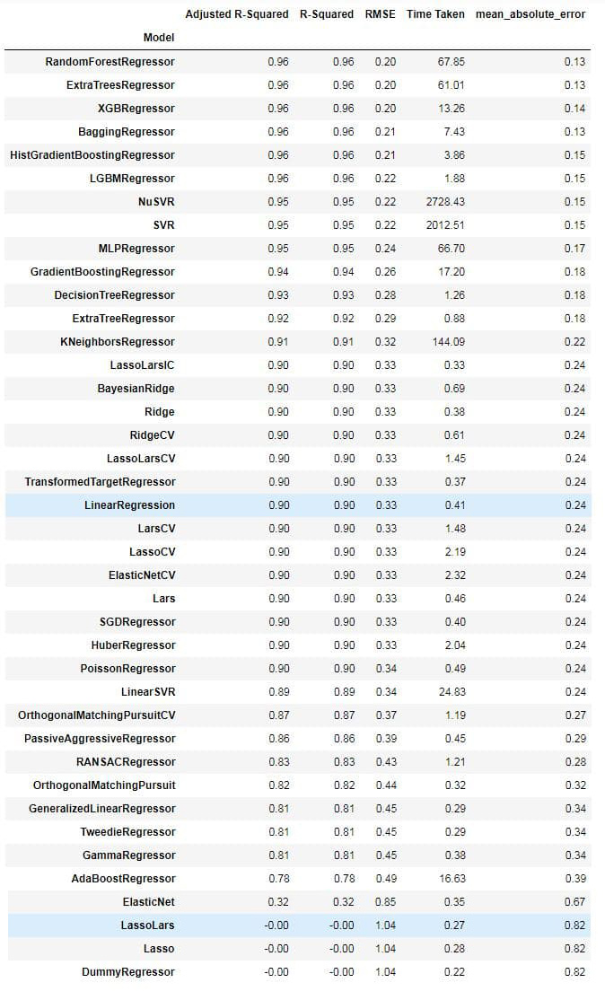

Вывод: используя LazyRegressor получили лучших 5 моделей для нашего набора данных:
- RandomForestRegressor
- XGBRegressor	
- ExtraTreesRegressor
- BaggingRegressor	
- HistGradientBoostingRegressor

В отдельности попробуем каждую из моделей, чтобы найти лучшую.

# <a id="8"></a> 8. MODEL 3: RandomForestRegressor

In [9]:
# Построим модель на дефолтных параметрах
# без логарифмирования целевой переменной
# rf = RandomForestRegressor(random_state = RANDOM_SEED)
# rf.fit(X_train, y_train)
# rf_pred = rf.predict(X_test)

# print(
#     f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, rf_pred))*100:0.2f}%")

# # с логарифмированием целевой переменной
# rf_log = RandomForestRegressor(random_state = RANDOM_SEED)
# rf_log.fit(X_train, np.log(y_train))
# rf_log_pred = np.exp(rf_log.predict(X_test))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, rf_log_pred))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.89%
# Точность модели на kaggle MAPE 12,12418%

Точность модели по метрике MAPE с логтаргетом: 12.89%


In [11]:
# # Попробуем подобрать гиперпараметры для нашей модели

# random_grid = {'n_estimators': [int(x) for x in np.linspace(start=100, stop=400, num=4)],
#                'max_features': ['auto', 'sqrt', 'log2'],
#                'max_depth': [int(x) for x in np.linspace(5, 15, num=6)] + [None],
#                'min_samples_split': [2, 5, 10],
#                'min_samples_leaf': [1, 2, 4],
#                'bootstrap': [True, False]}

# rfr = RandomForestRegressor(random_state=RANDOM_SEED)
# rf_random = RandomizedSearchCV(estimator=rfr, param_distributions=random_grid,
#                                n_iter=100, cv=3, verbose=10, random_state=RANDOM_SEED, n_jobs=-1)

# rf_random.fit(X_train, np.log(y_train))
# rf_random.best_params_

# # Лучшими оказались следующие параметры:
#  best_params_
#  {'bootstrap': True,
#   'max_depth': None,
#   'max_features': 'auto',
#   'min_samples_leaf': 1,
#   'min_samples_split': 2,
#   'n_estimators': 300}
#  rf_random.best_estimator_ = RandomForestRegressor(n_estimators=300, random_state=42)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 21.6min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed: 28.0min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed: 40.6min
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed: 43.4min
[Parallel(n_jobs=-1)]: Done 109 tasks      | elapsed: 46.6min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed: 51.1min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed: 55

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

In [9]:
# # Обучим модель на лучших гиперпараметрах

# #best_rfr = rf_random.best_estimator_
# best_rfr = RandomForestRegressor(random_state=RANDOM_SEED
#                       , n_estimators=300
#                       , min_samples_split=2
#                       , min_samples_leaf=1
#                       , max_features='auto'
#                       , max_depth=None
#                       , bootstrap=True)

# # best_rfr.fit(X_train, y_train)
# best_rfr.fit(X_train, np.log(y_train))

# # predict_rfr = best_rfr.predict(X_test)
# predict_rfr = np.exp(best_rfr.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_rfr))*100:0.2f}%")

# # Точность модели по метрике MAPE с логтаргетом: 12.84%
# # Точность модели на kaggle MAPE 12.05232%

Точность модели по метрике MAPE с логтаргетом: 12.84%


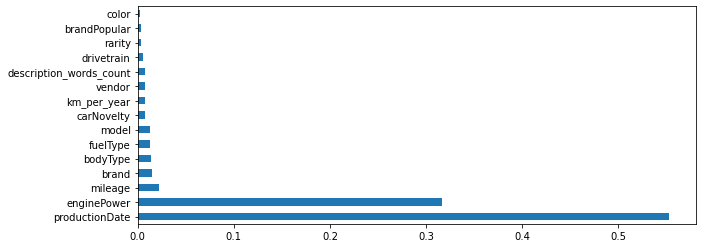

In [10]:
# # в RandomForestRegressor есть возможность вывести самые важные признаки для модели
# plt.rcParams['figure.figsize'] = (10,4)
# feat_importances = pd.Series(best_rfr.feature_importances_, index=X.columns)
# feat_importances.nlargest(15).plot(kind='barh');

# <a id="9"></a> 9. MODEL 4: XGBRegressor

In [19]:
# # можно попробовать менять learning_rate (0.05, 0.03, 0.01), max_depth (3,5,8,12,24,36)

# # без логарифмирования целевой переменной
# xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
#                           learning_rate=0.05, max_depth=12, alpha=1,
#                           n_estimators=1000)
# xgb_reg.fit(X_train, y_train)
# print(
#     f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, xgb_reg.predict(X_test)))*100:0.2f}%")

# с логарифмированием целевой переменной
# xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
#                           learning_rate=0.05, max_depth=12, alpha=1,
#                           n_estimators=1000)
# xgb_reg.fit(X_train, np.log(y_train))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, np.exp(xgb_reg.predict(X_test))))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.96%
# # Точность модели на kaggle MAPE 12.33125%

Попробуем с логарифмом таргета разную глубину

In [20]:
# Попробуем с логарифмом таргета разную глубину

# def xgb_reg_learn(depth):
#     xgb_list = []
#     for i in depth:
#         xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
#                                         learning_rate=0.05, max_depth=i, alpha=1,
#                                         n_estimators=1000)
#         xgb_reg.fit(X_train, np.log(y_train))
#         xgb_list.append(xgb_reg)
#         print(
#             f"Точность модели по метрике MAPE с логтаргетом и max_depth={i}: {(mape(y_test, np.exp(xgb_reg.predict(X_test))))*100:0.2f}%")
#     return xgb_list

# depth = [3,5,8,12,24,36]
# xgb_list = xgb_reg_learn(depth)

# Точность модели по метрике MAPE с логтаргетом и max_depth=3: 15.41%
# Точность модели по метрике MAPE с логтаргетом и max_depth=5: 13.31%
# Точность модели по метрике MAPE с логтаргетом и max_depth=8: 12.28%
# Точность модели по метрике MAPE с логтаргетом и max_depth=12: 12.22%
# Точность модели по метрике MAPE с логтаргетом и max_depth=24: 12.31%
# Точность модели по метрике MAPE с логтаргетом и max_depth=36: 12.31%
# Точность модели на kaggle MAPE 11.3500%

In [21]:
# Параметры лучшей модели
# best_xgb = xgb_list[3]
# best_xgb

# XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
#              colsample_bynode=1, colsample_bytree=0.5, gamma=0, gpu_id=-1,
#              importance_type='gain', interaction_constraints='',
#              learning_rate=0.05, max_delta_step=0, max_depth=12,
#              min_child_weight=1, missing=nan, monotone_constraints='()',
#              n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
#              reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
#              tree_method='exact', validate_parameters=1, verbosity=None)

In [22]:
# feature_important = best_xgb.get_booster().get_score(importance_type='weight')
# keys = list(feature_important.keys())
# values = list(feature_important.values())

# data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
# data.plot(kind='barh');

# <a id="10"></a> 10. MODEL 5: ExtraTreesRegressor

In [23]:
# Построим модель на дефолтных параметрах

# # без логарифмирования целевой переменной
# etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
# etr.fit(X_train, y_train)
# etr_pred = etr.predict(X_test)

# print(
#     f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, etr_pred))*100:0.2f}%")

# # с логарифмированием целевой переменной
# etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
# etr.fit(X_train, np.log(y_train))
# etr_pred = np.exp(etr.predict(X_test))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, etr_pred))*100:0.2f}%")

# # Точность модели по метрике MAPE с логтаргетом: 13.10%
# Точность модели на kaggle MAPE 10.95491%

In [64]:
# # Попробуем подобрать гиперпараметры для нашей модели

# random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 400, num = 4)],
#                'max_features': ['auto', 'sqrt','log2'],
#                'max_depth': [int(x) for x in np.linspace(5, 15, num = 6)] + [None],
#                'min_samples_split': [2, 5, 10],
#                'min_samples_leaf': [1, 2, 4],
#                'bootstrap': [True, False]}

# etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
# etr_random = RandomizedSearchCV(estimator = etr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=10, random_state=RANDOM_SEED, n_jobs = -1)
# # rf_random.fit(X_train, y_train)
# etr_random.fit(X_train, np.log(y_train))
# etr_random.best_params_

# Лучшие параметры для нашей модели
#  best_params_
# {'n_estimators': 300,
#  'min_samples_split': 2,
#  'min_samples_leaf': 1,
#  'max_features': 'auto',
#  'max_depth': None,
#  'bootstrap': True}

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed: 24.4min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 25.2min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 28.5min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed: 31.6min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed: 38.2min
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed: 39.8min
[Parallel(n_jobs=-1)]: Done 109 tasks      | elapsed: 41.5min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed: 44.2min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed: 46

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

In [24]:
# # Обучим модель на лучших гиперпараметрах

# best_etr = ExtraTreesRegressor(random_state=RANDOM_SEED,
#                                n_estimators=300,
#                                min_samples_split=2,
#                                min_samples_leaf=1,
#                                max_features='auto',
#                                max_depth=None,
# best_etr.fit(X_train, np.log(y_train))

# predict_etr = np.exp(best_etr.predict(X_test))
# predict_submission = np.exp(best_etr.predict(X_sub))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_etr))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.89%
# Точность модели на kaggle MAPE 12.09228%

In [25]:
# plt.rcParams['figure.figsize'] = (10,4)
# feat_importances = pd.Series(best_etr.feature_importances_, index=X.columns)
# feat_importances.nlargest(15).plot(kind='barh');

# <a id="11"></a> 11. MODEL 6: BaggingRegressor

## 11.1. со случайным лесом

In [27]:
# best_rfr
# RandomForestRegressor(n_estimators=300, random_state=42)

In [18]:
# Обучим на дефолтных параметрах

# bagg_rfr_d = BaggingRegressor(best_rfr, n_jobs=1, random_state=RANDOM_SEED)
# bagg_rfr_d.fit(X_train, np.log(y_train))
# predict_bagg_rfr_d = np.exp(bagg_rfr_d.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_rfr_d))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 13.00%
# Точность модели на kaggle MAPE 13.12%

Точность модели по метрике MAPE с логтаргетом: 13.00%


In [15]:
# Добавим к параметрам n_estimators=3

# bagg_rfr = BaggingRegressor(best_rfr, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
# bagg_rfr.fit(X_train, np.log(y_train))
# predict_bagg_rfr = np.exp(bagg_rfr.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_rfr))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 13.19%
# Точность модели на kaggle MAPE 13.31105%

Точность модели по метрике MAPE с логтаргетом: 13.19%


## 11.2. с XGBRegressor

In [ ]:
# best_xgb

# XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
#              colsample_bynode=1, colsample_bytree=0.5, gamma=0, gpu_id=-1,
#              importance_type='gain', interaction_constraints='',
#              learning_rate=0.05, max_delta_step=0, max_depth=12,
#              min_child_weight=1, missing=nan, monotone_constraints='()',
#              n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
#              reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
#              tree_method='exact', validate_parameters=1, verbosity=None)

In [28]:
# Обучим на дефолтных параметрах

# bagg_xgb = BaggingRegressor(best_xgb, n_jobs=1, random_state=RANDOM_SEED)
# bagg_xgb.fit(X_train, np.log(y_train))
# predict_bagg_xgb = np.exp(bagg_xgb.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_xgb))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.18%
# Точность модели на kaggle MAPE 13.31105%

In [29]:
# Добавим к параметрам n_estimators=3

# bagg_xgb = BaggingRegressor(best_xgb, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
# bagg_xgb.fit(X_train, y_train)
# predict_bagg_xgb = np.exp(bagg_xgb.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_xgb))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.29%
# Точность модели на kaggle MAPE 12.07452%

## 11.3. с ExtraTreesRegressor

In [30]:
# etr
# ExtraTreesRegressor(random_state=42)

In [31]:
# Обучим на дефолтных параметрах

# bagg_etr = BaggingRegressor(etr, n_jobs=1, random_state=RANDOM_SEED)
# bagg_etr.fit(X_train, np.log(y_train))
# predict_bagg_etr = np.exp(bagg_etr.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_etr))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 12.92%
# Точность модели на kaggle MAPE 11.91719%

In [32]:
# Добавим к параметрам n_estimators=3

# bagg_etr = BaggingRegressor(etr, n_jobs=1, n_estimators = 3, random_state=RANDOM_SEED)
# bagg_etr.fit(X_train, np.log(y_train))
# predict_bagg_etr = np.exp(bagg_etr.predict(X_test))
# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_etr))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 13.12%
# Точность модели на kaggle MAPE 12.41893%

# <a id="12"></a> 12. MODEL 7: HistGradientBoostingRegressor

In [90]:
# Запускаем дефолтную модель на логорифме цены

# hgbr = HistGradientBoostingRegressor(random_state=RANDOM_SEED)

# hgbr.fit(X_train, np.log(y_train))

# hgbr_pred = np.exp(hgbr.predict(X_test))
# predict_submission = np.exp(hgbr.predict(X_sub))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, hgbr_pred))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 15.28%
# Точность модели на kaggle MAPE: 16.10811%

In [33]:
# Запускаем RandomizedSearchCV для HistGradientBoostingRegressor.

# random_grid = {'max_iter': [1000, 1200, 1500],
#                'learning_rate': [0.1],
#                'max_depth': [25, 50, 75],
#                'l2_regularization': [1.5]}

# hgbr = HistGradientBoostingRegressor(random_state=RANDOM_SEED)
# hgbr_random = RandomizedSearchCV(estimator=hgbr,
#                                  param_distributions=random_grid,
#                                  n_iter=100, cv=3,
#                                  verbose=10,
#                                  random_state=RANDOM_SEED,
#                                  n_jobs=-1)

# hgbr_random.fit(X_train, np.log(y_train))

# Лучшие параметры:
# hgbr_random.best_params_
# {'max_iter': 1000,
# 'max_depth': 25,
# 'learning_rate': 0.1,
# 'l2_regularization': 1.5}

In [34]:
# Запускаем HistGradientBoostingRegressor на найденных параметрах

# hgbr = HistGradientBoostingRegressor(random_state=RANDOM_SEED, max_iter =1000,
#                                      max_depth=25,
#                                      learning_rate=0.1,
#                                      l2_regularization=1.5)

# hgbr.fit(X_train, np.log(y_train))

# hgbr_pred = np.exp(hgbr.predict(X_test))
# predict_submission = np.exp(hgbr.predict(X_sub))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, hgbr_pred))*100:0.2f}%")

# Точность модели по метрике MAPE с логтаргетом: 13.16%
# Точность модели на kaggle MAPE: 13.61184%

# <a id="13"></a> 13. MODEL 8. StackingRegressor

Нужно выбрать 2 или 3 лучших модели для стекинга, определить какую модель лучше взять последней (решающей).

Брать много сложных моделей не будем, так как даже при 2-3 моделях выполнение обучения идет достаточно долго.
Выбирем для стекинга самые лучшие модели,  которые мы получили: Xgboosting, ExtraTreesRegressor. Для обработки результатов в качестве последней попробуем взять линейную регрессию и CatBoosting.

### 13.1 Xgboosting, ExtraTreesRegressor+LinearRegression

In [36]:
# estimators = [('etr',ExtraTreesRegressor()),
#               ('xgb_reg',xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5, learning_rate=0.05, \
#                       max_depth=12, alpha=1, n_jobs=-1, n_estimators=1000))]

# st_ensemble = StackingRegressor(estimators=estimators,final_estimator=LinearRegression())

# # оцениваем точность
# st_ensemble.fit(X_train, np.log(y_train))
# predict_e = np.exp(st_ensemble.predict(X_test))
# print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_e))*100:0.2f}%")

# Точность модели по метрике MAPE: 12.10%
# Точность модели на kaggle MAPE 10.98%

### 13.2 Xgboosting, ExtraTreesRegressor+CatBoostRegressor

In [37]:
# estimators = [('etr',ExtraTreesRegressor()),
#               ('xgb_reg',xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5, learning_rate=0.05, \
#                       max_depth=12, alpha=1, n_jobs=-1, n_estimators=1000))]

# st_ensemble = StackingRegressor(estimators=estimators,final_estimator=CatBoostRegressor())

# # оцениваем точность
# st_ensemble.fit(X_train, np.log(y_train))
# predict_e = np.exp(st_ensemble.predict(X_test))
# print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_e))*100:0.2f}%")

# Точность модели по метрике MAPE: 12.28%
# Точность модели на kaggle MAPE 11.14844%

**Кроме этих 2-х моделей стекинга, мы попробовали сделали стекинг с не самыми лучшими моделями и LinearRegression**

### 13.3 RandomForestRegressor, ExtraTreesRegressor+LinearRegression

In [39]:
# estimators = [('rfr', RandomForestRegressor(random_state=RANDOM_SEED
#                       , n_estimators=300
#                       , min_samples_split=2
#                       , min_samples_leaf=1
#                       , max_features='auto'
#                       , max_depth=None
#                       , bootstrap=True)),
#               ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

# st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# # оцениваем точность
# st_ensemble_1.fit(X_train, np.log(y_train))
# predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
# print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")

# Точность модели по метрике MAPE: 12.64%
# Точность модели на kaggle MAPE 11.19165%

### 13.4 BaggingRegressor(xgb.XGBRegressor), ExtraTreesRegressor+LinearRegression

In [40]:
# estimators = [('bagr', BaggingRegressor(xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
#                           learning_rate=0.05, max_depth=12, alpha=1,
#                           n_estimators=1000), n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)),
#               ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

# st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# # оцениваем точность
# st_ensemble_1.fit(X_train, np.log(y_train))
# predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
# print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")

# Точность модели по метрике MAPE: 12.16%
# Точность модели на kaggle MAPE 11.44763%

### 13.5 BaggingRegressor(ExtraTreesRegressor), ExtraTreesRegressor+LinearRegression

In [1]:
# estimators = [('bagr', BaggingRegressor(ExtraTreesRegressor(random_state = RANDOM_SEED), n_jobs=1, random_state=RANDOM_SEED)),
#               ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

# st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# # оцениваем точность
# st_ensemble_1.fit(X_train, np.log(y_train))
# predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
# print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")
# Точность модели по метрике MAPE: 12.93%
# Точность модели на kaggle MAPE %

# <a id="14"></a> 14. MODEL SELECTION

Во время исследования все модели запускались много раз. У нас были следующие **параметры для проверки**:
1. логорифмировать или нет числовые признаки
2. выбор обработки категориальных данных: OneHotEncoder, LabelEncoding
3. проводить или нет стандартизацию данных перед обучением
4. использовать логарифм таргета или нет
5. использовать в качестве таргета приведение цены к ценам 2020 в зависимости от курса доллара, т.е. в качества таргета использовать `price_usd`
6. удалять или не удалять после анализа какие-то признаки для обучения модели

**Результаты:**
- стандартизация данных перед обучением не привела к существенному улучшению метрики MAPE, поэтому от стандартизации отказались
- использование в качестве таргете `price_usd` не принесло сильного улучшение результата на kaggle, решено было от него отказаться
- удаление каких-либо дополнительных признаков, кроме как сильно коллинеарных или с большим количеством пропусков, для модели только ухудшило метрику MAPE, отказались от удаления признаков из обучения.

**Таблица с результатами экспериментов:**

<table class="table">
  <thead>
    <tr>
      <th scope="col">Models/Metrics</th>
      <th scope="col">LazyPredic MAE</th>
      <th scope="col">Default Settings Train MAPE</th>
      <th scope="col">Default Settings Kaggle  MAPE</th>
      <th scope="col">Tuned Hyperparameter Train MAPE</th>
      <th scope="col">Tuned Hyperparameter Kaggle MAPE</th>
      <th scope="col">Comment</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>CatBoost</th>
      <td>-</td>
      <td>12.62%</td>
      <td>13.02%</td>
      <td>12.56%</td>
      <td>13.38%</td>
      <td>tuned: added cat_features_ids</td>
    </tr>
    <tr>
      <th>RandomForestRegressor</th>
      <td>0.13</td>
      <td>12.89%</td>
      <td>12.12%</td>
      <td>12.84%</td>
      <td>12.05%</td>
      <td>-</td>
    </tr>
    <tr>
      <th>ExtraTreesRegressor</th>
      <td>0.13</td>
      <td>13.10%</td>
      <th>10.95%</th>
      <td>12.89%</td>
      <td>12.09%</td>
      <td>-</td>
    </tr>
    <tr>
      <th>XGBRegressor</th>
      <td>0.14</td>
      <td>12.96%</td>
      <td>12.33%</td>
      <td>12.22%</td>
      <th>11.35%</th>
      <td>default model: learning_rate=0.05 best model: max_depth=12 learning_rate=0.05: 12.18%</td>
    </tr>
    <tr>
      <th>BagginRegressor</th>
      <td>0.13</td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>BagginRegressor с ExtraTreesRegressor</th>
      <td>-</td>
      <td>12.92%</td>
      <td>11.92%</td>
      <td>13.12%</td>
      <td>12.42%</td>
      <td>default: без n_estimators tunes: n_estimators = 3</td>
    </tr>
    <tr>
      <th>BagginRegressor с RandomForestRegressor</th>
      <td>-</td>
      <td>13.00%</td>
      <td>13.12%</td>
      <td>13.19%</td>
      <td>13.31%</td>
      <td>default: без n_estimators tunes: n_estimators = 3</td>
    </tr>
      <tr>
      <th>BagginRegressor с XGBRegressor</th>
      <td>-</td>
      <td>12.18%</td>
      <td>13.31%</td>
      <td>12.29%</td>
      <td>12.07%</td>
      <td>default: без n_estimators tunes: n_estimators = 3</td>
    </tr>
  <tr>
      <th>HistGradientBoostingRegressor</th>
      <td>0.15</td>
      <td>15.28%</td>
      <td>16.11%</td>
      <td>13.16%</td>
      <td>13.61%</td>
      <td></td>
    </tr>
    <tr>
      <th>StackingRegressor</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Xgboosting, ExtraTreesRegressor+LinearRegression</th>
      <td></td>
      <td>12.10%</td>
      <th>10.98%</th>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Xgboosting, ExtraTreesRegressor+CatBoostRegressor</th>
      <td></td>
      <td>12.28%</td>
      <td>11.15%</td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>RandomForestRegressor, ExtraTreesRegressor+LinearRegression</th>
      <td></td>
      <td>12.64%</td>
      <td>11.19%</td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>BaggingRegressor(xgb.XGBRegressor), ExtraTreesRegressor+LinearRegression</th>
      <td></td>
      <td>12.16%</td>
      <td>11.45%</td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>BaggingRegressor(ExtraTreesRegressor), ExtraTreesRegressor+LinearRegression</th>
      <td></td>
      <td>12.93%</td>
      <td>11.56%</td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
  </tbody>
</table>

**Модель**:

Наилучшую метрику MAPE на наших данных показывали модели на основе "деревьев" и бустинг.

Наиболее лучшие значения этой метрики были у следующих моделей:
- `ExtraTreesRegressor` с дефолтными параметрами и значением MAPE=10.95%
- `Xgboosting, ExtraTreesRegressor+LinearRegression` (модель стекинга с наилучшими моделями и последней линейнок регрессией) значение MAPE=10.98%
- `XGBRegressor` с параметрами max_depth=12 learning_rate=0.05 и значением MAPE=11.35%.

В целом стекинг приводит к неплохим результатам, улучшая нашу метрику.  


Однако, лучшей моделью для наших данных стала модель `ExtraTreesRegressor` с дефолтными параметрами и значением MAPE=10.95%.

**Запустим финальную модель для сабмита**

Данный кусочек кода копирует эксперимент выше (сделано для ускорения запуска ноутбука, чтоб не прогонять все модели).

In [276]:
# Построим модель на дефолтных параметрах
# с логарифмированием целевой переменной
etr = ExtraTreesRegressor(random_state=RANDOM_SEED)
etr.fit(X_train, np.log(y_train))
etr_pred = np.exp(etr.predict(X_test))

print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, etr_pred))*100:0.2f}%")

Точность модели по метрике MAPE с логтаргетом: 13.10%


# <a id="14"></a> 15. SUBMISSION

Сформируем сабмишн файл. Для сабмишена будем использовать округление до тысяч, т.к. цены на машины редко используют детальные значения до рубля и копейки.

In [277]:
# Для финального сабмишена выбран np.exp(etr.predict(X_sub))
predict_submission = np.exp(etr.predict(X_sub))

sample_submission['price'] = np.round(
    np.array(predict_submission)/1000, 2)*1000
sample_submission.to_csv(f'submission_2_v{VERSION}.csv', index=False)
sample_submission.head(10)

,sell_id,price
0,1100575026,549000.00
1,1100549428,895000.00
2,1100658222,872440.00
3,1100937408,676590.00
4,1101037972,675380.00
5,1100912634,744890.00
6,1101228730,568730.00
7,1100165896,396760.00
8,1100768262,1489810.00
9,1101218501,804470.00


# <a id="16"></a> 16. SUMMARY

1. Для обогощения данных была проведена работа по **парсингу данных с auto.ru**:
    - код парсинга новых данных доступе в отдельном ноутбуке на Git - [[SF-DST Car Price Prediction] Parsing Data DSPR-28.ipynb](https://github.com/juliiik/SF_DSPR_28_Gil/blob/main/module_6/%5BSF-DST%20Car%20Price%20Prediction%5D%20Parsing%20Data%20DSPR-28.ipynb).
    - по результатам парсинга нами были получены данные для обучающего датасета в размере `137685` записей
    - Путь к файлу: Kaggle: ../input/autorucars/all_car_27_08_2021_data_12_brands.csv [Github](https://github.com/juliiik/SF_DSPR_28_Gil/blob/main/module_6/all_car_27_08_2021_data_12_brands.csv)

2. В ходе **EDA** были совмещены старые и новые данные для обучения с auto.ru, проведена очистка и унификация данных, обработка пустых значений, дубликатов, проведен минимально достаточный отбор признак с помощью корреляционного анализа. Были созданы новые признаки:
    - `km_per_year` - показывает, сколько км в год проезжал автомобиль. Вычисляется, как `mileage`/`productionDate`(years) или `mileage`/`ownershipTime`. Решить, какой метод использовать
    - `carNovelty` - показывает, через сколько лет после выхода модели был выпущен автомобиль, т.е. modelDate - productionDate. 
    - `rarity - признак, показывающий, что автомобиль раритетный (ему более 30 лет)
    - `prodDate_3Y` - признак, что автомобилю уже 3 года
    - `prodDate_5Y` - признак, что автомобилю уже 5 лет
    - `newCar` - признак для обозначения новых авто, пробег равен 0
    - `descriptionIsNull` - признак, показывающий наличие или отсутствие объясления
    - `ownershipTimeIsNull` - показывает, заполнено ли время владения авто: 1 - не заполнено, 0 - заполнено
    - `colorPopular` - признак для обозначения, что авто популярного цвета: 1 - популярного, 0 - непопулярного
    - `brandPopular` - признак для обозначения, что авто популярной марки: 1 - популярного, 0 - непопулярного
    - `modelPopular` - признак для обозначения, что авто популярной модели в рамках бренда: 1 - популярного, 0 - непопулярного.

3. По результатам **моделирования** наилучшую метрику MAPE на наших данных показывали модели на основе "деревьев" и бустинг. 
    - С помощью Lazy Predict смогли отобрать 5-ку наилучших моделей, на которых проводили дальнейшие эксперименты. 
    - Наиболее лучшие значения этой метрики были у следующих моделей:
        - `ExtraTreesRegressor` с дефолтными параметрами и значением MAPE=10.95%
        - `Xgboosting, ExtraTreesRegressor+LinearRegression` (модель стекинга с наилучшими моделями и последней линейнок регрессией) значение MAPE=10.98%
        - `XGBRegressor` с параметрами max_depth=12 learning_rate=0.05 и значением MAPE=11.35%
        - В целом стекинг приводит к неплохим результатам, улучшая нашу метрику.  
    - Однако, лучшей моделью для наших данных стала модель `ExtraTreesRegressor` с дефолтными параметрами и значением MAPE=10.95%.
4. Была выполнена **работа в команде**:
    - работали по [плану работ команды](https://docs.google.com/spreadsheets/d/1ZNuAuKiX1eAxQJlAPlvRofNXmlvBpAK3i5o6QDyCOw0/edit?usp=sharing0)
    - технически использовали Github & Google Colab, чаты и звонки
5. Команда по результатам работы на момент 09.09.2021 занимает **14 позицию на leaderboard (10.95%)**.